In [1]:
from sklearn import svm # for Discriminator
from sklearn.model_selection import train_test_split # for train-test split 
from sklearn.preprocessing import StandardScaler # for feature scaling
from sklearn.model_selection import GridSearchCV # for fine-tuning
from sklearn.metrics import make_scorer, balanced_accuracy_score # for evaluation
from sklearn.pipeline import make_pipeline # for prediction

In [2]:
# for Generator
from scipy import stats # for sampling
from fitter import Fitter # for fitting the best distribution
import copy # for copying nested dictionaries

In [3]:
import matplotlib.pyplot as plt  # for visualization 
import seaborn as sns  # for coloring 

# set style of graphs
plt.style.use('dark_background')
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5

In [4]:
import pandas as pd

In [5]:
import numpy as np

In [6]:
df = pd.read_csv("games.csv")
df.head() 

,GAME_DATE_EST,GAME_ID,GAME_STATUS_TEXT,HOME_TEAM_ID,VISITOR_TEAM_ID,SEASON,TEAM_ID_home,PTS_home,FG_PCT_home,FT_PCT_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-03-12,22101005,Final,1610612748,1610612750,2021,1610612748,104.0,0.398,0.760,...,23.0,53.0,1610612750,113.0,0.422,0.875,0.357,21.0,46.0,0
1,2022-03-12,22101006,Final,1610612741,1610612739,2021,1610612741,101.0,0.443,0.933,...,20.0,46.0,1610612739,91.0,0.419,0.824,0.208,19.0,40.0,1
2,2022-03-12,22101007,Final,1610612759,1610612754,2021,1610612759,108.0,0.412,0.813,...,28.0,52.0,1610612754,119.0,0.489,1.000,0.389,23.0,47.0,0
3,2022-03-12,22101008,Final,1610612744,1610612749,2021,1610612744,122.0,0.484,0.933,...,33.0,55.0,1610612749,109.0,0.413,0.696,0.386,27.0,39.0,1
4,2022-03-12,22101009,Final,1610612743,1610612761,2021,1610612743,115.0,0.551,0.750,...,32.0,39.0,1610612761,127.0,0.471,0.760,0.387,28.0,50.0,0


## Predicting NBA playoff results with simulation

### Background:
NBA playoff is a best-of-seven elimination tournament.

There are 16 competing teams; 8 initial pairs.

Each pair will play up-to 7 games, so it takes 4 games to win.

A total of 4 rounds are required to win the championship 🏆.

### Our Goal:
Our goal is to predict the probability of winning for each team and at each round of the playoff, in order to see who may win the championship.

### Workflow:
Data cleaning

Fit a win/loss Discriminator(D)

Fit a feature Generator(G)

Run n_simulations with both D and G according to the rules of playoff

Visualization

### 1. Data Cleaning

In [7]:
df = pd.read_csv("games.csv")
df.head() 

,GAME_DATE_EST,GAME_ID,GAME_STATUS_TEXT,HOME_TEAM_ID,VISITOR_TEAM_ID,SEASON,TEAM_ID_home,PTS_home,FG_PCT_home,FT_PCT_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-03-12,22101005,Final,1610612748,1610612750,2021,1610612748,104.0,0.398,0.760,...,23.0,53.0,1610612750,113.0,0.422,0.875,0.357,21.0,46.0,0
1,2022-03-12,22101006,Final,1610612741,1610612739,2021,1610612741,101.0,0.443,0.933,...,20.0,46.0,1610612739,91.0,0.419,0.824,0.208,19.0,40.0,1
2,2022-03-12,22101007,Final,1610612759,1610612754,2021,1610612759,108.0,0.412,0.813,...,28.0,52.0,1610612754,119.0,0.489,1.000,0.389,23.0,47.0,0
3,2022-03-12,22101008,Final,1610612744,1610612749,2021,1610612744,122.0,0.484,0.933,...,33.0,55.0,1610612749,109.0,0.413,0.696,0.386,27.0,39.0,1
4,2022-03-12,22101009,Final,1610612743,1610612761,2021,1610612743,115.0,0.551,0.750,...,32.0,39.0,1610612761,127.0,0.471,0.760,0.387,28.0,50.0,0


In [8]:
# sort dataframe by date
df = df.sort_values(by='GAME_DATE_EST').reset_index(drop = True)
# drop empty entries, data before 2004 contains NaN
df = df.loc[df['GAME_DATE_EST'] >= "2004-01-01"].reset_index(drop=True)
# check null
df.isnull().values.any() 

False

In [9]:
# replace Team ID with Names
df_names = pd.read_csv('teams.csv')
df_names.head()

,LEAGUE_ID,TEAM_ID,MIN_YEAR,MAX_YEAR,ABBREVIATION,NICKNAME,YEARFOUNDED,CITY,ARENA,ARENACAPACITY,OWNER,GENERALMANAGER,HEADCOACH,DLEAGUEAFFILIATION
0,0,1610612737,1949,2019,ATL,Hawks,1949,Atlanta,State Farm Arena,18729.0,Tony Ressler,Travis Schlenk,Lloyd Pierce,Erie Bayhawks
1,0,1610612738,1946,2019,BOS,Celtics,1946,Boston,TD Garden,18624.0,Wyc Grousbeck,Danny Ainge,Brad Stevens,Maine Red Claws
2,0,1610612740,2002,2019,NOP,Pelicans,2002,New Orleans,Smoothie King Center,NaN,Tom Benson,Trajan Langdon,Alvin Gentry,No Affiliate
3,0,1610612741,1966,2019,CHI,Bulls,1966,Chicago,United Center,21711.0,Jerry Reinsdorf,Gar Forman,Jim Boylen,Windy City Bulls
4,0,1610612742,1980,2019,DAL,Mavericks,1980,Dallas,American Airlines Center,19200.0,Mark Cuban,Donnie Nelson,Rick Carlisle,Texas Legends


In [10]:
# We have two columns to replace, there are 'HOME_TEAM_ID' and 'VISITOR_TEAM_ID'

df_names = df_names[['TEAM_ID', 'NICKNAME']]

# replace 'HOME_TEAM_ID' with names in df_names
home_names = df_names.copy() # copy the names data
home_names.columns = ['HOME_TEAM_ID', 'NICKNAME'] # change the column names before merging
# merge names according to df on "ID"
result_1 = pd.merge(df['HOME_TEAM_ID'], home_names, how ="left", on="HOME_TEAM_ID")  
df['HOME_TEAM_ID'] = result_1['NICKNAME']

# replace 'VISITOR_TEAM_ID' with names in df_names
visitor_names = df_names.copy() # copy the names data
visitor_names.columns = ['VISITOR_TEAM_ID', 'NICKNAME'] # change the column names before merging
# merge names according to df on "ID"
result_2 = pd.merge(df['VISITOR_TEAM_ID'], visitor_names, how = "left", on="VISITOR_TEAM_ID")
df['VISITOR_TEAM_ID'] = result_2['NICKNAME']

In [11]:
# final dataframe
df.head()

,GAME_DATE_EST,GAME_ID,GAME_STATUS_TEXT,HOME_TEAM_ID,VISITOR_TEAM_ID,SEASON,TEAM_ID_home,PTS_home,FG_PCT_home,FT_PCT_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2004-01-02,20300458,Final,Timberwolves,Hawks,2003,1610612750,93.0,0.409,0.929,...,32.0,56.0,1610612737,75.0,0.372,0.737,0.375,22.0,31.0,1
1,2004-01-02,20300451,Final,Wizards,Warriors,2003,1610612764,97.0,0.446,0.611,...,30.0,58.0,1610612744,79.0,0.403,0.818,0.381,20.0,36.0,1
2,2004-01-02,20300454,Final,Knicks,Bulls,2003,1610612752,99.0,0.470,0.800,...,25.0,38.0,1610612741,104.0,0.488,0.724,0.385,20.0,44.0,0
3,2004-01-02,20300457,Final,Pistons,Suns,2003,1610612765,93.0,0.389,0.947,...,26.0,54.0,1610612756,81.0,0.395,0.895,0.364,20.0,34.0,1
4,2004-01-02,20300456,Final,Heat,Magic,2003,1610612748,112.0,0.466,0.792,...,29.0,42.0,1610612753,101.0,0.430,0.750,0.450,15.0,37.0,1


### 2. Fitting a Logistic win/loss discriminator


In [10]:
# we want to try and predict the 2019-2020 NBA play off results starting 2020-08 >
# hence, this portion of the data is held out
df = df.loc[df['GAME_DATE_EST'] < '2020-08-01'].reset_index(drop=True)

In [11]:
feature_list = list(df.columns)
feature_list

['GAME_DATE_EST',
 'GAME_ID',
 'GAME_STATUS_TEXT',
 'HOME_TEAM_ID',
 'VISITOR_TEAM_ID',
 'SEASON',
 'TEAM_ID_home',
 'PTS_home',
 'FG_PCT_home',
 'FT_PCT_home',
 'FG3_PCT_home',
 'AST_home',
 'REB_home',
 'TEAM_ID_away',
 'PTS_away',
 'FG_PCT_away',
 'FT_PCT_away',
 'FG3_PCT_away',
 'AST_away',
 'REB_away',
 'HOME_TEAM_WINS']

In [12]:
#✍To predict win/loss of a game, we can use one of the two ways:

#1. Select only one feature (points), the win/loss prediction is just based on which team has the higher point.
#2. Select features other than points, the win/loss is then based on the prediction of a classifier which takes those features as inputs.

# In this notebook, we will use option (2) as it offers better range of uncertainty for simulation.

selected_features = [
    'FG_PCT_home', 'FT_PCT_home', 'FG3_PCT_home', 'AST_home', 'REB_home',
    'FG_PCT_away', 'FT_PCT_away', 'FG3_PCT_away', 'AST_away', 'REB_away',
    ]

# check the features we selected
X = df[selected_features]
X.head()

,FG_PCT_home,FT_PCT_home,FG3_PCT_home,AST_home,REB_home,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away
0,0.409,0.929,0.308,32.0,56.0,0.372,0.737,0.375,22.0,31.0
1,0.446,0.611,0.400,30.0,58.0,0.403,0.818,0.381,20.0,36.0
2,0.470,0.800,0.333,25.0,38.0,0.488,0.724,0.385,20.0,44.0
3,0.389,0.947,0.238,26.0,54.0,0.395,0.895,0.364,20.0,34.0
4,0.466,0.792,0.500,29.0,42.0,0.430,0.750,0.450,15.0,37.0


In [13]:
# check the targets
y = df['HOME_TEAM_WINS']
y.head()

0    1
1    1
2    0
3    1
4    1
Name: HOME_TEAM_WINS, dtype: int64

In [14]:
# turn them into numpy arrays for training

# X = X.to_numpy()
# y = y.to_numpy()

## Build Logistic Regression Model

In [14]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y, 
    test_size=0.3, random_state=42)

print("X shape", X_train.shape, "y shape", y_train.shape)

X shape (17662, 10) y shape (17662,)


In [15]:
from sklearn.linear_model import LogisticRegression 
from sklearn import metrics

In [16]:
# create a simple, non-parameterized Logistic Regression model
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
print(f'a simple, non-parameterized Logistic Regression model accuracy: {metrics.accuracy_score(y_test, y_pred)}')

from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(model.get_params())

# create complex Logistic Regression with max_iter=131 
log_model = LogisticRegression(max_iter=131, verbose=2, random_state=42)
log_model.fit(X_train, y_train)
y_pred_log = log_model.predict(X_test)
print(f'complex Logistic Regression with max_iter=131{metrics.accuracy_score(y_test, y_pred_log)}')

a simple, non-parameterized Logistic Regression model accuracy: 0.8393659180977543
Parameters currently in use:

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 42,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.22424D+04    |proj g|=  8.19520D+04

At iterate    1    f=  1.19279D+04    |proj g|=  1.83568D+04

At iterate    2    f=  1.11858D+04    |proj g|=  3.00315D+04

At iterate    3    f=  9.36797D+03    |proj g|=  6.69558D+03

At iterate    4    f=  9.13413D+03    |proj g|=  3.20544D+03

At iterate    5    f=  9.00465D+03    |proj g|=  1.89332D+03

At iterate    6    f=  8.95023D+03    |proj g|=  2.68612D+

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also

In [17]:
model.predict_proba(X_test)[:]

array([[0.61180122, 0.38819878],
       [0.12941573, 0.87058427],
       [0.14920233, 0.85079767],
       ...,
       [0.39344133, 0.60655867],
       [0.37280567, 0.62719433],
       [0.85349579, 0.14650421]])

In [18]:
y_pred

array([0, 1, 1, ..., 1, 1, 0])

In [19]:
from sklearn.model_selection import GridSearchCV

# Create the parameter grid based on the results of grid search 
# Penalty type 
penalty = ['l1', 'l2', 'elasticnet', 'none']
# Solver type 
solver = ['lbfgs', 'liblinear']
# Maximum number of iterations 
max_iter = [int(x) for x in np.linspace(start = 80, stop = 120, num = 5)]
# Multi class 
multi_class = ['auto', 'ovr']
# Verbosity 
verbose = [0, 1, 2]
# l1 ratio 
l1_ratio = [0, 0.8, 0.9, 1]
# C
C = [0.5, 0.75, 1.0, 1.25, 1.5]

# Create the param grid
param_grid = {'penalty': penalty, 'solver': solver, 'max_iter':max_iter, 
    'multi_class':multi_class, 'verbose':verbose, 'l1_ratio':l1_ratio, 
    'C':C
}
pprint(param_grid)

# Instantiate the grid search model with 2-fold cross-validation
log_grid_search = GridSearchCV(estimator = LogisticRegression(random_state=42), param_grid = param_grid, cv = 2, n_jobs = -1)

# Fit the grid search to the data
log_grid_search.fit(X_train, y_train)
best_log_grid = log_grid_search.best_estimator_
best_log_grid.fit(X_train, y_train)
y_pred_best_log = best_log_grid.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred_best_log))

{'C': [0.5, 0.75, 1.0, 1.25, 1.5],
 'l1_ratio': [0, 0.8, 0.9, 1],
 'max_iter': [80, 90, 100, 110, 120],
 'multi_class': ['auto', 'ovr'],
 'penalty': ['l1', 'l2', 'elasticnet', 'none'],
 'solver': ['lbfgs', 'liblinear'],
 'verbose': [0, 1, 2]}


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pena

iter   1  #CD cycles 1
iter   2  #CD cycles 2
iter   3  #CD cycles 1
iter   1  #CD cycles 1
iter   4  #CD cycles 8
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter   4  #CD cycles 7
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter   5  #CD cycles 16
iter  12  #CD cycles 1
iter   6  #CD cycles 2
iter   7  #CD cycles 2
iter   8  #CD cycles 1
iter  13  #CD cycles 40
iter   9  #CD cycles 33
iter  14  #CD cycles 16
iter  15  #CD cycles 1
iter  10  #CD cycles 25
iter  11  #CD cycles 2
iter  12  #CD cycles 15
iter  13  #CD cycles 6
iter  14  #CD cycles 1
iter  16  #CD cycles 53
iter  17  #CD cycles 28
iter  15  #CD cycles 46
iter  18  #CD cycles 16
iter  19  #CD cycles 3
iter  20  #CD cycles 10
iter  21  #CD cycles 1
iter  16  #CD cycles 28
iter  17  #CD cycles 16
iter  18  #CD cycles 3
iter   1  #CD cycles 1
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter   4  #CD cycles

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3

iter  34  #CD cycles 20
iter  16  #CD cycles 53
iter  38  #CD cycles 31
optimization finished, #iter = 38
iter  35  #CD cycles 8
Objective value = 1578.597430
#nonzeros/#features = 10/11
iter  17  #CD cycles 28
iter  36  #CD cycles 21
iter  37  #CD cycles 2
iter  38  #CD cycles 1
iter  39  #CD cycles 155
iter  18  #CD cycles 16
iter  19  #CD cycles 3
iter  20  #CD cycles 10
iter  21  #CD cycles 1
iter  22  #CD cycles 29
iter  40  #CD cycles 92
iter  41  #CD cycles 3
iter  42  #CD cycles 2
optimization finished, #iter = 42
Objective value = 1549.757068
#nonzeros/#features = 11/11
iter  39  #CD cycles 155
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter  23  #CD cycles 144
iter  24  #CD cycles 11
iter  40  #CD cycles 92
iter  25  #CD cycles 5
RUNNING THE L-BFGS-B CODE

           * * *

iter  41  #CD cycle

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only

iter  15  #CD cycles 46

At iterate    4    f=  4.56261D+03    |proj g|=  1.91397D+03

At iterate    5    f=  4.47952D+03    |proj g|=  9.23453D+02

At iterate    6    f=  4.46322D+03    |proj g|=  5.41484D+02

At iterate    7    f=  4.46204D+03    |proj g|=  9.87075D+01

At iterate    8    f=  4.46125D+03    |proj g|=  3.85744D+02

At iterate    9    f=  4.46017D+03    |proj g|=  8.99014D+02

At iterate   10    f=  4.45712D+03    |proj g|=  1.90862D+03

At iterate   11    f=  4.45025D+03    |proj g|=  3.34735D+03

At iterate   12    f=  4.43419D+03    |proj g|=  1.91477D+03

At iterate   13    f=  4.42055D+03    |proj g|=  9.54636D+03

At iterate   14    f=  4.38228D+03    |proj g|=  8.09763D+03
iter  16  #CD cycles 28
iter  16  #CD cycles 28
iter  17  #CD cycles 16
iter  18  #CD cycles 3
iter  19  #CD cycles 10

At iterate   15    f=  4.15307D+03    |proj g|=  3.89806D+03
iter  20  #CD cycles 1

At iterate   16    f=  4.06028D+03    |proj g|=  5.48649D+03
iter  17  #CD cycles 16
iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elas


At iterate   65    f=  3.24371D+03    |proj g|=  2.86179D+03

At iterate   66    f=  3.17707D+03    |proj g|=  4.74671D+03
iter  21  #CD cycles 1

At iterate   67    f=  3.06701D+03    |proj g|=  2.69359D+03

At iterate   68    f=  2.99006D+03    |proj g|=  1.04124D+03
iter  18  #CD cycles 16

At iterate   69    f=  2.98301D+03    |proj g|=  1.87708D+03

At iterate   70    f=  2.97194D+03    |proj g|=  1.29525D+03

At iterate   71    f=  2.96928D+03    |proj g|=  6.84039D+02

At iterate   72    f=  2.96715D+03    |proj g|=  1.18261D+02

At iterate   73    f=  2.96711D+03    |proj g|=  4.13781D+01

At iterate   74    f=  2.96711D+03    |proj g|=  7.33903D+00

At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00
iter  22  #CD cycles 29

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00

sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_resu


At iterate   50    f=  3.59380D+03    |proj g|=  1.60704D+02

At iterate   81    f=  3.53013D+03    |proj g|=  9.36927D+00

At iterate   82    f=  3.53013D+03    |proj g|=  6.09090D+00
iter  39  #CD cycles 155

At iterate   83    f=  3.53013D+03    |proj g|=  2.01724D+00

At iterate   84    f=  3.53013D+03    |proj g|=  3.14105D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   85    f=  3.53013D+03    |proj g|=  5.29036D+00

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  1 act 7.090e+02 pre 6.399e+02 delta 1.854e-01 f 3.061e+03 |g| 2.736e+04 CG   2

At iterate   86    f=  3.53013D+03    |proj g|=  4.19193D+00
iter  2 act 1.044e+02 pre 9.333e+01 delta 1.854e-01 f 2.352e+03 |g| 5.180e+03 CG   2
iter  3 act 4.781e+00 pre 4.644e+00 delta 1.854e-01 f 2.247e+03 |g| 1.070e+03 CG

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to t

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.26641D+03

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57681D+04

At iterate    3    f=  4.69182D+03    |proj g|=  4.02589D+03

At iterate    4    f=  4.57027D+03    |proj g|=  1.68489D+03

At iterate    5    f=  4.51539D+03    |proj g|=  1.37044D+03

At iterate    6    f=  4.49041D+03    |proj g|=  6.27866D+02

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    7    f=  4.48490D+03    |proj g|=  4.38300D+02

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    8    f=  4.48422D+03    |proj g|=  1.45959D+02

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate    9    f=  4.48329D+03    |proj g|=  4.88340D+02

At iterat

At iterate   84    f=  3.56909D+03    |proj g|=  6.99396D+01

At iterate   85    f=  3.56908D+03    |proj g|=  2.14943D+01
iter  34  #CD cycles 20

At iterate   86    f=  3.56908D+03    |proj g|=  3.47918D+01

At iterate   87    f=  3.56908D+03    |proj g|=  4.73942D+01
iter  23  #CD cycles 144

At iterate   88    f=  3.56907D+03    |proj g|=  4.11771D+01
iter  35  #CD cycles 8

At iterate   89    f=  3.56907D+03    |proj g|=  5.59864D+01

At iterate   90    f=  3.56907D+03    |proj g|=  4.83604D+00

At iterate   91    f=  3.56907D+03    |proj g|=  4.87184D+00

At iterate   92    f=  3.56907D+03    |proj g|=  4.95780D+00

At iterate   93    f=  3.56907D+03    |proj g|=  1.03967D+00

At iterate   94    f=  3.56907D+03    |proj g|=  1.19245D+00

At iterate   95    f=  3.56907D+03    |proj g|=  1.65175D+00
iter  36  #CD cycles 21

At iterate   96    f=  3.56907D+03    |proj g|=  2.58342D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTA

iter   7  #CD cycles 8
iter   8  #CD cycles 3
cg reaches trust region boundary
iter  6 act 7.272e+01 pre 7.236e+01 delta 3.480e+00 f 2.202e+03 |g| 2.914e+02 CG   4
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  12  #CD cycles 1
iter  36  #CD cycles 43
cg reaches trust region boundary
iter  7 act 1.679e+02 pre 1.681e+02 delta 7.215e+00 f 2.129e+03 |g| 5.677e+02 CG   5
iter  8 act 1.199e+02 pre 1.110e+02 delta 7.215e+00 f 1.961e+03 |g| 3.300e+02 CG   5
iter  16  #CD cycles 53
iter  9 act 7.539e-01 pre 7.419e-01 delta 7.215e+00 f 1.841e+03 |g| 4.818e+02 CG   3
iter 10 act 5.582e+01 pre 5.586e+01 delta 7.215e+00 f 1.841e+03 |g| 2.096e+01 CG   8
iter 11 act 8.271e-02 pre 8.227e-02 delta 7.215e+00 f 1.785e+03 |g| 2.035e+02 CG   2
iter  17  #CD cycles 28

At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauc

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e


iter  13  #CD cycles 40

At iterate    2    f=  5.58971D+03    |proj g|=  1.42478D+04

At iterate    3    f=  4.67653D+03    |proj g|=  2.69598D+03
iter  20  #CD cycles 10
iter  14  #CD cycles 16
iter  15  #CD cycles 1
iter   1  #CD cycles 1
iter 12 act 1.066e-02 pre 1.066e-02 delta 7.215e+00 f 1.785e+03 |g| 1.700e+01 CG   3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    4    f=  4.56261D+03    |proj g|=  1.91397D+03

At iterate    5    f=  4.47952D+03    |proj g|=  9.23453D+02

At iterate    6    f=  4.46322D+03    |proj g|=  5.41484D+02

At iterate    7    f=  4.46204D+03    |proj g|=  9.87075D+01
iter  21  #CD cycles 1

At iterate    8    f=  4.46125D+03    |proj g|=  3.85744D+02
iter   2  #CD cycles 3

At iterate    9    f=  4.46017D+03    |proj g|=  8.99014D+02

At iterate   10    f=  4

lapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio para

.45712D+03    |proj g|=  1.90862D+03

iter   3  #CD cycles 1
At iterate   11    f=  4.45025D+03    |proj g|=  3.34735D+03

At iterate   12    f=  4.43419D+03    |proj g|=  1.91477D+03

At iterate   13    f=  4.42055D+03    |proj g|=  9.54636D+03
iter   4  #CD cycles 7
iter  37  #CD cycles 93

At iterate   14    f=  4.38228D+03    |proj g|=  8.09763D+03

At iterate   15    f=  4.15307D+03    |proj g|=  3.89806D+03

At iterate   16    f=  4.06028D+03    |proj g|=  5.48649D+03

At iterate   17    f=  3.94452D+03    |proj g|=  5.01654D+03

At iterate   18    f=  3.75126D+03    |proj g|=  4.07804D+03

At iterate   19    f=  3.73536D+03    |proj g|=  9.94131D+02
iter   5  #CD cycles 16

At iterate   20    f=  3.72884D+03    |proj g|=  3.48434D+02

At iterate   21    f=  3.72670D+03    |proj g|=  2.60609D+02
iter   6  #CD cycles 2
iter   7  #CD cycles 2

At iterate   22    f=  3.72664D+03    |proj g|=  5.10809D+01
iter   8  #CD cycles 1

At iterate   23    f=  3.72661D+03    |proj g|=  2.7780

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho

iterate   88    f=  2.96709D+03    |proj g|=  5.51478D+01
iter   7  #CD cycles 8

At iterate   89    f=  2.96709D+03    |proj g|=  3.25899D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   6.497D+01   3.530D+03
  F =   3530.1079932894309     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   90    f=  2.96708D+03    |proj g|=  1.49712D+01

At iterate   91    f=  2.96708D+03    |proj g|=  3.34130D+01
cg reaches trust region boundary

At iterate   92    f=  2.96708D+03    |proj g|=  4.11985D+01
iter   8  #CD cycles 3
iter  5 act 2.684e+01 pre 2.708e+01 de

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

e+02 delta 7.215e+00 f 2.129e+03 |g| 5.677e+02 CG   5
iter  32  #CD cycles 29

At iterate  107    f=  2.96680D+03    |proj g|=  2.44890D+02
iter  8 act 1.199e+02 pre 1.110e+02 delta 7.215e+00 f 1.961e+03 |g| 3.300e+02 CG   5

At iterate  108    f=  2.96669D+03    |proj g|=  2.11767D+02
iter  9 act 7.539e-01 pre 7.419e-01 delta 7.215e+00 f 1.841e+03 |g| 4.818e+02 CG   3

At iterate  109    f=  2.96581D+03    |proj g|=  1.33419D+02

At iterate  110    f=  2.96520D+03    |proj g|=  3.30587D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    127      1     0     0   3.306D+02   2.965D+03
  F =   2965.19503094

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

iter  13  #CD cycles 40
iter  14  #CD cycles 16
iter  15  #CD cycles 1
iter  16  #CD cycles 53
iter  23  #CD cycles 144
iter  17  #CD cycles 28
iter  24  #CD cycles 11
iter  18  #CD cycles 16
iter  19  #CD cycles 3
iter  20  #CD cycles 10
iter  21  #CD cycles 1
iter  25  #CD cycles 5
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter   1  #CD cycles 1

At iterate    1    f=  5.96242D+03    |proj g|=  9.09195D+03
iter   2  #CD cycles 3
iter   3  #CD cycles 1

At iterate    2    f=  5.58971D+03    |proj g|=  1.42478D+04

At iterate    3    f=  4.67653D+03    |proj g|=  2.69598D+03
iter   4  #CD cycles 7

At iterate    4    f=  4.56261D+03    |proj g|=  1.91397D+03

At iterate    5    f=  4.47952D+03    |proj g|=  9.23453D+02
iter  22  #CD cycles 29

At iterate    6    f=  4.46322D+03    |proj g|=  5.41484D+0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative

  1.44845D+01

At iterate   90    f=  3.53011D+03    |proj g|=  6.49740D+01
iter  24  #CD cycles 11

At iterate   91    f=  3.53011D+03    |proj g|=  4.82429D+01
iter  25  #CD cycles 5

At iterate   92    f=  3.53010D+03    |proj g|=  6.38953D+01
iter  26  #CD cycles 10

At iterate   93    f=  3.53010D+03    |proj g|=  3.39052D+01
iter  10  #CD cycles 25

At iterate   94    f=  3.53010D+03    |proj g|=  1.93143D+01
iter  11  #CD cycles 2

At iterate   95    f=  3.53009D+03    |proj g|=  3.56535D+01
iter  27  #CD cycles 20

At iterate   96    f=  3.53009D+03    |proj g|=  6.01328D+01

At iterate   97    f=  3.53008D+03    |proj g|=  5.94137D+01

At iterate   98    f=  3.53007D+03    |proj g|=  3.98120D+01

At iterate   99    f=  3.53005D+03    |proj g|=  7.40498D+01
iter  28  #CD cycles 2

At iterate  100    f=  3.53005D+03    |proj g|=  4.74943D+01

At iterate  101    f=  3.53004D+03    |proj g|=  4.09740D+01
iter  29  #CD cycles 3

At iterate  102    f=  3.53001D+03    |proj g|=  6.15

At iterate  117    f=  2.96404D+03    |proj g|=  1.07924D+00

At iterate   83    f=  3.56909D+03    |proj g|=  1.34042D+01

At iterate  118    f=  2.96404D+03    |proj g|=  3.97656D+00
iter  26  #CD cycles 12

At iterate  119    f=  2.96404D+03    |proj g|=  2.79498D+00

At iterate   84    f=  3.56909D+03    |proj g|=  6.99396D+01

At iterate  120    f=  2.96404D+03    |proj g|=  9.40189D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    140      1     0     0   9.402D-01   2.964D+03
  F =   2964.0403376222971     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  37  #CD cycles 93

At 

 solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_

  3.63634D+03    |proj g|=  3.95042D+02

At iterate   29    f=  3.63537D+03    |proj g|=  7.93031D+02

At iterate   30    f=  3.63257D+03    |proj g|=  1.49245D+03

At iterate   31    f=  3.62593D+03    |proj g|=  2.44255D+03

At iterate   32    f=  3.61044D+03    |proj g|=  3.61532D+03

At iterate   33    f=  3.58032D+03    |proj g|=  4.56676D+03

At iterate   34    f=  3.53731D+03    |proj g|=  4.43311D+03

At iterate   35    f=  3.53590D+03    |proj g|=  6.29185D+03
iter  31  #CD cycles 92

At iterate   36    f=  3.49912D+03    |proj g|=  3.24759D+03

At iterate   37    f=  3.48629D+03    |proj g|=  1.16418D+03
iter  40  #CD cycles 92

At iterate   38    f=  3.48414D+03    |proj g|=  9.97078D+02
iter  32  #CD cycles 29

At iterate   39    f=  3.48357D+03    |proj g|=  4.65905D+02

At iterate   40    f=  3.48332D+03    |proj g|=  2.54001D+02
iter  41  #CD cycles 3

At iterate   41    f=  3.48267D+03    |proj g|=  4.62640D+02

At iterate   42    f=  3.48177D+03    |proj g|=  5.23058D+

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i =

iter 11 act 8.271e-02 pre 8.227e-02 delta 7.215e+00 f 1.785e+03 |g| 2.035e+02 CG   2
iter  14  #CD cycles 16
iter 12 act 1.066e-02 pre 1.066e-02 delta 7.215e+00 f 1.785e+03 |g| 1.700e+01 CG   3
iter  15  #CD cycles 1
iter  1 act 7.104e+02 pre 6.400e+02 delta 1.850e-01 f 3.061e+03 |g| 2.764e+04 CG   2
iter  2 act 1.134e+02 pre 1.012e+02 delta 1.850e-01 f 2.350e+03 |g| 5.310e+03 CG   2
iter  3 act 5.382e+00 pre 5.201e+00 delta 1.850e-01 f 2.237e+03 |g| 1.173e+03 CG   2
iter  37  #CD cycles 93
cg reaches trust region boundary
iter  16  #CD cycles 53
iter  4 act 1.091e+01 pre 1.079e+01 delta 4.092e-01 f 2.231e+03 |g| 1.204e+02 CG   3
cg reaches trust region boundary
iter  5 act 2.684e+01 pre 2.708e+01 delta 8.358e-01 f 2.220e+03 |g| 2.644e+02 CG   5
cg reaches trust region boundary
iter  6 act 5.753e+01 pre 5.730e+01 delta 2.949e+00 f 2.194e+03 |g| 4.489e+02 CG   5
iter  38  #CD cycles 31
optimization finished, #iter = 38
Objective value = 1578.597430
#nonzeros/#features = 10/11
cg reaches

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3


At iterate   81    f=  3.53013D+03    |proj g|=  9.36927D+00
iter  24  #CD cycles 7
iter  25  #CD cycles 3

At iterate   82    f=  3.53013D+03    |proj g|=  6.09090D+00

At iterate   83    f=  3.53013D+03    |proj g|=  2.01724D+00

At iterate   84    f=  3.53013D+03    |proj g|=  3.14105D+00

At iterate   85    f=  3.53013D+03    |proj g|=  5.29036D+00

At iterate   86    f=  3.53013D+03    |proj g|=  4.19193D+00

At iterate   87    f=  3.53013D+03    |proj g|=  2.66947D+01
iter  26  #CD cycles 12
iter  31  #CD cycles 92

At iterate   88    f=  3.53012D+03    |proj g|=  1.25473D+01

At iterate   89    f=  3.53012D+03    |proj g|=  1.44845D+01
iter  27  #CD cycles 5

At iterate   90    f=  3.53011D+03    |proj g|=  6.49740D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


iter  39  #CD cycles 155
iter  21  #CD cycles 173
iter  22  #CD cycles 11

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter  23  #CD cycles 30
iter  24  #CD cycles 7
iter  25  #CD cycles 3
iter  26  #CD cycles 12
iter  27  #CD cycles 5
iter  28  #CD cycles 4
iter  29  #CD cycles 3
iter  30  #CD cycles 1
iter  40  #CD cycles 92
iter  41  #CD cycles 3
iter  42  #CD cycles 2
optimization finished, #iter = 42
Objective value = 1549.757068
#nonzeros/#features = 11/11

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *
iter  33  #CD cycles 252

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   4.645D+02   3.033D+03
  F =   

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:14

        * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
cg reaches trust region boundary
iter  4 act 1.104e+01 pre 1.092e+01 delta 4.081e-01 f 2.242e+03 |g| 1.204e+02 CG   3
cg reaches trust region boundary
iter  5 act 2.948e+01 pre 2.964e+01 delta 1.214e+00 f 2.231e+03 |g| 2.442e+02 CG   4
cg reaches trust region boundary
iter  6 act 7.272e+01 pre 7.236e+01 delta 3.480e+00 f 2.202e+03 |g| 2.914e+02 CG   4
cg reaches trust region boundary
iter   1  #CD cycles 1
iter  7 act 1.679e+02 pre 1.681e+02 delta 7.215e+00 f 2.129e+03 |g| 5.677e+02 CG   5
iter   2  #CD cycles 2
iter  22  #CD cycles 29
iter   3  #CD cycles 1
iter  8 act 1.199e+02 pre 1.110e+02 delta 7.215e+00 f 1.961e+03 |g| 3.300e+02 CG   5
iter  9 act 7.539e-01 pre 7.419e-01 delta 7.215e+00 f 1.841e+03 |g| 4.818e+02 CG   3
iter 10 act 5.582e+01 pre 5.586e+01 delta 7.215e+00 f 1.841e+03 |g

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/li


At iterate   27    f=  3.57858D+03    |proj g|=  7.90139D+01



/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


At iterate   28    f=  3.57855D+03    |proj g|=  2.29760D+02
iter   1  #CD cycles 1

At iterate   29    f=  3.57848D+03    |proj g|=  4.18484D+02
iter   2  #CD cycles 2

At iterate   30    f=  3.57828D+03    |proj g|=  7.45548D+02
iter   3  #CD cycles 1

At iterate   31    f=  3.57778D+03    |proj g|=  1.23733D+03

At iterate   32    f=  3.57651D+03    |proj g|=  1.98302D+03
iter   4  #CD cycles 8

At iterate   33    f=  3.57339D+03    |proj g|=  3.01665D+03
iter  6 act 5.753e+01 pre 5.730e+01 delta 2.949e+00 f 2.194e+03 |g| 4.489e+02 CG   5

At iterate   34    f=  3.56635D+03    |proj g|=  4.17419D+03

At iterate   35    f=  3.55254D+03    |proj g|=  4.96601D+03

At iterate   36    f=  3.54517D+03    |proj g|=  1.14241D+04
iter  39  #CD cycles 155
cg reaches trust region boundary
iter   5  #CD cycles 16

iter  7 act 1.514e+02 pre 1.516e+02 delta 7.666e+00 f 2.136e+03 |g| 2.148e+02 CG   5
At iterate   37    f=  3.52067D+03    |proj g|=  5.03866D+03
iter   6  #CD cycles 2

At iterate   

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3

erate   53    f=  3.29497D+03    |proj g|=  2.73990D+02
iter  40  #CD cycles 92
iter  41  #CD cycles 3
iter  42  #CD cycles 2
optimization finished, #iter = 42
Objective value = 1549.757068
#nonzeros/#features = 11/11

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02

At iterate   59    f=  3.29231D+03    |proj g|=  6.62730D+02
cg reaches trust region boundary
iter  5 act 2.948e+01 pre 2.964e+01 delta 1.214e+00 f 2.231e+03 |g| 2.442e+02 CG   4

At iterate   60    f=  3.29081D+03    |proj g|=  6.82971D+02
cg reaches trust region boundary
iter  6 act 7.272e+01 pre 7.236e+01 delta 3.480e+00 f 2.202e+03 |g| 2.914e+02 CG   4

At iterate   61    f=  3.28908D+03    |proj g|=  1.28173D+03
cg reaches trust region boundary
iter  7 act 1.679

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho


At iterate   40    f=  3.59558D+03    |proj g|=  8.73561D+02

At iterate   41    f=  3.59505D+03    |proj g|=  3.83917D+02

At iterate   42    f=  3.59470D+03    |proj g|=  1.24154D+02

At iterate   43    f=  3.59448D+03    |proj g|=  2.47625D+02

At iterate   44    f=  3.59437D+03    |proj g|=  4.06242D+02

At iterate   45    f=  3.59424D+03    |proj g|=  2.49224D+02

At iterate   46    f=  3.59413D+03    |proj g|=  9.58594D+01

At iterate   47    f=  3.59404D+03    |proj g|=  1.50080D+02

At iterate   50    f=  3.61023D+03    |proj g|=  1.00447D+03
iter  21  #CD cycles 173

At iterate   48    f=  3.59400D+03    |proj g|=  2.72292D+02

At iterate   49    f=  3.59393D+03    |proj g|=  1.42731D+02

At iterate   50    f=  3.59380D+03    |proj g|=  1.60704D+02
iter  22  #CD cycles 11

At iterate   51    f=  3.59369D+03    |proj g|=  3.00682D+02

At iterate   52    f=  3.59318D+03    |proj g|=  7.26681D+02

At iterate   53    f=  3.59211D+03    |proj g|=  1.23455D+03

At iterate   54    f

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstr

iter 13 act 4.785e-05 pre 4.785e-05 delta 7.741e+00 f 1.765e+03 |g| 3.011e+00 CG   3

iter  13  #CD cycles 40
iter  22  #CD cycles 29
iter  1 act 7.090e+02 pre 6.399e+02 delta 1.854e-01 f 3.061e+03 |g| 2.736e+04 CG   2
At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01
iter  14  #CD cycles 16
iter  2 act 1.044e+02 pre 9.333e+01 delta 1.854e-01 f 2.352e+03 |g| 5.180e+03 CG   2
iter  15  #CD cycles 1

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02
iter  3 act 4.781e+00 pre 4.644e+00 delta 1.854e-01 f 2.247e+03 |g| 1.070e+03 CG   2
cg reaches trust region boundary
iter  4 act 1.104e+01 pre 1.092e+01 delta 4.081e-01 f 2.242e+03 |g| 1.204e+02 CG   3
cg reaches trust region boundary
iter  5 act 2.948e+01 pre 2.964e+01 delta 1.214e+00 f 2.231e+03 |g| 2.442e+02 CG   4
cg reaches trust region boundary
iter  6 act 7.272e+01 pre 7.236e+01 delta 3.480e+00 f 2.202e+03 |g| 2.914e+02 CG   4

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01
cg reaches trust region b

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sc


At iterate   33    f=  3.76024D+03    |proj g|=  1.96954D+03

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   34    f=  3.75753D+03    |proj g|=  3.90715D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   35    f=  3.74198D+03    |proj g|=  3.35917D+03

At iterate   36    f=  3.71843D+03    |proj g|=  5.52022D+03

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03

At iterate   37    f=  3.70739D+03    |proj g|=  1.74971D+03

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03

At iterate   38    f=  3.69591D+03    |proj g|=  1.06746D+03

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03
iter  32  #CD cycles 29

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03

At iterate   16    f=  4.03047D+03    |proj g|=  5.94354D+03

At iterate   39    f=  3.69193D+03    |proj g|=  8.67264D+02

At iterate   17    f=  3.89693D+03    |proj g|=  5.63167D+03

At iterate   18    f=  3.61717D+03    |proj g

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e

oundary
iter  5 act 2.684e+01 pre 2.708e+01 delta 8.358e-01 f 2.220e+03 |g| 2.644e+02 CG   5
iter  12  #CD cycles 15
iter  13  #CD cycles 6
cg reaches trust region boundary
iter  6 act 5.753e+01 pre 5.730e+01 delta 2.949e+00 f 2.194e+03 |g| 4.489e+02 CG   5
iter  14  #CD cycles 1
iter  13  #CD cycles 40
cg reaches trust region boundary
iter  7 act 1.514e+02 pre 1.516e+02 delta 7.666e+00 f 2.136e+03 |g| 2.148e+02 CG   5
iter  8 act 1.533e+02 pre 1.422e+02 delta 7.666e+00 f 1.985e+03 |g| 3.401e+02 CG   5
iter  14  #CD cycles 16
iter  9 act 1.135e+00 pre 1.113e+00 delta 7.666e+00 f 1.831e+03 |g| 6.782e+02 CG   2
iter  15  #CD cycles 1
cg reaches trust region boundary
iter 10 act 6.421e+01 pre 6.428e+01 delta 7.741e+00 f 1.830e+03 |g| 6.722e+01 CG   8
iter  15  #CD cycles 46
iter 11 act 1.218e-01 pre 1.210e-01 delta 7.741e+00 f 1.766e+03 |g| 1.797e+02 CG   3
iter 12 act 9.446e-01 pre 9.352e-01 delta 7.741e+00 f 1.766e+03 |g| 4.569e+00 CG   8
iter 13 act 4.785e-05 pre 4.785e-05 delta 7.741e

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-pa

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pe

01 delta 7.741e+00 f 1.830e+03 |g| 6.722e+01 CG   8

At iterate  106    f=  3.02827D+03    |proj g|=  2.94979D+01

At iterate  107    f=  3.02819D+03    |proj g|=  9.76054D+01
iter 11 act 1.218e-01 pre 1.210e-01 delta 7.741e+00 f 1.766e+03 |g| 1.797e+02 CG   3

At iterate  108    f=  3.02810D+03    |proj g|=  3.55961D+02

At iterate  109    f=  3.02796D+03    |proj g|=  1.87426D+02

At iterate  110    f=  3.02780D+03    |proj g|=  2.04868D+02
iter 12 act 9.446e-01 pre 9.352e-01 delta 7.741e+00 f 1.766e+03 |g| 4.569e+00 CG   8

At iterate  111    f=  3.02774D+03    |proj g|=  1.87718D+02

At iterate  112    f=  3.02754D+03    |proj g|=  1.82874D+02
iter 13 act 4.785e-05 pre 4.785e-05 delta 7.741e+00 f 1.765e+03 |g| 3.011e+00 CG   3

At iterate  113    f=  3.02742D+03    |proj g|=  3.85809D+02

At iterate  114    f=  3.02703D+03    |proj g|=  1.56515D+02

At iterate  115    f=  3.02676D+03    |proj g|=  8.80109D+01

At iterate  116    f=  3.02646D+03    |proj g|=  1.04868D+02

At iterate

sed when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/

 1

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01

At iterate   74    f=  3.03537D+03    |proj g|=  5.11517D+01

At iterate   75    f=  3.03536D+03    |proj g|=  1.74559D+01

At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01
cg reaches trust region boundary

At iterate   77    f=  3.03536D+03    |proj g|=  6.99292D+01
iter 10 act 6.421e+01 pre 6.428e+01 delta 7.741e+00 f 1.830e+03 |g| 6.722e+01 CG   8
iter   4  #CD cycles 8

At iterate   78    f=  3.03535D+03    |proj g|=  9.49799D+01

At iterate   79    f=  3.03534D+03    |proj g|=  8.98554D+01

At iterate   80    f=  3.03532D+03    |proj g|=  6.43116D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total

At iterate   18    f=  3.86298D+03    |proj g|=  5.96303D+03
iter  10  #CD cycles 25

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03
iter  36  #CD cycles 21

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03
iter  11  #CD cycles 2
iter  37  #CD cycles 2
iter  38  #CD cycles 1

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02
iter  12  #CD cycles 15

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01
iter  36  #CD cycles 43


iter  13  #CD cycles 6
At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02
iter  14  #CD cycles 1
At iterate   50    f=  3.61023D+03    |proj g|=  1.00447D+03

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02

At iterate   29    f=  3.63537D+03    |proj g

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0

9195D+03

At iterate    2    f=  5.58971D+03    |proj g|=  1.42478D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   6.431D+01   3.035D+03
  F =   3035.3236085244635     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    3    f=  4.67653D+03    |proj g|=  2.69598D+03

At iterate    4    f=  4.56261D+03    |proj g|=  1.91397D+03

At iterate    5    f=  4.47952D+03    |proj g|=  9.23453D+02

At iterate    6    f=  4.46322D+03    |proj g|=  5.41484D+02

At iterate    7    f=  4.46204D+03    |proj g|=  9.87075D+01

At iterate    8    f=  4.46125D+03    |pr

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  wa

   27    f=  3.77127D+03    |proj g|=  9.17368D+01

At iterate   28    f=  3.77121D+03    |proj g|=  1.76438D+02
iter  41  #CD cycles 3

At iterate   29    f=  3.77111D+03    |proj g|=  2.29560D+02
iter  42  #CD cycles 2
iter  17  #CD cycles 28
optimization finished, #iter = 42

At iterate   30    f=  3.77071D+03    |proj g|=  3.99722D+02
Objective value = 1549.757068
#nonzeros/#features = 11/11

At iterate   31    f=  3.76953D+03    |proj g|=  6.95019D+02

At iterate   32    f=  3.76684D+03    |proj g|=  1.50530D+03

At iterate   33    f=  3.76024D+03    |proj g|=  1.96954D+03

At iterate   34    f=  3.75753D+03    |proj g|=  3.90715D+03
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter  18  #CD cycles 16
iter   7  #CD cycles 2
iter  19  #CD cycles 3

At iterate   35    f=  3.74198D+03    |proj g|=  3.35917D+03
iter   8  #CD cycles 1

At iterate   36    f=  3.71843D+03    |proj g|=  5.52022D+03
iter  20  #CD cycles 10
iter  21  #CD cycles 1
iter   1  #CD cycles 1
iter   2  #CD cycle

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the

ient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   1.497D+01   2.967D+03
  F =   2967.0841613062289     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  23  #CD cycles 30
iter  24  #CD cycles 7
iter  23  #CD cycles 144

At iterate   50    f=  3.61023D+03    |proj g|=  1.00447D+03
iter  25  #CD cycles 3
iter  24  #CD cycles 11
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  26  #CD cycles 12
iter  25  #CD cycles 5
iter  27  #CD cycles 5

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
iter  26  #CD cycles 10

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04
iter  28  #CD cycles 4

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4   

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data

  22  #CD cycles 11
iter  23  #CD cycles 30
iter  24  #CD cycles 7
iter  25  #CD cycles 3
iter 12 act 1.066e-02 pre 1.066e-02 delta 7.215e+00 f 1.785e+03 |g| 1.700e+01 CG   3
iter  21  #CD cycles 173
iter  22  #CD cycles 11
iter  26  #CD cycles 12

At iterate   16    f=  4.06028D+03    |proj g|=  5.48649D+03

At iterate   17    f=  3.94452D+03    |proj g|=  5.01654D+03

At iterate   18    f=  3.75126D+03    |proj g|=  4.07804D+03
iter  27  #CD cycles 5
iter  23  #CD cycles 144

At iterate   50    f=  3.59380D+03    |proj g|=  1.60704D+02

At iterate   19    f=  3.73536D+03    |proj g|=  9.94131D+02
iter  28  #CD cycles 4
iter  24  #CD cycles 11

At iterate   20    f=  3.72884D+03    |proj g|=  3.48434D+02
iter  25  #CD cycles 5
iter  29  #CD cycles 3
iter  30  #CD cycles 1

At iterate   21    f=  3.72670D+03    |proj g|=  2.60609D+02

At iterate   22    f=  3.72664D+03    |proj g|=  5.10809D+01

At iterate   23    f=  3.72661D+03    |proj g|=  2.77806D+01

At iterate   24    f=  3.7266

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

erate   40    f=  3.68331D+03    |proj g|=  3.80045D+01

At iterate   41    f=  3.68324D+03    |proj g|=  3.15266D+01

At iterate   42    f=  3.68314D+03    |proj g|=  3.15378D+01

At iterate   43    f=  3.68231D+03    |proj g|=  9.75243D+01

At iterate   44    f=  3.68041D+03    |proj g|=  1.72732D+02

At iterate   44    f=  3.48088D+03    |proj g|=  1.00953D+02

At iterate   45    f=  3.48081D+03    |proj g|=  8.92059D+01

At iterate   45    f=  3.67998D+03    |proj g|=  9.75611D+02


iter  13  #CD cycles 40
At iterate   46    f=  3.48075D+03    |proj g|=  2.69700D+02
At iterate   46    f=  3.67502D+03    |proj g|=  8.16578D+02
iter  14  #CD cycles 16
iter   1  #CD cycles 1

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02

At iterate   47    f=  3.66214D+03    |proj g|=  8.87535D+02

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02
iter   2  #CD cycles 2
iter  15  #CD cycles 1

At iterate   48    f

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3

   * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
   11     90    107      1     0     0   4.836D+00   3.569D+03
  F =   3569.0705179444499     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  18  #CD cycles 16
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
iter  19  #CD cycles 3
   11     90    103      1     0     0   4.645D+02   3.033D+03
  F =   3033.3896913726740     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  23  #CD cycles 144
iter  20  #CD cycles 10
iter  21  #CD cycles 1
iter  24  #CD cycles 11
iter  25  #CD cycles 5
iter  22  #CD cycles 29
iter  26  #CD cycles 10
iter  27  #CD cycles 20
iter  28  #CD cycles 2
iter  29  #CD 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarn


At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02
iter  23  #CD cycles 144

At iterate   29    f=  3.63537D+03    |proj g|=  7.93031D+02

At iterate   30    f=  3.63257D+03    |proj g|=  1.49245D+03

At iterate   31    f=  3.62593D+03    |proj g|=  2.44255D+03

At iterate   32    f=  3.61044D+03    |proj g|=  3.61532D+03
iter  24  #CD cycles 11
iter  25  #CD cycles 5
iter  39  #CD cycles 155

At iterate   33    f=  3.58032D+03    |proj g|=  4.56676D+03
iter  26  #CD cycles 10

At iterate   34    f=  3.53731D+03    |proj g|=  4.43311D+03

At iterate   35    f=  3.53590D+03    |proj g|=  6.29185D+03

At iterate

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED 

al function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    107      1     0     0   4.836D+00   3.569D+03
  F =   3569.0705179444499     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  17  #CD cycles 16
iter  34  #CD cycles 20
iter  18  #CD cycles 3
iter  35  #CD cycles 8

At iterate   69    f=  3.53039D+03    |proj g|=  1.34020D+02

At iterate   70    f=  3.53037D+03    |proj g|=  6.65329D+01

At iterate   71    f=  3.53035D+03    |proj g|=  4.83900D+01

At iterate   72    f=  3.53034D+03    |proj g|=  4.78508D+01
iter 12 act 1.066e-02 pre 1.066e-02 delta 7.215e+00 f 1.785e+03 |g| 1.700e+01 CG   3

At iterate   73    f=  3.53034D+03    |proj g|=  5.85655D+01

At iterate   74    f=  3.53032D+03    |proj g|=  2.52931D+02
iter  36  #CD cycles 43
iter  36  #CD cycles 21
iter  19  #CD cycles 10

At iterate   75    f=  3.53026D+03    |proj g|=  1.56073D+02
iter  20  #CD cycles 1
iter  37  #CD cycles 2

At iterate   76 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklea

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/li


At iterate   47    f=  3.66214D+03    |proj g|=  8.87535D+02

At iterate   48    f=  3.66191D+03    |proj g|=  7.26738D+02

At iterate   49    f=  3.64280D+03    |proj g|=  7.97932D+02

At iterate   50    f=  3.61023D+03    |proj g|=  1.00447D+03

At iterate   51    f=  3.60072D+03    |proj g|=  1.48610D+03

At iterate   52    f=  3.58099D+03    |proj g|=  7.87266D+02
iter  39  #CD cycles 155

At iterate   53    f=  3.57067D+03    |proj g|=  1.15673D+02

At iterate   54    f=  3.57032D+03    |proj g|=  2.15773D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F

At iterate   55    f=  3.57030D+03    |proj g|=  4.27813D+

linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or 

  32    f=  3.61044D+03    |proj g|=  3.61532D+03

At iterate   33    f=  3.58032D+03    |proj g|=  4.56676D+03

At iterate   34    f=  3.53731D+03    |proj g|=  4.43311D+03

At iterate   35    f=  3.53590D+03    |proj g|=  6.29185D+03
iter 10 act 5.582e+01 pre 5.586e+01 delta 7.215e+00 f 1.841e+03 |g| 2.096e+01 CG   8

At iterate   36    f=  3.49912D+03    |proj g|=  3.24759D+03

At iterate   37    f=  3.48629D+03    |proj g|=  1.16418D+03

At iterate   38    f=  3.48414D+03    |proj g|=  9.97078D+02
iter 11 act 8.271e-02 pre 8.227e-02 delta 7.215e+00 f 1.785e+03 |g| 2.035e+02 CG   2
iter 12 act 1.066e-02 pre 1.066e-02 delta 7.215e+00 f 1.785e+03 |g| 1.700e+01 CG   3

At iterate   39    f=  3.48357D+03    |proj g|=  4.65905D+02

At iterate   40    f=  3.48332D+03    |proj g|=  2.54001D+02

At iterate   41    f=  3.48267D+03    |proj g|=  4.62640D+02

At iterate   42    f=  3.48177D+03    |proj g|=  5.23058D+02

At iterate   43    f=  3.48104D+03    |proj g|=  2.47072D+02

At iterate  

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Don

sion = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  27  #CD cycles 5

At iterate    1    f=  5.96543D+03    |proj g|=  9.26641D+03
iter  28  #CD cycles 4

At iterate    2    f=  5.59595D+03    |proj g|=  1.57681D+04

At iterate    3    f=  4.69182D+03    |proj g|=  4.02589D+03

At iterate    4    f=  4.57027D+03    |proj g|=  1.68489D+03

At iterate    5    f=  4.51539D+03    |proj g|=  1.37044D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    6    f=  4.49041D+03    |proj g|=  6.27866D+02

At iterate    7    f=  4.48490D+03    |proj g|=  4.38300D+02

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    8    f=  4.48422D+03    |proj g|=  1.45959D

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e

|proj g|=  9.68665D+01

At iterate   62    f=  3.57020D+03    |proj g|=  1.33930D+02

At iterate   63    f=  3.57007D+03    |proj g|=  8.45980D+01

At iterate   64    f=  3.57000D+03    |proj g|=  3.14041D+02

At iterate   65    f=  3.56966D+03    |proj g|=  1.53293D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   66    f=  3.56933D+03    |proj g|=  4.10124D+01

At iterate   67    f=  3.56921D+03    |proj g|=  1.08902D+02

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate   68    f=  3.56920D+03    |proj g|=  4.03759D+01

At iterate   69    f=  3.56918D+03    |proj g|=  2.78234D+01

At iterate   70    f=  3.56916D+03    |proj g|=  1.87980D+01

At iterate   71    f=  3.56914D+03    |proj g|=  2.06224D+02

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At 

s.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the numb

CG   5
iter  12  #CD cycles 15
iter  19  #CD cycles 3
cg reaches trust region boundary
iter  7 act 1.514e+02 pre 1.516e+02 delta 7.666e+00 f 2.136e+03 |g| 2.148e+02 CG   5
iter  13  #CD cycles 6
iter  14  #CD cycles 1

At iterate   62    f=  3.04238D+03    |proj g|=  2.30869D+03
iter  8 act 1.533e+02 pre 1.422e+02 delta 7.666e+00 f 1.985e+03 |g| 3.401e+02 CG   5
iter  9 act 1.135e+00 pre 1.113e+00 delta 7.666e+00 f 1.831e+03 |g| 6.782e+02 CG   2

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01
cg reaches trust region boundary

At iterate   67    f=  3.03543D+03    |

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data


At iterate   19    f=  3.73536D+03    |proj g|=  9.94131D+02

At iterate   20    f=  3.72884D+03    |proj g|=  3.48434D+02

At iterate   21    f=  3.72670D+03    |proj g|=  2.60609D+02

At iterate   22    f=  3.72664D+03    |proj g|=  5.10809D+01

At iterate   23    f=  3.72661D+03    |proj g|=  2.77806D+01

At iterate   24    f=  3.72660D+03    |proj g|=  7.90668D+01

At iterate   25    f=  3.72657D+03    |proj g|=  7.40644D+01
iter  15  #CD cycles 46

At iterate   26    f=  3.72654D+03    |proj g|=  4.31196D+02

At iterate   27    f=  3.72646D+03    |proj g|=  2.90062D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  16  #CD cycles 28

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67649D+03    |p

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

At iterate   35    f=  3.53590D+03    |proj g|=  6.29185D+03
iter  22  #CD cycles 29

At iterate   36    f=  3.49912D+03    |proj g|=  3.24759D+03

At iterate   37    f=  3.48629D+03    |proj g|=  1.16418D+03

At iterate   38    f=  3.48414D+03    |proj g|=  9.97078D+02

At iterate   39    f=  3.48357D+03    |proj g|=  4.65905D+02

At iterate   40    f=  3.48332D+03    |proj g|=  2.54001D+02

At iterate   41    f=  3.48267D+03    |proj g|=  4.62640D+02

At iterate   42    f=  3.48177D+03    |proj g|=  5.23058D+02

At iterate   43    f=  3.48104D+03    |proj g|=  2.47072D+02

iter  33  #CD cycles 37
At iterate   44    f=  3.48088D+03    |proj g|=  1.00953D+02

At iterate   45    f=  3.48081D+03    |proj g|=  8.92059D+01

At iterate   46    f=  3.48075D+03    |proj g|=  2.69700D+02

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02

At iterate   50    f= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATION

iter  26  #CD cycles 12

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
cg reaches trust region boundary
iter 10 act 6.421e+01 pre 6.428e+01 delta 7.741e+00 f 1.830e+03 |g| 6.722e+01 CG   8
iter  27  #CD cycles 5
iter 11 act 1.218e-01 pre 1.210e-01 delta 7.741e+00 f 1.766e+03 |g| 1.797e+02 CG   3
iter  28  #CD cycles 4
iter  29  #CD cycles 3
iter  30  #CD cycles 1
iter 12 act 9.446e-01 pre 9.352e-01 delta 7.741e+00 f 1.766e+03 |g| 4.569e+00 CG   8
iter  15  #CD cycles 46
iter 13 act 4.785e-05 pre 4.785e-05 delta 7.741e+00 f 1.765e+03 |g| 3.011e+00 CG   3
iter  23  #CD cycles 144
iter  24  #CD cycles 11
iter  25  #CD cycles 5
iter  16  #CD cycles 28
iter  26  #CD cycles 10
iter  1 act 7.090e+02 pre 6.399e+02 delta 1.854e-01 f 3.061e+03 |g| 2.736e+04 CG   2
iter  27  #CD cycles 20
iter  2 act 1.044e+02 pre 9.333e+01 delta 1.854e-01 f 2.352e+03 |g| 5.180e+03 CG   2
iter  28  #CD cycles 2
iter  29  #CD cycles 3
iter  3 act 4.781e+00 pre 4.644e+00 delta 1.854e-01 f 2.247e+03 |

At iterate   71    f=  3.56914D+03    |proj g|=  2.06224D+02

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02

At iterate   72    f=  3.56911D+03    |proj g|=  2.83961D+01

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   73    f=  3.56911D+03    |proj g|=  1.93585D+01

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02

At iterate   74    f=  3.56910D+03    |proj g|=  9.50084D+00

At iterate   75    f=  3.56910D+03    |proj g|=  1.84442D+00

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   76    f=  3.56910D+03    |proj g|=  1.72309D+00

At iterate   51    f=  3.47915D+03    |proj g|=  2.33864D+02

At iterate   77    f=  3.56910D+03    |proj g|=  1.24466D+01

At iterate   78    f=  3.56910D+03    |proj g|=  3.77687D+00

At iterate   79    f=  3.56910D+03    |proj g|=  5.96611D+00

At iterate   80    f=  3.56910D+03    |proj g|=  6.65114D+00
iter  17  #CD cycles 28

At iterate   81    f=  3.56910D+03    |proj g|

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sc

iter  7 act 1.514e+02 pre 1.516e+02 delta 7.666e+00 f 2.136e+03 |g| 2.148e+02 CG   5
iter  8 act 1.533e+02 pre 1.422e+02 delta 7.666e+00 f 1.985e+03 |g| 3.401e+02 CG   5
iter  9 act 1.135e+00 pre 1.113e+00 delta 7.666e+00 f 1.831e+03 |g| 6.782e+02 CG   2
iter  37  #CD cycles 93
cg reaches trust region boundary
iter 10 act 6.421e+01 pre 6.428e+01 delta 7.741e+00 f 1.830e+03 |g| 6.722e+01 CG   8
iter 11 act 1.218e-01 pre 1.210e-01 delta 7.741e+00 f 1.766e+03 |g| 1.797e+02 CG   3

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter 12 act 9.446e-01 pre 9.352e-01 delta 7.741e+00 f 1.766e+03 |g| 4.569e+00 CG   8
iter  21  #CD cycles 173
iter 13 act 4.785e-05 pre 4.785e-05 delta 7.741e+00 f 1.765e+03 |g| 3.011e+00 CG   3
iter  22  #CD cycles 11
iter  38  #CD cycles 31
optimization finished, #iter = 38
Objective value = 1578.597430
#nonzeros/#features = 10/11
iter  1 act 7.090e+02 pre 6.399e+02 delta 1.854e-01 f 3.061e+03 |g| 2.736e+04 CG   2
iter  2 act 1.044e+02 pre 9.333e+01 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

te   35    f=  3.55254D+03    |proj g|=  4.96601D+03
iter   3  #CD cycles 1

At iterate   36    f=  3.54517D+03    |proj g|=  1.14241D+04

At iterate   37    f=  3.52067D+03    |proj g|=  5.03866D+03

iter   1  #CD cycles 1
At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03
iter   4  #CD cycles 8

At iterate   82    f=  3.53013D+03    |proj g|=  6.09090D+00

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

At iterate   40    f=  3.50139D+03    |proj g|=  3.23538D+03

At iterate   83    f=  3.53013D+03    |proj g|=  2.01724D+00

At iterate   84    f=  3.53013D+03    |proj g|=  3.14105D+00

At iterate   85    f=  3.53013D+03    |proj g|=  5.29036D+00

At iterate   86    f=  3.53013D+03    |proj g|=  4.19193D+00
iter   2  #CD cycles 3

At iterate   87    f=  3.53013D+03    |proj g|=  2.66947D+01
iter   3  #CD cycles 1

At iterate   88    f=  3.53012D+03    |proj g|=  1.25473D+01

At iterate   89    f=  3.53012D+03    |proj g|=  1.44845D+01

At iterate   90    f=  3.

At iterate   42    f=  3.68314D+03    |proj g|=  3.15378D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   43    f=  3.68231D+03    |proj g|=  9.75243D+01

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   44    f=  3.68041D+03    |proj g|=  1.72732D+02

iter  22  #CD cycles 29
At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   45    f=  3.67998D+03    |proj g|=  9.75611D+02

At iterate   46    f=  3.67502D+03    |proj g|=  8.16578D+02

At iterate   47    f=  3.66214D+03    |proj g|=  8.87535D+02

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02

At iterate   48    f=  3.66191D+03    |proj g|=  7.26738D+02

At iterate   29    f=  3.63537D+03    |proj g|=  7.93031D+02


At iterate   50    f=  3.59380D+03    |proj g|=  1.60704D+02
At iterate   49    f=  3.64280D+03    |proj g|=  7.97932D+02

At iterate   30    f=  3.63257D+03    |proj g|

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin

3.82178D+01

At iterate  109    f=  3.52980D+03    |proj g|=  7.96302D+01
iter  17  #CD cycles 16

At iterate  110    f=  3.52976D+03    |proj g|=  2.60810D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    126      1     0     0   2.608D+01   3.530D+03
  F =   3529.7584608096358     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  1 act 7.090e+02 pre 6.399e+02 delta 1.854e-01 f 3.061e+03 |g| 2.736e+04 CG   2
iter  18  #CD cycles 3
iter  16  #CD cycles 53
iter  19  #CD cycles 10
iter  20  #CD cycles 1
iter  17  #CD cycles 28
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisi

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l

iter  18  #CD cycles 16
iter  19  #CD cycles 3
iter  20  #CD cycles 10
iter  21  #CD cycles 1

At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01
iter  22  #CD cycles 29

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    127      1     0     0   3.306D+02   2.965D+03
  F =   2965.1950309489721     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  37  #CD 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/

 f=  3.59505D+03    |proj g|=  3.83917D+02

At iterate   42    f=  3.59470D+03    |proj g|=  1.24154D+02

At iterate   43    f=  3.59448D+03    |proj g|=  2.47625D+02
iter  12  #CD cycles 15
iter  13  #CD cycles 6
iter  14  #CD cycles 1
iter  1 act 7.090e+02 pre 6.399e+02 delta 1.854e-01 f 3.061e+03 |g| 2.736e+04 CG   2
iter  2 act 1.044e+02 pre 9.333e+01 delta 1.854e-01 f 2.352e+03 |g| 5.180e+03 CG   2
iter  31  #CD cycles 92
iter  3 act 4.781e+00 pre 4.644e+00 delta 1.854e-01 f 2.247e+03 |g| 1.070e+03 CG   2

At iterate   44    f=  3.59437D+03    |proj g|=  4.06242D+02
cg reaches trust region boundary
iter  4 act 1.104e+01 pre 1.092e+01 delta 4.081e-01 f 2.242e+03 |g| 1.204e+02 CG   3

At iterate   45    f=  3.59424D+03    |proj g|=  2.49224D+02

At iterate   46    f=  3.59413D+03    |proj g|=  9.58594D+01

At iterate   47    f=  3.59404D+03    |proj g|=  1.50080D+02

At iterate   48    f=  3.59400D+03    |proj g|=  2.72292D+02

At iterate   49    f=  3.59393D+03    |proj g|=  1.4273

At iterate  113    f=  2.96417D+03    |proj g|=  1.78139D+02
iter  20  #CD cycles 1
iter  23  #CD cycles 144

At iterate  114    f=  2.96406D+03    |proj g|=  7.73125D+01
iter  9 act 7.539e-01 pre 7.419e-01 delta 7.215e+00 f 1.841e+03 |g| 4.818e+02 CG   3
iter  24  #CD cycles 11
iter  25  #CD cycles 5
iter  26  #CD cycles 10

At iterate  115    f=  2.96404D+03    |proj g|=  6.62128D+01
iter 10 act 5.582e+01 pre 5.586e+01 delta 7.215e+00 f 1.841e+03 |g| 2.096e+01 CG   8

At iterate  116    f=  2.96404D+03    |proj g|=  6.04299D+00
iter 11 act 8.271e-02 pre 8.227e-02 delta 7.215e+00 f 1.785e+03 |g| 2.035e+02 CG   2
iter  27  #CD cycles 20
iter  28  #CD cycles 2

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate  117    f=  2.96404D+03    |proj g|=  1.07924D+00
iter  29  #CD cycles 3

At iterate  118    f=  2.96404D+03    |proj g|=  3.97656D+00
iter  30  #CD cycles 5

At iterate  119    f=  2.96404D+03    |proj g|=  2.79498D+00
iter  31  #CD cycles 6
iter  32  #CD c

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnin

   f=  3.66647D+03    |proj g|=  3.50745D+03

At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03

At iterate   33    f=  3.64489D+03    |proj g|=  4.37285D+03


At iterate   17    f=  4.22531D+03    |proj g|=  4.11985D+03
At iterate   34    f=  3.61330D+03    |proj g|=  2.37097D+03

At iterate   18    f=  3.86298D+03    |proj g|=  5.96303D+03

At iterate   35    f=  3.59970D+03    |proj g|=  8.16020D+03

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03

At iterate   36    f=  3.57901D+03    |proj g|=  4.79043D+03

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

  37    f=  3.52067D+03    |proj g|=  5.03866D+03

At iterate  116    f=  3.02646D+03    |proj g|=  1.04868D+02
iter  35  #CD cycles 8

At iterate  117    f=  3.02635D+03    |proj g|=  7.68484D+01

At iterate  118    f=  3.02617D+03    |proj g|=  6.85496D+01

At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03

At iterate  119    f=  3.02603D+03    |proj g|=  3.13376D+02

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

At iterate   33    f=  3.63099D+03    |proj g|=  4.75289D+02

At iterate  120    f=  3.02585D+03    |proj g|=  1.24394D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    12

.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimi

|proj g|=  4.37285D+03

At iterate   34    f=  3.61330D+03    |proj g|=  2.37097D+03
iter   1  #CD cycles 1

At iterate   35    f=  3.59970D+03    |proj g|=  8.16020D+03
iter   2  #CD cycles 2
iter   3  #CD cycles 1

At iterate   36    f=  3.57901D+03    |proj g|=  4.79043D+03

At iterate   37    f=  3.56782D+03    |proj g|=  1.72112D+03

At iterate   38    f=  3.56469D+03    |proj g|=  1.09636D+03

At iterate   39    f=  3.55883D+03    |proj g|=  1.61617D+03
iter   4  #CD cycles 8

iter   5  #CD cycles 16
iter   6  #CD cycles 2
At iterate   40    f=  3.55186D+03    |proj g|=  1.81842D+03
iter   7  #CD cycles 8
iter  36  #CD cycles 92

At iterate   41    f=  3.53584D+03    |proj g|=  2.27810D+03
iter   8  #CD cycles 3

At iterate   42    f=  3.52395D+03    |proj g|=  1.11756D+03
iter   9  #CD cycles 4

At iterate   43    f=  3.52181D+03    |proj g|=  4.18516D+02
iter  21  #CD cycles 143
iter  10  #CD cycles 2
iter  22  #CD cycles 4

At iterate   44    f=  3.52152D+03    |proj g|=  3.68

mize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (ma

rojg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   1.497D+01   2.967D+03
  F =   2967.0841613062289     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   28    f=  3.72216D+03    |proj g|=  1.63155D+03

At iterate   29    f=  3.70674D+03    |proj g|=  2.49957D+03

At iterate   30    f=  3.68024D+03    |proj g|=  3.02131D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   31    f=  3.64854D+03    |proj g|=  1.70715D+03

At iterate   32    f=  3.64172D+03    |proj g|=  2.80605D+03

At iterate   33    f=  3.63099D+03    |proj g|=  4.75289D+02

At iterate   34    f=  3.62940D+03    |proj g|=  1.50925D+02

At iterate   35    f=  3.6293

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklea


At iterate   72    f=  3.46811D+03    |proj g|=  3.27624D+01

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate   73    f=  3.46808D+03    |proj g|=  7.00337D+01

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate   74    f=  3.46801D+03    |proj g|=  5.14944D+01

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate   75    f=  3.46785D+03    |proj g|=  5.38659D+01

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate   76    f=  3.46750D+03    |proj g|=  1.87923D+02

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate   77    f=  3.46692D+03    |proj g|=  6.82699D+01

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate   78    f=  3.46666D+03    |proj g|=  3.91508D+02

At iterate   79    f=  3.46625D+03    |proj g|=  6.13974D+01

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02

At iterate   80    f=  3.46619D+03    |proj g|=  1.46760D+01

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

38D+03    |proj g|=  2.30869D+03

At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01
iter  26  #CD cycles 17

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01
iter  27  #CD cycles 8
iter  38  #CD cycles 37
iter  28  #CD cycles 1

At iterate   74    f=  3.03537D+03    |proj g|=  5.11517D+01

At iterate   75    f=  3.03536D+03    |proj g|=  1.74559D+01

At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01

At i


At iterate   13    f=  4.42050D+03    |proj g|=  9.55812D+03

At iterate   14    f=  4.38207D+03    |proj g|=  8.12427D+03

At iterate   15    f=  4.14881D+03    |proj g|=  3.93108D+03

At iterate   16    f=  4.05078D+03    |proj g|=  5.63419D+03

At iterate   17    f=  3.92977D+03    |proj g|=  5.20880D+03

At iterate   18    f=  3.71112D+03    |proj g|=  4.31011D+03

At iterate   19    f=  3.69641D+03    |proj g|=  1.19348D+03

At iterate   20    f=  3.68747D+03    |proj g|=  4.44292D+02

At iterate   21    f=  3.68487D+03    |proj g|=  3.67591D+02

At iterate   22    f=  3.68475D+03    |proj g|=  5.93189D+01
iter  17  #CD cycles 46

At iterate   23    f=  3.68471D+03    |proj g|=  2.89961D+01

At iterate   24    f=  3.68471D+03    |proj g|=  3.25430D+02

At iterate   25    f=  3.68469D+03    |proj g|=  1.72754D+02

At iterate   26    f=  3.68466D+03    |proj g|=  7.59178D+01
iter  18  #CD cycles 28

At iterate   27    f=  3.68455D+03    |proj g|=  1.55139D+02

At iterate   28    f=

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

j g|=  4.72323D+00

At iterate   84    f=  3.46618D+03    |proj g|=  8.47922D+00

At iterate   43    f=  3.48104D+03    |proj g|=  2.47072D+02
iter  23  #CD cycles 4

At iterate   44    f=  3.48088D+03    |proj g|=  1.00953D+02
iter  24  #CD cycles 7

At iterate   45    f=  3.48081D+03    |proj g|=  8.92059D+01
iter  25  #CD cycles 5

At iterate   46    f=  3.48075D+03    |proj g|=  2.69700D+02

iter  26  #CD cycles 17
At iterate   85    f=  3.46618D+03    |proj g|=  5.18813D+00

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02

At iterate   86    f=  3.46618D+03    |proj g|=  3.20474D+00

At iterate   87    f=  3.46618D+03    |proj g|=  4.63339D+00

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   88    f=  3.46618D+03    |proj g|=  4.76129D+00

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02
iter  41  #CD cycles 21

At iterate   89    f=  3.46618D+03    |proj g|=  1.45562D+00

At iterate   90    f=  3.46618D+03    |proj g|=  5.23965D

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3

=  4.46659D+03    |proj g|=  6.03303D+03

At iterate   76    f=  3.46750D+03    |proj g|=  1.87923D+02

At iterate   14    f=  4.45059D+03    |proj g|=  4.80388D+03

At iterate   15    f=  4.37721D+03    |proj g|=  1.79077D+03
           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point


iter  30  #CD cycles 26
Projg = norm of the final projected gradient
At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03
At iterate   77    f=  3.46692D+03    |proj g|=  6.82699D+01
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    109      1     0     0   5.240D+00   3.466D+03
  F =   3466.1802366600632     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   17    f=  4.22531D+03    |proj g|= 

c.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refe

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho

iter  27  #CD cycles 8
iter  28  #CD cycles 1

At iterate   64    f=  3.46819D+03    |proj g|=  1.13765D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   65    f=  3.46819D+03    |proj g|=  1.63454D+01

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate   66    f=  3.46818D+03    |proj g|=  9.73298D+00

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate   67    f=  3.46818D+03    |proj g|=  1.81072D+01

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate   68    f=  3.46817D+03    |proj g|=  1.75896D+01

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate   69    f=  3.46816D+03    |pro


At iterate  103    f=  3.42330D+03    |proj g|=  8.43971D+00

At iterate  104    f=  3.42330D+03    |proj g|=  5.34732D+00

At iterate  105    f=  3.42330D+03    |proj g|=  6.30579D+00
iter   4  #CD cycles 7

At iterate  106    f=  3.42329D+03    |proj g|=  7.00665D+00

At iterate  107    f=  3.42329D+03    |proj g|=  2.58353D+00
iter  18  #CD cycles 28

At iterate  108    f=  3.42329D+03    |proj g|=  1.81007D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    138      1     0     0   1.244D+02   3.026D+03
  F =   3025.8506144020653     

At iterate  109    f=  3.42329D+03    |proj g|=  5.94730D+00

STO

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


iterate  110    f=  3.42329D+03    |proj g|=  2.34491D+00

At iterate   50    f=  3.52055D+03    |proj g|=  1.31758D+02
iter  19  #CD cycles 16
iter   5  #CD cycles 16
iter  20  #CD cycles 3
iter   6  #CD cycles 2
iter   7  #CD cycles 2
iter   8  #CD cycles 1
iter  21  #CD cycles 10

At iterate  111    f=  3.42329D+03    |proj g|=  9.20840D-01
iter  22  #CD cycles 1

At iterate  112    f=  3.42329D+03    |proj g|=  1.73404D+00

At iterate  113    f=  3.42329D+03    |proj g|=  2.18612D+00

At iterate  114    f=  3.42329D+03    |proj g|=  5.99432D+00
iter  21  #CD cycles 143

At iterate  115    f=  3.42329D+03    |proj g|=  1.33909D+00
iter   9  #CD cycles 33

At iterate  116    f=  3.42329D+03    |proj g|=  1.63948D+00

At iterate  117    f=  3.42329D+03    |proj g|=  5.03665D+00

At iterate  118    f=  3.42329D+03    |proj g|=  8.89546D+00

At iterate  119    f=  3.42329D+03    |proj g|=  1.24459D+01
iter  22  #CD cycles 4

At iterate  120    f=  3.42329D+03    |proj g|=  1.10767D+01



/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstr

  3.46819D+03    |proj g|=  1.63454D+01
iter  40  #CD cycles 8
iter  32  #CD cycles 12

At iterate   66    f=  3.46818D+03    |proj g|=  9.73298D+00

At iterate   67    f=  3.46818D+03    |proj g|=  1.81072D+01

At iterate   68    f=  3.46817D+03    |proj g|=  1.75896D+01

At iterate   69    f=  3.46816D+03    |proj g|=  1.24546D+01
iter  33  #CD cycles 8
iter  34  #CD cycles 2
iter  48  #CD cycles 92

At iterate   70    f=  3.46816D+03    |proj g|=  4.45669D+01
optimization finished, #iter = 48
Objective value = 2335.985019
#nonzeros/#features = 11/11

At iterate   71    f=  3.46815D+03    |proj g|=  4.03750D+01
iter  41  #CD cycles 21

At iterate   72    f=  3.46811D+03    |proj g|=  3.27624D+01
iter  42  #CD cycles 3

At iterate   73    f=  3.46808D+03    |proj g|=  7.00337D+01
iter  35  #CD cycles 20

At iterate   74    f=  3.46801D+03    |proj g|=  5.14944D+01

At iterate  100    f=  3.42331D+03    |proj g|=  1.51498D+01
iter  36  #CD cycles 2

At iterate  100    f=  3.02839D+03  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_


At iterate   80    f=  3.42396D+03    |proj g|=  3.76107D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     94      1     0     0   3.761D+00   3.424D+03
  F =   3423.9612895742175     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  36  #CD cycles 92
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly 

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    142      1     0     0   2.808D+00   3.466D+03
  F =   3466.1768353740890     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  24  #CD cycles 7
iter 12 act 2.075e+01 pre 2.001e+01 delta 8.810e+00 f 2.588e+03 |g| 2.005e+01 CG   8
iter  44  #CD cycles 19
iter  25  #CD cycles 5
iter 13 act 9.946e-03 pre 9.931e-03 delta 8.810e+00 f 2.568e+03 |g| 7.786e+01 CG   2
iter  45  #CD cycles 5
iter  46  #CD cycles 1

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   1.306D+01   2.967D+03
  F =   2967.107

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

MIT                 
iter  11  #CD cycles 3
iter  24  #CD cycles 15
iter  12  #CD cycles 1
iter 12 act 1.385e+01 pre 1.333e+01 delta 7.814e+00 f 2.620e+03 |g| 1.061e+02 CG   5
iter  25  #CD cycles 5
iter 13 act 1.734e+00 pre 1.728e+00 delta 7.814e+00 f 2.606e+03 |g| 5.429e+01 CG   5
iter 14 act 4.211e+00 pre 4.168e+00 delta 7.814e+00 f 2.604e+03 |g| 1.167e+01 CG   7
iter  26  #CD cycles 17
iter 15 act 4.715e-04 pre 4.714e-04 delta 7.814e+00 f 2.600e+03 |g| 1.531e+01 CG   3
iter  27  #CD cycles 13
iter  28  #CD cycles 2
iter  29  #CD cycles 3
iter  13  #CD cycles 40

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter  30  #CD cycles 12
iter  31  #CD cycles 2
iter  14  #CD cycles 17
iter  32  #CD cycles 3
iter  33  #CD cycles 4
iter  34  #CD cycles 3
iter  35  #CD cycles 1
iter  15  #CD cycles 6
iter  1 act 1.066e+03 pre 9.599e+02 delta 1.850e-01 f 4.591e+03 |g| 4.146e+04 CG   2
iter  16  #CD cycles 1
iter  2 act 1.702e+02 pre 1.518e+02 delta 1.850e-01 f 3.525e+03 |g| 7.96

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e

iter  31  #CD cycles 19
iter  12  #CD cycles 15

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate   63    f=  3.46819D+03    |proj g|=  4.59539D+00

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03
iter   5  #CD cycles 16
iter  13  #CD cycles 6

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03
iter  14  #CD cycles 1
iter   6  #CD cycles 2

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02


At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02
At iterate   64    f=  3.46819D+03    |proj g|=  1.13765D+01

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02

iter   7  #CD cycles 8
At iterate   65    f=  3.46819D+03    |proj g|=  1.63454D+01
iter  32  #CD cycles 12

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03
iter  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-pack

iter  18  #CD cycles 28
iter  40  #CD cycles 139
iter  1 act 1.066e+03 pre 9.599e+02 delta 1.850e-01 f 4.591e+03 |g| 4.146e+04 CG   2
iter  19  #CD cycles 16
iter   1  #CD cycles 1
iter   2  #CD cycles 3
iter  20  #CD cycles 3
iter   3  #CD cycles 1
iter  2 act 1.702e+02 pre 1.518e+02 delta 1.850e-01 f 3.525e+03 |g| 7.965e+03 CG   2
iter   4  #CD cycles 7

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   1.497D+01   2.967D+03
  F =   2967.0841613062289     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  3 act 8.074e+00 pre 7.803e+00 delta 1.850e-01 f 3.355e+03 |

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  


At iterate   79    f=  3.42396D+03    |proj g|=  1.73897D+01

At iterate   80    f=  3.42396D+03    |proj g|=  3.76107D+00

At iterate   81    f=  3.42396D+03    |proj g|=  3.46511D+00
iter  22  #CD cycles 1
iter  31  #CD cycles 19

At iterate   82    f=  3.42396D+03    |proj g|=  5.94715D+00

At iterate   83    f=  3.42396D+03    |proj g|=  2.23865D+01

At iterate   84    f=  3.42395D+03    |proj g|=  1.17690D+01

At iterate   85    f=  3.42392D+03    |proj g|=  1.61540D+01

At iterate   86    f=  3.42391D+03    |proj g|=  1.55053D+02

At iterate   87    f=  3.42386D+03    |proj g|=  7.15658D+01

At iterate   88    f=  3.42381D+03    |proj g|=  3.00187D+01

At iterate   89    f=  3.42378D+03    |proj g|=  1.33413D+01

At iterate   90    f=  3.42378D+03    |proj g|=  4.95643D+01

At iterate   91    f=  3.42377D+03    |proj g|=  9.44646D+00

At iterate   92    f=  3.42375D+03    |proj g|=  2.71949D+01

At iterate   93    f=  3.42374D+03    |proj g|=  1.43597D+02

At iterate   94    f= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

  #CD cycles 8

At iterate   53    f=  3.29497D+03    |proj g|=  2.73990D+02

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02

At iterate   50    f=  3.52055D+03    |proj g|=  1.31758D+02

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02
iter  41  #CD cycles 21
iter  42  #CD cycles 3

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02

At iterate   59    f=  3.29231D+03    |proj g|=  6.62730D+02
iter  43  #CD cycles 16

At iterate   60    f=  3.29081D+03    |proj g|=  6.82971D+02

At iterate   61    f=  3.28908D+03    |proj g|=  1.28173D+03

At iterate   62    f=  3.28487D+03    |proj g|=  2.09996D+03
iter  21  #CD cycles 143

At iterate   63    f=  3.27722D+03    |proj g|=  2.30803D+03
iter  22  #CD cycles 4

At iterate   64    f=  3.26794D+03    |proj g|=  3.21930D+03

At iterate   65    f=  3.24371D+03    |proj g|=  2.86179D+0

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_


At iterate   78    f=  3.42396D+03    |proj g|=  2.72199D+01

At iterate   79    f=  3.42396D+03    |proj g|=  1.73897D+01

At iterate   80    f=  3.42396D+03    |proj g|=  3.76107D+00

At iterate   81    f=  3.42396D+03    |proj g|=  3.46511D+00

At iterate   82    f=  3.42396D+03    |proj g|=  5.94715D+00

At iterate   83    f=  3.42396D+03    |proj g|=  2.23865D+01

At iterate   84    f=  3.42395D+03    |proj g|=  1.17690D+01

At iterate   85    f=  3.42392D+03    |proj g|=  1.61540D+01

At iterate   86    f=  3.42391D+03    |proj g|=  1.55053D+02

At iterate   87    f=  3.42386D+03    |proj g|=  7.15658D+01

At iterate   88    f=  3.42381D+03    |proj g|=  3.00187D+01

At iterate   89    f=  3.42378D+03    |proj g|=  1.33413D+01

At iterate   90    f=  3.42378D+03    |proj g|=  4.95643D+01
iter  48  #CD cycles 92
optimization finished, #iter = 48

At iterate   91    f=  3.42377D+03    |proj g|=  9.44646D+00
Objective value = 2335.985019
#nonzeros/#features = 11/11

At iterate   92

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please al

ber of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    100    115      1     0     0   2.688D+01   2.967D+03
  F =   2967.0482944093656     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  32  #CD cycles 12

At iterate   68    f=  3.46817D+03    |proj g|=  1.75896D+01

At iterate   69    f=  3.46816D+03    |proj g|=  1.24546D+01
iter  32  #CD cycles 3

At iterate   70    f=  3.46816D+03    |proj g|=  4.45669D+01
iter  20  #CD cycles 26
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.2

At iterate   61    f=  3.46819D+03    |proj g|=  1.47673D+01

At iterate   62    f=  3.46819D+03    |proj g|=  7.68104D+00
iter  45  #CD cycles 5

At iterate   63    f=  3.46819D+03    |proj g|=  4.59539D+00

At iterate   64    f=  3.46819D+03    |proj g|=  1.13765D+01
iter  46  #CD cycles 1

At iterate   94    f=  2.96707D+03    |proj g|=  7.19497D+01

At iterate   65    f=  3.46819D+03    |proj g|=  1.63454D+01

At iterate   66    f=  3.46818D+03    |proj g|=  9.73298D+00

At iterate   67    f=  3.46818D+03    |proj g|=  1.81072D+01

At iterate   95    f=  2.96707D+03    |proj g|=  3.81615D+01

At iterate   68    f=  3.46817D+03    |proj g|=  1.75896D+01

At iterate   69    f=  3.46816D+03    |proj g|=  1.24546D+01

At iterate   70    f=  3.46816D+03    |proj g|=  4.45669D+01

At iterate   96    f=  2.96706D+03    |proj g|=  1.59281D+01

At iterate   71    f=  3.46815D+03    |proj g|=  4.03750D+01

At iterate   72    f=  3.46811D+03    |proj g|=  3.27624D+01

At iterate   73    f=  3

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/m

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATION


At iterate   96    f=  3.42355D+03    |proj g|=  6.25995D+01

At iterate   97    f=  3.42343D+03    |proj g|=  5.15778D+01

At iterate   98    f=  3.42342D+03    |proj g|=  1.68910D+02
iter  43  #CD cycles 16

At iterate  100    f=  3.02839D+03    |proj g|=  9.98852D+01

At iterate   99    f=  3.42335D+03    |proj g|=  8.35189D+01

At iterate  100    f=  3.42331D+03    |proj g|=  1.51498D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    125      1     0     0   2.049D+02   3.028D+03
  F =   3027.8037505158227     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  101    f=  3.4

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data


At iterate   86    f=  3.42391D+03    |proj g|=  1.55053D+02

At iterate   87    f=  3.42386D+03    |proj g|=  7.15658D+01

At iterate   88    f=  3.42381D+03    |proj g|=  3.00187D+01

At iterate   89    f=  3.42378D+03    |proj g|=  1.33413D+01
iter  36  #CD cycles 92

At iterate   90    f=  3.42378D+03    |proj g|=  4.95643D+01

At iterate   91    f=  3.42377D+03    |proj g|=  9.44646D+00

At iterate   92    f=  3.42375D+03    |proj g|=  2.71949D+01

At iterate   93    f=  3.42374D+03    |proj g|=  1.43597D+02
iter  37  #CD cycles 29
iter   1  #CD cycles 1

At iterate   94    f=  3.42371D+03    |proj g|=  1.28459D+02
iter   2  #CD cycles 2
iter   3  #CD cycles 1

At iterate   95    f=  3.42360D+03    |proj g|=  6.15759D+01
iter   4  #CD cycles 8

At iterate   96    f=  3.42355D+03    |proj g|=  6.25995D+01
iter   5  #CD cycles 16

At iterate   97    f=  3.42343D+03    |proj g|=  5.15778D+01
iter   6  #CD cycles 2

At iterate   98    f=  3.42342D+03    |proj g|=  1.68910D+02
iter   

#nonzeros/#features = 11/11

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01

At iterate   74    f=  3.03537D+03    |proj g|=  5.11517D+01

At iterate   75    f=  3.03536D+03    |proj g|=  1.74559D+01

At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01
iter  38  #CD cycles 37

At iterate   77    f=  3.03536D+03    |proj g|=  6.99292D+01

At iterate   78    f=  3.03535D+03    |proj g|=  9.49799D+01

At iterate   79    f=  3.03534D+03    |proj g|=  8.98554D+01

At iterate   80    f=  3.03532D+03    |proj g|=  6.43116D+01

At iterate   81  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho

|=  6.12860D+02
iter  1 act 1.064e+03 pre 9.599e+02 delta 1.854e-01 f 4.591e+03 |g| 4.103e+04 CG   2

At iterate   48    f=  3.52081D+03    |proj g|=  3.80230D+02

At iterate   49    f=  3.52061D+03    |proj g|=  4.29224D+01
iter  2 act 1.566e+02 pre 1.400e+02 delta 1.854e-01 f 3.527e+03 |g| 7.771e+03 CG   2

At iterate   50    f=  3.52055D+03    |proj g|=  1.31758D+02

At iterate   51    f=  3.52051D+03    |proj g|=  1.82918D+02
iter  3 act 7.173e+00 pre 6.967e+00 delta 1.854e-01 f 3.371e+03 |g| 1.604e+03 CG   2
cg reaches trust region boundary
iter  4 act 1.657e+01 pre 1.639e+01 delta 4.087e-01 f 3.364e+03 |g| 1.806e+02 CG   3

At iterate   52    f=  3.52041D+03    |proj g|=  2.07460D+02
iter  37  #CD cycles 29

At iterate   53    f=  3.52034D+03    |proj g|=  3.54987D+02
cg reaches trust region boundary

At iterate   54    f=  3.52020D+03    |proj g|=  2.41787D+02
iter  5 act 4.436e+01 pre 4.459e+01 delta 1.220e+00 f 3.347e+03 |g| 3.664e+02 CG   4

At iterate   55    f=  3.52007D+03

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



e 3.350e-01 delta 8.810e+00 f 2.589e+03 |g| 3.998e+02 CG   3

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03
iter  23  #CD cycles 4

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03
iter  46  #CD cycles 123

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03
iter  24  #CD cycles 7

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03
iter  25  #CD cycles 5

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03
iter 12 act 2.075e+01 pre 2.001e+01 delta 8.810e+00 f 2.588e+03 |g| 2.005e+01 CG   8
iter 13 act 9.946e-03 pre 9.931e-03 delta 8.810e+00 f 2.568e+03 |g| 7.786e+01 CG   2

At iterate   16    f=  4.03047D+03    |proj g|=  5.94354D+03
iter 14 act 1.021e-01 pre 1.018e-01 delta 8.810e+00 f 2.568e+03 |g| 7.510e+00 CG   7

At iterate   17    f=  3.89693D+03    |proj g|=  5.63167D+03
iter  26  #CD cycles 17

At iterate   18    f=  3.61717D+03    |proj g|=  4.79512D+03

At iterate   19    f=  3.60043D+03    |proj g|=  1.74723D+03

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when p

iter  20  #CD cycles 26
iter  17  #CD cycles 46
iter  18  #CD cycles 28
iter  19  #CD cycles 16
iter  20  #CD cycles 3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter  21  #CD cycles 10

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  22  #CD cycles 1

At iterate    2    f=  5.58971D+03    |proj g|=  1.42478D+04

At iterate    3    f=  4.67652D+03    |proj g|=  2.69595D+03

At iterate    4    f=  4.56259D+03    |proj g|=  1.91404D+03

At iterate    5    f=  4.47950D+03    |proj g|=  9.23467D+02

At iterate    6    f=  4.46319D+03    |proj g|=  5.41465D+02

At iterate    7    f=  4.46201D+03    |proj g|=  9.87066D+01

At iterate    8    f=  4.46122D+03    |proj g|=  3.85756D+02

At iterate    9    f=  4.46015D+03    |proj g|=  8.99089D+02

At iterate   10    f=  4.45709D+03    |proj g|

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative

525D+03
iter  26  #CD cycles 17

At iterate   71    f=  2.96928D+03    |proj g|=  6.84039D+02

At iterate   74    f=  3.42410D+03    |proj g|=  5.90595D+01
iter   5  #CD cycles 16

At iterate   72    f=  2.96715D+03    |proj g|=  1.18261D+02

At iterate   73    f=  2.96711D+03    |proj g|=  4.13781D+01
iter   6  #CD cycles 2

At iterate   74    f=  2.96711D+03    |proj g|=  7.33903D+00

At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00
iter  27  #CD cycles 13

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00
iter  28  #CD cycles 2

At iterate   75    f=  3.42408D+03    |proj g|=  2.56188D+02

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00
iter   7  #CD cycles 2
iter  29  #CD cycles 3

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurre

l number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    142      1     0     0   2.808D+00   3.466D+03
  F =   3466.1768353740890     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  18  #CD cycles 28
iter  19  #CD cycles 16
iter  20  #CD cycles 3
iter  21  #CD cycles 10
iter  22  #CD cycles 1
iter  47  #CD cycles 97
optimization finished, #iter = 47
Objective value = 2291.810759
#nonzeros/#features = 11/11
iter   1  #CD cycles 1
iter   2  #CD cycles 3
iter   3  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactl

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only u

+03    |proj g|=  3.65458D+01

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate   39    f=  3.62864D+03    |proj g|=  3.49702D+01

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate   40    f=  3.62853D+03    |proj g|=  4.02226D+01
iter   4  #CD cycles 7

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate   41    f=  3.62808D+03    |proj g|=  7.56829D+01
iter  35  #CD cycles 20

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate   42    f=  3.62631D+03    |proj g|=  1.15272D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02
iter  36  #CD cycles 2

At iterate   43    f=  3.62188D+03    |proj g|=  3.03778D+02

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02
iter  37  #CD cycles 3

At iterate    9    f=  4.48321D+03    |proj g|=  4.89146D+02

At iterate   44    f=  3.62057D+03    |proj g|=  1.13336D+03

At iterate   45    f=  3.61233D+03    |proj g|=  1.01114D+03

At itera

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-pack

iter  47  #CD cycles 97
optimization finished, #iter = 47
Objective value = 2291.810759
#nonzeros/#features = 11/11
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter  16  #CD cycles 44

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  17  #CD cycles 3

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03
iter  1 act 1.066e+03 pre 9.599e+02 delta 1.850e-01 f 4.591e+03 |g| 4.146e+04 CG   2
iter  18  #CD cycles 10

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_


At iterate   86    f=  3.42391D+03    |proj g|=  1.55053D+02

At iterate   87    f=  3.42386D+03    |proj g|=  7.15658D+01
iter   1  #CD cycles 1

At iterate   88    f=  3.42381D+03    |proj g|=  3.00187D+01
iter   2  #CD cycles 3
iter   3  #CD cycles 1

At iterate   89    f=  3.42378D+03    |proj g|=  1.33413D+01
iter  13  #CD cycles 40

At iterate   90    f=  3.42378D+03    |proj g|=  4.95643D+01

At iterate   91    f=  3.42377D+03    |proj g|=  9.44646D+00
iter   4  #CD cycles 7
iter  21  #CD cycles 143

At iterate   92    f=  3.42375D+03    |proj g|=  2.71949D+01
iter  22  #CD cycles 4

At iterate   93    f=  3.42374D+03    |proj g|=  1.43597D+02

At iterate   94    f=  3.42371D+03    |proj g|=  1.28459D+02
iter  23  #CD cycles 4

At iterate   95    f=  3.42360D+03    |proj g|=  6.15759D+01
iter  14  #CD cycles 17

At iterate   96    f=  3.42355D+03    |proj g|=  6.25995D+01

At iterate   97    f=  3.42343D+03    |proj g|=  5.15778D+01
iter  24  #CD cycles 7
iter  15  #CD cycles 6

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: Us

iter  1 act 1.064e+03 pre 9.599e+02 delta 1.854e-01 f 4.591e+03 |g| 4.103e+04 CG   2
iter  2 act 1.566e+02 pre 1.400e+02 delta 1.854e-01 f 3.527e+03 |g| 7.771e+03 CG   2
iter  3 act 7.173e+00 pre 6.967e+00 delta 1.854e-01 f 3.371e+03 |g| 1.604e+03 CG   2
cg reaches trust region boundary

At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01
iter  4 act 1.657e+01 pre 1.639e+01 delta 4.087e-01 f 3.364e+03 |g| 1.806e+02 CG   3
cg reaches trust region boundary
iter  5 act 4.436e+01 pre 4.459e+01 delta 1.220e+00 f 3.347e+03 |g| 3.664e+02 CG   4
cg reaches trust region boundary
iter  6 act 1.099e+02 pre 1.093e+02 delta 3.489e+00 f 3.303e+03 |g| 4.385e+02 CG   4
cg reaches trust region boundary
iter  7 act 2.587e+02 pre 2.590e+02 delta 7.536e+00 f 3.193e+03 |g| 8.719e+02 CG   5

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

D+02
iter   4  #CD cycles 7

At iterate   23    f=  3.73284D+03    |proj g|=  4.69408D+01

At iterate   24    f=  3.73284D+03    |proj g|=  7.07072D+01

At iterate   25    f=  3.73281D+03    |proj g|=  7.14160D+01

At iterate   26    f=  3.73210D+03    |proj g|=  2.74679D+02

At iterate   27    f=  3.72834D+03    |proj g|=  9.80935D+02

At iterate   28    f=  3.72216D+03    |proj g|=  1.63155D+03

At iterate   29    f=  3.70674D+03    |proj g|=  2.49957D+03

At iterate   30    f=  3.68024D+03    |proj g|=  3.02131D+03

At iterate   31    f=  3.64854D+03    |proj g|=  1.70715D+03

At iterate   32    f=  3.64172D+03    |proj g|=  2.80605D+03

At iterate   33    f=  3.63099D+03    |proj g|=  4.75289D+02

At iterate   34    f=  3.62940D+03    |proj g|=  1.50925D+02
iter   5  #CD cycles 16

At iterate   35    f=  3.62933D+03    |proj g|=  4.54206D+02
iter   6  #CD cycles 2

At iterate   36    f=  3.62911D+03    |proj g|=  2.41877D+02
iter   7  #CD cycles 2

At iterate   37    f=  3.62890D+0


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    127      1     0     0   3.306D+02   2.965D+03
  F =   2965.1950309489721     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter   9  #CD cycles 33
iter  47  #CD cycles 114
iter  10  #CD cycles 25
iter  11  #CD cycles 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  12  #CD cycles 15
iter  13  #CD cycles 6
iter  46  #CD cycles 123
iter  14  #CD cycles 1
ite

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/

iter  48  #CD cycles 92
optimization finished, #iter = 48
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
Objective value = 2335.985019
#nonzeros/#features = 11/11

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03
iter   1  #CD cycles 1
iter   2  #CD cycles 2
iter   3  #CD cycles 1
iter   4  #CD cycles 8

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03
iter   5  #CD cycles 16
iter   6  #CD cycles 2

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02
iter   7  #CD cycles 8

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1)

iter  12  #CD cycles 15
iter  27  #CD cycles 13
iter  28  #CD cycles 2
iter  13  #CD cycles 6
iter  42  #CD cycles 3
iter  29  #CD cycles 3
iter  14  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  30  #CD cycles 12
iter  31  #CD cycles 2

At iterate    2    f=  5.58971D+03    |proj g|=  1.42478D+04

At iterate    3    f=  4.67652D+03    |proj g|=  2.69595D+03
iter  32  #CD cycles 3

At iterate    4    f=  4.56259D+03    |proj g|=  1.91404D+03

At iterate    5    f=  4.47950D+03    |proj g|=  9.23467D+02
iter  33  #CD cycles 4

At iterate    6    f=  4.46319D+03    |proj g|=  5.41465D+02
iter  34  #CD cycles 3
iter  43  #CD cycles 16

At iterate    7    f=  4.46201D+03    |proj g|=  9.87066D+01
iter  35  #CD cycles 1

At iterate

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to t

9420D+02

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  31  #CD cycles 19
iter  10  #CD cycles 2

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01
iter  11  #CD cycles 3
iter  12  #CD cycles 1

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02
iter  32  #CD cycles 12

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01
iter  33  #CD cycles 8
iter  34  #CD cycles 2

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01
iter  35  #CD cycles 20

At iterate   74    f=  3.03537D+03    |proj g|=  5.11517D+01
iter  36  #CD cycles 2
iter  37  #CD cycles 3
iter  13  #CD cycles 40

At it

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

on evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    132      1     0     0   2.345D+00   3.423D+03
  F =   3423.2934188547401     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   70    f=  3.42496D+03    |proj g|=  2.14587D+02

At iterate   71    f=  3.42453D+03    |proj g|=  3.42035D+02

At iterate   72    f=  3.42424D+03    |proj g|=  1.90060D+02

At iterate   73    f=  3.42414D+03    |proj g|=  7.50459D+01
iter  29  #CD cycles 155

At iterate   74    f=  3.42410D+03    |proj g|=  5.90595D+01
iter  47  #CD cycles 114

At iterate   75    f=  3.42408D+03    |proj g|=  2.56188D+02

At iterate   76    f=  3.42406D+03    |proj g|=  2.17622D+02

At iterate   77    f= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentati


At iterate   10    f=  4.45709D+03    |proj g|=  1.90902D+03

At iterate   11    f=  4.45022D+03    |proj g|=  3.34908D+03
iter  27  #CD cycles 8

At iterate   12    f=  4.43412D+03    |proj g|=  1.92471D+03
iter  28  #CD cycles 1
iter  36  #CD cycles 92

At iterate   13    f=  4.42050D+03    |proj g|=  9.55812D+03

At iterate   14    f=  4.38207D+03    |proj g|=  8.12427D+03

At iterate   15    f=  4.14881D+03    |proj g|=  3.93108D+03

At iterate   16    f=  4.05078D+03    |proj g|=  5.63419D+03

At iterate   17    f=  3.92977D+03    |proj g|=  5.20880D+03
iter  37  #CD cycles 29

At iterate   18    f=  3.71112D+03    |proj g|=  4.31011D+03

At iterate   19    f=  3.69641D+03    |proj g|=  1.19348D+03

At iterate   20    f=  3.68747D+03    |proj g|=  4.44292D+02

At iterate   21    f=  3.68487D+03    |proj g|=  3.67591D+02

At iterate   22    f=  3.68475D+03    |proj g|=  5.93189D+01

At iterate   23    f=  3.68471D+03    |proj g|=  2.89961D+01
iter  38  #CD cycles 37

At iterate   

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

iter 12 act 1.385e+01 pre 1.333e+01 delta 7.814e+00 f 2.620e+03 |g| 1.061e+02 CG   5

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    142      1     0     0   2.808D+00   3.466D+03
  F =   3466.1768353740890     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter 13 act 1.734e+00 pre 1.728e+00 delta 7.814e+00 f 2.606e+03 |g| 5.429e+01 CG   5
iter 14 act 4.211e+00 pre 4.168e+00 delta 7.814e+00 f 2.604e+03 |g| 1.167e+01 CG   7
iter 15 act 4.715e-04 pre 4.714e-04 delta 7.814e+00 f 2.600e+03 |g| 1.531e+01 CG   3
iter  1 act 1.066e+03 pre 9.599e+02 delta 1.850e-01 f 4.591e+03 |g| 4.146e+04 CG   

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/l

iter  24  #CD cycles 15
iter  25  #CD cycles 5
iter  26  #CD cycles 17
iter  27  #CD cycles 13
iter  28  #CD cycles 2
iter  29  #CD cycles 3
iter  30  #CD cycles 12
iter  31  #CD cycles 2
iter  32  #CD cycles 3
iter  33  #CD cycles 4
iter  34  #CD cycles 3
iter  35  #CD cycles 1
iter  41  #CD cycles 95
iter  42  #CD cycles 2
iter  43  #CD cycles 3
iter  44  #CD cycles 4
iter  45  #CD cycles 1

At iterate  100    f=  3.46618D+03    |proj g|=  6.48815D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    142      1     0     0   2.808D+00   3.466D+03
  F =   3466.1768353740890     

STOP: TOTAL NO. of ITERATI

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

   1     0     0   5.240D+00   3.466D+03
  F =   3466.1802366600632     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   52    f=  3.29509D+03    |proj g|=  8.39541D+01

At iterate   53    f=  3.29497D+03    |proj g|=  2.73990D+02

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02

At iterate   59    f=  3.29231D+03    |proj g|=  6.62730D+02

At iterate   60    f=  3.29081D+03    |proj g|=  6.82971D+02

At iterate   61    f=  3.28908D+03    |proj g|=  1.28173D+03

At iterate   62    f=  3.28487D+03    |proj g|=  2.09996D+03
iter  23  #CD cycles 169
iter  24  #CD cycles 15

At iterate   63    f=  3.27722D+03    |proj g|=  2.30803D+03
iter  25  #CD cycles 5
iter  15  #CD cycles 46

At iterate   64    f=  3

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s fi

cg reaches trust region boundary
iter   5  #CD cycles 16
iter  7 act 2.587e+02 pre 2.590e+02 delta 7.536e+00 f 3.193e+03 |g| 8.719e+02 CG   5
iter   6  #CD cycles 2
iter  8 act 2.094e+02 pre 1.913e+02 delta 7.642e+00 f 2.934e+03 |g| 5.025e+02 CG   5
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter  15  #CD cycles 46
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  9 act 1.592e+00 pre 1.562e+00 delta 7.642e+00 f 2.725e+03 |g| 8.565e+02 CG   3
iter  12  #CD cycles 1
cg reaches trust region boundary
iter 10 act 1.033e+02 pre 1.061e+02 delta 7.814e+00 f 2.723e+03 |g| 3.687e+01 CG   6
iter 11 act 2.099e-01 pre 2.100e-01 delta 7.814e+00 f 2.620e+03 |g| 1.371e+03 CG   1
iter 12 act 1.385e+01 pre 1.333e+01 delta 7.814e+00 f 2.620e+03 |g| 1.061e+02 CG   5
iter 13 act 1.734e+00 pre 1.728e+00 delta 7.814e+00 f 2.606e+03 |g| 5.429e+01 CG   5
iter 14 act 4.211e+00 pre 4.168e+00 delta 7.814e+00 f 2.604e+03 |g| 1.167e+01 CG   7
iter 15 act 4.715e-04 pre 4.714e-04 delta 7.8

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' wil


At iterate   18    f=  3.89977D+03    |proj g|=  5.73031D+03

At iterate   34    f=  3.56635D+03    |proj g|=  4.17419D+03

At iterate   35    f=  3.55254D+03    |proj g|=  4.96601D+03
iter  30  #CD cycles 12

At iterate   19    f=  3.76452D+03    |proj g|=  3.36213D+03

At iterate   36    f=  3.54517D+03    |proj g|=  1.14241D+04

At iterate   37    f=  3.52067D+03    |proj g|=  5.03866D+03

At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03
iter  31  #CD cycles 2

At iterate   20    f=  3.73643D+03    |proj g|=  1.83446D+03

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

At iterate   40    f=  3.50139D+03    |proj g|=  3.23538D+03

At iterate   21    f=  3.73347D+03    |proj g|=  3.02745D+02

At iterate   41    f=  3.47450D+03    |proj g|=  4.77849D+03

At iterate   22    f=  3.73296D+03    |proj g|=  1.45681D+02

At iterate   42    f=  3.41460D+03    |proj g|=  5.86128D+03
iter  32  #CD cycles 3

At iterate   23    f=  3.73284D+03    |proj g|=  4.69408D+01


   11    100    115      1     0     0   2.688D+01   2.967D+03
  F =   2967.0482944093656     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter 14 act 4.211e+00 pre 4.168e+00 delta 7.814e+00 f 2.604e+03 |g| 1.167e+01 CG   7
iter 15 act 4.715e-04 pre 4.714e-04 delta 7.814e+00 f 2.600e+03 |g| 1.531e+01 CG   3
iter  14  #CD cycles 17
iter  15  #CD cycles 6
iter  16  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  45  #CD cycles 5
iter  46  #CD cycles 1
iter  1 act 1.066e+03 pre 9.599e+02 delta 1.850e-01 f 4.591e+03 |g| 4.146e+04 CG   2
iter  17  #CD cycles 46
iter  16  #CD cycles 44
iter  2 act 1.702e+02 pre 1.518e+02 delta 1.850e-01 f 3.525e+03 |g| 7.965e+03 CG   2
iter   1  #CD cycles 1
iter  17  #CD cycles 3
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter  3 act 8.074e

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho


At iterate   53    f=  3.29497D+03    |proj g|=  2.73990D+02

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   73    f=  3.46808D+03    |proj g|=  7.00337D+01
iter  47  #CD cycles 97
optimization finished, #iter = 47
Objective value = 2291.810759
#nonzeros/#features = 11/11

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02
iter   9  #CD cycles 4

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02

At iterate   74    f=  3.46801D+03    |proj g|=  5.14944D+01

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02
iter  10  #CD cycles 2

At iterate   59    f=  3.29231D+03    |proj g|=  6.62730D+02

At iterate   75    f=  3.46785D+03    |proj g|=  5.38659D+01

At iterate   60    f=  3.29081D+03    |proj g|=  6.82971D+02

At iterate   61    f=  3.28908D+03    |proj g|=  1.28173D+03
iter  11  #CD cycles 3

At iterate   62    f=  3.28487D+03    |proj g|=  2.09996D+03

At itera

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve

iter  41  #CD cycles 21
cg reaches trust region boundary
iter  43  #CD cycles 3
iter  4 act 1.637e+01 pre 1.619e+01 delta 4.098e-01 f 3.347e+03 |g| 1.806e+02 CG   3
iter  44  #CD cycles 4
cg reaches trust region boundary
iter  13  #CD cycles 6
iter  42  #CD cycles 3
iter  5 act 4.036e+01 pre 4.073e+01 delta 8.379e-01 f 3.331e+03 |g| 3.967e+02 CG   5
iter  45  #CD cycles 1
iter  14  #CD cycles 1
cg reaches trust region boundary
iter  43  #CD cycles 16
iter  6 act 8.692e+01 pre 8.658e+01 delta 2.986e+00 f 3.290e+03 |g| 6.757e+02 CG   5
cg reaches trust region boundary
iter  7 act 2.336e+02 pre 2.338e+02 delta 8.036e+00 f 3.203e+03 |g| 3.243e+02 CG   5
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  8 act 2.597e+02 pre 2.382e+02 delta 8.103e+00 f 2.970e+03 |g| 5.243e+02 CG   5
iter  44  #CD cycles 19
iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-

At iterate   99    f=  3.02844D+03    |proj g|=  4.61880D+01

At iterate  100    f=  3.02839D+03    |proj g|=  9.98852D+01

At iterate  101    f=  3.46618D+03    |proj g|=  5.26973D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    107      1     0     0   4.956D+01   3.424D+03
  F =   3423.7815033691763     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  102    f=  3.46618D+03    |proj g|=  1.08010D+01

At iterate  101    f=  3.02838D+03    |proj g|=  2.04678D+01

At iterate  103    f=  3.46618D+03    |proj g|=  2.41879D+00

At iterate  102    f=  3.02837D+03    |proj g|=  1.

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequentia

iter  34  #CD cycles 3
iter  35  #CD cycles 1
cg reaches trust region boundary
iter  7 act 2.336e+02 pre 2.338e+02 delta 8.036e+00 f 3.203e+03 |g| 3.243e+02 CG   5
iter  8 act 2.597e+02 pre 2.382e+02 delta 8.103e+00 f 2.970e+03 |g| 5.243e+02 CG   5
iter  9 act 2.271e+00 pre 2.221e+00 delta 8.103e+00 f 2.710e+03 |g| 1.176e+03 CG   2
cg reaches trust region boundary
iter 10 act 1.191e+02 pre 1.211e+02 delta 8.810e+00 f 2.708e+03 |g| 1.161e+02 CG   5
iter 11 act 3.381e-01 pre 3.350e-01 delta 8.810e+00 f 2.589e+03 |g| 3.998e+02 CG   3
iter   5  #CD cycles 16
iter 12 act 2.075e+01 pre 2.001e+01 delta 8.810e+00 f 2.588e+03 |g| 2.005e+01 CG   8
iter   6  #CD cycles 2
iter 13 act 9.946e-03 pre 9.931e-03 delta 8.810e+00 f 2.568e+03 |g| 7.786e+01 CG   2
iter 14 act 1.021e-01 pre 1.018e-01 delta 8.810e+00 f 2.568e+03 |g| 7.510e+00 CG   7
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  1 act 1.064e+03 pre 9.599e+02 delta 1.854e-01 f 4.591e+03 |g| 4

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho


At iterate    5    f=  4.51536D+03    |proj g|=  1.37043D+03

At iterate    6    f=  4.49038D+03    |proj g|=  6.27927D+02

At iterate    7    f=  4.48488D+03    |proj g|=  4.38307D+02

At iterate    8    f=  4.48419D+03    |proj g|=  1.45949D+02

At iterate    9    f=  4.48326D+03    |proj g|=  4.88609D+02

At iterate   10    f=  4.48242D+03    |proj g|=  9.03090D+02

At iterate   11    f=  4.47922D+03    |proj g|=  1.96563D+03

At iterate   12    f=  4.47270D+03    |proj g|=  9.21098D+02

At iterate   13    f=  4.46667D+03    |proj g|=  6.02271D+03

At iterate   14    f=  4.45073D+03    |proj g|=  4.78820D+03

At iterate   15    f=  4.37838D+03    |proj g|=  1.77323D+03
iter  21  #CD cycles 143

iter  22  #CD cycles 4
At iterate   16    f=  4.35254D+03    |proj g|=  2.17049D+03
iter  47  #CD cycles 114

At iterate   17    f=  4.22923D+03    |proj g|=  4.09990D+03
iter  23  #CD cycles 4

At iterate   18    f=  3.89977D+03    |proj g|=  5.73031D+03
iter  24  #CD cycles 7

At iterate  

iter 13 act 9.946e-03 pre 9.931e-03 delta 8.810e+00 f 2.568e+03 |g| 7.786e+01 CG   2
iter   9  #CD cycles 4

At iterate   82    f=  3.03519D+03    |proj g|=  2.47295D+02
iter  10  #CD cycles 2

At iterate   83    f=  3.03502D+03    |proj g|=  4.72021D+02

At iterate   84    f=  3.03476D+03    |proj g|=  6.37769D+02
iter  11  #CD cycles 3

iter  12  #CD cycles 1
At iterate   85    f=  3.03444D+03    |proj g|=  6.06449D+02

At iterate   86    f=  3.03440D+03    |proj g|=  3.02975D+02
iter   1  #CD cycles 1
iter   2  #CD cycles 2
iter   3  #CD cycles 1
iter   4  #CD cycles 8
iter 14 act 1.021e-01 pre 1.018e-01 delta 8.810e+00 f 2.568e+03 |g| 7.510e+00 CG   7
iter   5  #CD cycles 16
iter   6  #CD cycles 2

At iterate   87    f=  3.03418D+03    |proj g|=  1.65567D+02
iter   7  #CD cycles 8

At iterate   88    f=  3.03401D+03    |proj g|=  1.92422D+02
iter  13  #CD cycles 40
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  12  #CD cycles 1
ite

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   85    f=  3.42392D+03    |proj g|=  1.61540D+01
iter  43  #CD cycles 16

At iterate   86    f=  3.42391D+03    |proj g|=  1.55053D+02
iter  37  #CD cycles 29

At iterate   87    f=  3.42386D+03    |proj g|=  7.15658D+01

At iterate   88    f=  3.42381D+03    |proj g|=  3.00187D+01

At iterate   89    f=  3.42378D+03    |proj g|=  1.33413D+01
iter  44  #CD cycles 19
iter  45  #CD cycles 5
iter  21  #CD cycles 143
iter  46  #CD cycles 1

At iterate   90    f=  3.42378D+03    |proj g|=  4.95643D+01
iter  22  #CD cycles 4

At iterate  100    f=  3.02839D+03    |proj g|=  9.98852D+01
iter  23  #CD cycles 4

At iterate   91    f=  3.42377D+03    |proj g|=  9.44646D+00

At iterate   92    f=  3.42375D+03    |proj g|=  2.71949D+01
iter  24  #CD cycles 7

At iterate   93    f=  3.42374D+03    |proj g|=  1.43597D+02

At iterate   94    f=  3.42371D+03    |proj g|=  1.28459D+02

At iterate   95    f=  3.42360D+03    |proj g|=  6.15759D+01

At iterate   96    f=  3.42355D+03    |proj

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to t

6618D+03    |proj g|=  1.28458D+01

At iterate  118    f=  3.46618D+03    |proj g|=  1.59740D+01

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate  119    f=  3.46618D+03    |proj g|=  5.78508D+00

At iterate  120    f=  3.46618D+03    |proj g|=  2.80793D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    142      1     0     0   2.808D+00   3.466D+03
  F =   3466.1768353740890     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03
RUNNING THE L-BF

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3


At iterate   19    f=  3.67496D+03    |proj g|=  1.30898D+03
iter  10  #CD cycles 25
iter  1 act 1.066e+03 pre 9.599e+02 delta 1.850e-01 f 4.591e+03 |g| 4.146e+04 CG   2

At iterate   20    f=  3.66446D+03    |proj g|=  4.79998D+02
iter  11  #CD cycles 2

At iterate   21    f=  3.66159D+03    |proj g|=  4.17151D+02
iter  2 act 1.702e+02 pre 1.518e+02 delta 1.850e-01 f 3.525e+03 |g| 7.965e+03 CG   2
iter  3 act 8.074e+00 pre 7.803e+00 delta 1.850e-01 f 3.355e+03 |g| 1.760e+03 CG   2
cg reaches trust region boundary
iter  4 act 1.637e+01 pre 1.619e+01 delta 4.098e-01 f 3.347e+03 |g| 1.806e+02 CG   3

At iterate   22    f=  3.66144D+03    |proj g|=  5.51602D+01
cg reaches trust region boundary
iter  5 act 4.036e+01 pre 4.073e+01 delta 8.379e-01 f 3.331e+03 |g| 3.967e+02 CG   5
iter  12  #CD cycles 15

At iterate   23    f=  3.66140D+03    |proj g|=  2.97113D+01
cg reaches trust region boundary
iter  6 act 8.692e+01 pre 8.658e+01 delta 2.986e+00 f 3.290e+03 |g| 6.757e+02 CG   5
cg reaches

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User


           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     97      1     0     0   7.613D+01   3.400D+03
  F =   3400.2624377163961     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  20  #CD cycles 26

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter  18  #CD cycles 28

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate   50    f=  3.52361D+03    |proj g|=  1.10887D+03

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.870

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternativ

iter  29  #CD cycles 10
iter  50  #CD cycles 3
iter  51  #CD cycles 2
iter  30  #CD cycles 7

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    142      1     0     0   2.808D+00   3.466D+03
  F =   3466.1768353740890     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  31  #CD cycles 8
iter  32  #CD cycles 1
iter  10  #CD cycles 25
iter  11  #CD cycles 2
iter  52  #CD cycles 17
iter  12  #CD cycles 15

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter  53  #CD cycles 4
iter  13  #CD cycles 6
iter  54  #CD cycles 8
iter  14  #CD cycles 1
iter  55  #CD cycles 14
iter  56  #

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal

  f=  3.35410D+03    |proj g|=  3.13748D+01

At iterate   83    f=  3.35410D+03    |proj g|=  1.35960D+01

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate   84    f=  3.35409D+03    |proj g|=  1.39024D+01
iter  27  #CD cycles 7
iter   1  #CD cycles 1

At iterate   85    f=  3.35409D+03    |proj g|=  1.15022D+01

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03
iter   2  #CD cycles 3
iter  28  #CD cycles 5

At iterate   86    f=  3.35409D+03    |proj g|=  4.31607D+01
iter   3  #CD cycles 1

At iterate   87    f=  3.35409D+03    |proj g|=  3.19438D+01
iter  35  #CD cycles 121

At iterate   88    f=  3.35408D+03    |proj g|=  1.53260D+01

At iterate   89    f=  3.35408D+03    |proj g|=  2.92865D+01

At iterate   90    f=  3.35408D+03    |proj g|=  3.73380D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates s

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin


           * * *


Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
At iterate   14    f=  4.38196D+03    |proj g|=  8.13761D+03
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     97      1     0     0   7.613D+01   3.400D+03
  F =   3400.2624377163961     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   15    f=  4.14665D+03    |proj g|=  3.94726D+03

At iterate   16    f=  4.04587D+03    |proj g|=  5.70977D+03

At iterate   17    f=  3.92200D+03    |proj g|=  5.30954D+03

At iterate   18    f=  3.68935D+03    |proj g|=  4.42817D+03

At iterate   19    f=  3.67496D+03    |proj g|=  1.30898D+03

At iterate   20    f=  3.66446D+03    |proj g|=  4

At iterate   22    f=  3.57889D+03    |proj g|=  4.94561D+02

At iterate   11    f=  4.47920D+03    |proj g|=  1.96621D+03

At iterate   23    f=  3.57861D+03    |proj g|=  3.23838D+01

At iterate   12    f=  4.47268D+03    |proj g|=  9.22612D+02

At iterate   24    f=  3.57860D+03    |proj g|=  4.15963D+01

At iterate   13    f=  4.46665D+03    |proj g|=  6.02529D+03

At iterate   25    f=  3.57860D+03    |proj g|=  6.28448D+01

At iterate   26    f=  3.57859D+03    |proj g|=  3.25916D+01

At iterate   14    f=  4.45070D+03    |proj g|=  4.79212D+03

At iterate   27    f=  3.57858D+03    |proj g|=  7.90139D+01

At iterate   15    f=  4.37809D+03    |proj g|=  1.77762D+03

At iterate   28    f=  3.57855D+03    |proj g|=  2.29760D+02

At iterate   16    f=  4.35201D+03    |proj g|=  2.18120D+03

At iterate   29    f=  3.57848D+03    |proj g|=  4.18484D+02

At iterate   17    f=  4.22827D+03    |proj g|=  4.10478D+03
iter  45  #CD cycles 19

At iterate   18    f=  3.89094D+03    |proj g|

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3

    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finish

dary
iter  7 act 3.496e+02 pre 3.500e+02 delta 7.703e+00 f 4.256e+03 |g| 1.176e+03 CG   5
iter  53  #CD cycles 4
iter  8 act 3.015e+02 pre 2.735e+02 delta 8.091e+00 f 3.907e+03 |g| 6.722e+02 CG   5
iter  9 act 2.521e+00 pre 2.471e+00 delta 8.091e+00 f 3.605e+03 |g| 1.244e+03 CG   3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  54  #CD cycles 8
cg reaches trust region boundary
iter 10 act 1.530e+02 pre 1.585e+02 delta 8.253e+00 f 3.603e+03 |g| 5.396e+01 CG   6
iter   9  #CD cycles 33
iter 11 act 7.582e+00 pre 7.562e+00 delta 8.253e+00 f 3.450e+03 |g| 9.531e+03 CG   1
iter 12 act 3.235e+01 pre 3.073e+01 delta 8.253e+00 f 3.442e+03 |g| 1.654e+02 CG   7
iter 13 act 5.248e-02 pre 5.232e-02 delta 8.253e+00 f 3.410e+03 |g| 1.182e+02 CG   3
iter  55  #CD cycles 14
iter  56  #CD cycles 3
iter 14 act 1.117e+01

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or 


At iterate   50    f=  3.35452D+03    |proj g|=  4.59237D+01

At iterate   53    f=  3.46474D+03    |proj g|=  2.63740D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  43  #CD cycles 261

At iterate   54    f=  3.43454D+03    |proj g|=  3.70226D+03
iter  1 act 1.418e+03 pre 1.280e+03 delta 1.854e-01 f 6.121e+03 |g| 5.471e+04 CG   2
iter  2 act 2.088e+02 pre 1.867e+02 delta 1.854e-01 f 4.703e+03 |g| 1.036e+04 CG   2

At iterate   55    f=  3.38965D+03    |proj g|=  3.44746D+03
iter  44  #CD cycles 14
iter  3 act 9.565e+00 pre 9.290e+00 delta 1.854e-01 f 4.494e+03 |g| 2.139e+03 CG   2

At iterate   56    f=  3.32559D+03    |proj g|=  4.86667D+03
cg reaches trust region boundary
iter  4 act 2.210e+01 pre 2.186e+01 delta 4.091e-01 f 4.485e+03 |g| 2.408e+02 CG   3
cg reaches trust region boundary
iter  

At iterate   55    f=  3.35420D+03    |proj g|=  5.67596D+01

At iterate   25    f=  3.57860D+03    |proj g|=  6.28448D+01

At iterate   26    f=  3.57859D+03    |proj g|=  3.25916D+01

At iterate   56    f=  3.35418D+03    |proj g|=  6.11662D+01

At iterate   27    f=  3.57858D+03    |proj g|=  7.90139D+01

At iterate   28    f=  3.57855D+03    |proj g|=  2.29760D+02

At iterate   57    f=  3.35417D+03    |proj g|=  3.24686D+01

At iterate   29    f=  3.57848D+03    |proj g|=  4.18484D+02

At iterate   58    f=  3.35417D+03    |proj g|=  9.91064D+00

At iterate   59    f=  3.35417D+03    |proj g|=  2.86957D+00

At iterate   60    f=  3.35417D+03    |proj g|=  2.89778D+00

At iterate   30    f=  3.57828D+03    |proj g|=  7.45548D+02

At iterate   61    f=  3.35417D+03    |proj g|=  2.88783D+00

At iterate   62    f=  3.35417D+03    |proj g|=  1.08625D+01

At iterate   63    f=  3.35416D+03    |proj g|=  8.42880D+00

At iterate   31    f=  3.57778D+03    |proj g|=  1.23733D+03

At itera

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    100    120      1     0     0   1.616D+02   3.354D+03
  F =   3353.7590764004767     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02
iter  43  #CD cycles 261

At iterate   59    f=  3.29231D+03    |proj g|=  6.62730D+02

At iterate   53    f=  3.40128D+03    |proj g|=  9.76848D+00

At iterate   60    f=  3.29081D+03    |proj g|=  6.82971D+02

At iterate   61    f=  3.

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

iter  13  #CD cycles 40

At iterate   10    f=  4.48240D+03    |proj g|=  9.03311D+02
iter 12 act 4.007e+01 pre 3.838e+01 delta 1.031e+01 f 3.394e+03 |g| 2.714e+01 CG   8
iter  30  #CD cycles 5

At iterate   11    f=  4.47920D+03    |proj g|=  1.96621D+03
iter 13 act 2.814e-02 pre 2.808e-02 delta 1.031e+01 f 3.354e+03 |g| 1.272e+02 CG   3
iter  31  #CD cycles 2
iter  14  #CD cycles 17

At iterate   12    f=  4.47268D+03    |proj g|=  9.22612D+02
iter 14 act 2.922e-01 pre 2.909e-01 delta 1.031e+01 f 3.354e+03 |g| 2.290e+00 CG  10
iter  15  #CD cycles 6
iter  32  #CD cycles 2

At iterate   13    f=  4.46665D+03    |proj g|=  6.02529D+03
iter  33  #CD cycles 3

At iterate   14    f=  4.45070D+03    |proj g|=  4.79212D+03
iter  34  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   15    

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pe


At iterate   49    f=  3.40150D+03    |proj g|=  1.76466D+02

At iterate   50    f=  3.40129D+03    |proj g|=  2.70459D+01

At iterate   51    f=  3.40129D+03    |proj g|=  5.06296D+00

At iterate   52    f=  3.40129D+03    |proj g|=  5.10360D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   53    f=  3.40128D+03    |proj g|=  9.76848D+00

At iterate   54    f=  3.40128D+03    |proj g|=  1.60220D+01

At iterate   55    f=  3.40127D+03    |proj g|=  2.19162D+01

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate   56    f=  3.40126D+03    |proj g|=  5.56698D+01

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin


At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate   57    f=  3.40124D+03    |proj g|=  5.20815D+01

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02

At iterate   58    f=  3.40118D+03    |proj g|=  2.83162D+02

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   59    f=  3.40109D+03    |proj g|=  1.27335D+02

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   60    f=  3.40098D+03    |proj g|=  2.40725D+02

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03

At iterate   61    f=  3.40084D+03    |proj g|=  5.20362D+01

At iterate   62    f=  3.40075D+03    |proj g|=  3.31275D+01

At iter

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to t

iter  23  #CD cycles 26
iter  19  #CD cycles 1

At iterate   60    f=  3.35417D+03    |proj g|=  2.89778D+00

At iterate   61    f=  3.35417D+03    |proj g|=  2.88783D+00

At iterate   62    f=  3.35417D+03    |proj g|=  1.08625D+01

At iterate   63    f=  3.35416D+03    |proj g|=  8.42880D+00

At iterate   64    f=  3.35416D+03    |proj g|=  4.82725D+01

At iterate   65    f=  3.35415D+03    |proj g|=  4.12867D+01

At iterate   66    f=  3.35414D+03    |proj g|=  6.99108D+01

At iterate   67    f=  3.35414D+03    |proj g|=  9.59635D+00

At iterate   68    f=  3.35413D+03    |proj g|=  8.04301D+00

At iterate   69    f=  3.35413D+03    |proj g|=  2.86713D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   70    f=  3.35413D+03    |proj g|=  9.36568D+00

At iterate    1    f=  5.96242D+03    |pr

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     97      1     0     0   9.995D+01   3.354D+03
  F =   3354.1073137939366     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  35  #CD cycles 121
iter  13  #CD cycles 40
iter  36  #CD cycles 45
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
iter  37  #CD cycles 20
iter  14  #CD cycles 17
iter  38  #CD cycles 2
iter  15  #CD cycles 6
iter  16  #CD cycles 1
iter  24  #CD cycles 143
iter  25  #CD cycles 4
iter  39  #CD cycles 22
iter  26  #CD cycles 4

At iterate    2    f=  5.59595D+03    |proj g|=  1.57680D+04
iter  40  #CD cycles 3
iter  27  #CD cycles 7

At iterate    3    f=  4.69180D+03    |proj g|=  4.02586D+03
iter  28  #CD cycles 5
iter  41  #CD cy

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to co

iter  15  #CD cycles 46
iter  38  #CD cycles 92
optimization finished, #iter = 38
Objective value = 3092.912043
#nonzeros/#features = 11/11
iter  16  #CD cycles 44
iter  17  #CD cycles 3
iter  1 act 1.418e+03 pre 1.280e+03 delta 1.854e-01 f 6.121e+03 |g| 5.471e+04 CG   2
iter  2 act 2.088e+02 pre 1.867e+02 delta 1.854e-01 f 4.703e+03 |g| 1.036e+04 CG   2
iter  3 act 9.565e+00 pre 9.290e+00 delta 1.854e-01 f 4.494e+03 |g| 2.139e+03 CG   2
iter  18  #CD cycles 10
cg reaches trust region boundary
iter  4 act 2.210e+01 pre 2.186e+01 delta 4.091e-01 f 4.485e+03 |g| 2.408e+02 CG   3
iter  19  #CD cycles 1
cg reaches trust region boundary
iter  5 act 5.923e+01 pre 5.954e+01 delta 1.224e+00 f 4.463e+03 |g| 4.886e+02 CG   4
cg reaches trust region boundary
iter  6 act 1.471e+02 pre 1.463e+02 delta 3.494e+00 f 4.403e+03 |g| 5.856e+02 CG   4
iter  20  #CD cycles 26
iter  24  #CD cycles 143
cg reaches trust region boundary

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02
iter  7 act 3

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used whe


At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01
iter   1  #CD cycles 1
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter   4  #CD cycles 7
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 2

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact    

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative

ate   45    f=  3.29971D+03    |proj g|=  1.45181D+03
iter  29  #CD cycles 10

At iterate   46    f=  3.29639D+03    |proj g|=  1.17998D+03

At iterate   47    f=  3.29621D+03    |proj g|=  1.37320D+03

At iterate   48    f=  3.29555D+03    |proj g|=  3.71304D+02

At iterate   49    f=  3.29535D+03    |proj g|=  1.09087D+02

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02
iter  30  #CD cycles 7

At iterate   51    f=  3.29518D+03    |proj g|=  1.36742D+02

At iterate   52    f=  3.29509D+03    |proj g|=  8.39541D+01

At iterate   53    f=  3.29497D+03    |proj g|=  2.73990D+02

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02
iter  31  #CD cycles 8

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02
iter  32  #CD cycles 1

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02

At iterate   59    f=  3.29231D+03    |proj g|

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter   1  #CD cycles 1
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter   4  #CD cycles 7
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 2
iter   8  #CD cycles 1
iter  1 act 1.418e+03 pre 1.280e+03 delta 1.854e-01 f 6.121e+03 |g| 5.471e+04 CG   2
iter  2 act 2.088e+02 pre 1.867e+02 delta 1.854e-01 f 4.703e+03 |g| 1.036e+04 CG   2
iter  3 act 9.565e+00 pre 9.290e+00 delta 1.854e-01 f 4.494e+03 |g| 2.139e+03 CG   2
cg reaches trust region boundary
iter  4 act 2.210e+01 pre 2.186e+01 delta 4.091e-01 f 4.485e+03 |g| 2.408e+02 CG   3
cg reaches trust region boundary
iter  5 act 5.923e+01 pre 5.954e+01 delta 1.224e+00 f 4.463e+03 |g| 4.886e+02 CG   4
cg reaches trust region boundary
iter  6 act 1.471e+02 pre 1.463e+02 delta 3.494e+00 f 4.403e+0

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

iter   4  #CD cycles 8

At iterate   47    f=  3.35455D+03    |proj g|=  2.84665D+01

At iterate   48    f=  3.35453D+03    |proj g|=  2.89899D+01
iter   5  #CD cycles 16

At iterate   49    f=  3.35453D+03    |proj g|=  3.59516D+01
iter   6  #CD cycles 2

At iterate   50    f=  3.35452D+03    |proj g|=  4.59237D+01

At iterate   51    f=  3.35445D+03    |proj g|=  1.82306D+02
iter  18  #CD cycles 28
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  19  #CD cycles 16
iter  12  #CD cycles 1
iter  20  #CD cycles 3

At iterate   52    f=  3.35436D+03    |proj g|=  2.46307D+02
iter  21  #CD cycles 10
iter  22  #CD cycles 1

At iterate   53    f=  3.35431D+03    |proj g|=  2.99408D+02

At iterate   54    f=  3.35425D+03    |proj g|=  2.36870D+02

At iterate   55    f=  3.35420D+03    |proj g|=  5.67596D+01

At iterate   56    f=  3.35418D+03    |proj g|=  6.11662D+01

At iterate   57    f=  3.35417D+03    |proj g|=  3.24

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings


At iterate   86    f=  3.39947D+03    |proj g|=  3.90982D+02

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00

At iterate   87    f=  3.39909D+03    |proj g|=  9.06587D+01

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00

At iterate   88    f=  3.39879D+03    |proj g|=  5.30276D+01

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01
iter  54  #CD cycles 8

At iterate   89    f=  3.39864D+03    |proj g|=  7.15504D+01

At iterate   90    f=  3.39861D+03    |proj g|=  7.45201D+01

At iterate   81    f=  2.96711D+03    |proj g|=  8.10495D+00

At iterate   91    f=  3.39860D+03    |proj g|=  6.10848D+01

At iterate   82    f=  2.96711D+03    |proj g|=  9.28525D+00

At iterate   92    f=  3.39860D+03    |proj g|=  3.05108D+01

At iterate   83    f=  2.96710D+03    |proj g|=  7.41147D+01

At iterate   84    f=  2.96710D+03    |proj g|=  3.33249D+01

At iterate   85    f=  2.96710D+03    |proj g|=  1.70662D+01

At iterate   86    f=  2.96709D+03    |proj g|

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s fi


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    109      1     0     0   3.734D+01   3.354D+03
  F =   3354.0786018140639     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   31    f=  3.49497D+03    |proj g|=  1.35115D+03

At iterate   32    f=  3.47724D+03    |proj g|=  2.88698D+02
iter  20  #CD cycles 26

At iterate   33    f=  3.47530D+03    |proj g|=  4.22829D+02

At iterate   34    f=  3.47507D+03    |proj g|=  4.35022D+01

At iterate   35    f=  3.47504D+03    |proj g|=  4.32085D+01

At iterate   36    f=  3.47444D+03    |proj g|=  4.03179D+03

At iterate   37    f=  3.4


At iterate   87    f=  3.35409D+03    |proj g|=  3.19438D+01
iter  11  #CD cycles 2

At iterate   88    f=  3.35408D+03    |proj g|=  1.53260D+01
iter  37  #CD cycles 20

At iterate   89    f=  3.35408D+03    |proj g|=  2.92865D+01
iter  12  #CD cycles 15
iter  38  #CD cycles 2
iter  13  #CD cycles 6

At iterate   90    f=  3.35408D+03    |proj g|=  3.73380D+01
iter  14  #CD cycles 1

At iterate   91    f=  3.35408D+03    |proj g|=  7.88640D+01
iter  39  #CD cycles 22

At iterate   92    f=  3.35407D+03    |proj g|=  5.10508D+01

At iterate   93    f=  3.35405D+03    |proj g|=  2.26479D+02
iter  40  #CD cycles 3

At iterate   94    f=  3.35401D+03    |proj g|=  7.86528D+01

At iterate   95    f=  3.35392D+03    |proj g|=  1.56695D+02

At iterate   96    f=  3.35383D+03    |proj g|=  2.01777D+02

At iterate   97    f=  3.35379D+03    |proj g|=  7.82617D+01

At iterate   98    f=  3.35377D+03    |proj g|=  3.61865D+01

At iterate   99    f=  3.35377D+03    |proj g|=  1.78441D+02

At ite

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstr


At iterate   50    f=  3.40129D+03    |proj g|=  2.70459D+01
iter  23  #CD cycles 26
iter  1 act 1.421e+03 pre 1.280e+03 delta 1.850e-01 f 6.121e+03 |g| 5.528e+04 CG   2
iter  2 act 2.269e+02 pre 2.024e+02 delta 1.850e-01 f 4.700e+03 |g| 1.062e+04 CG   2
iter  3 act 1.077e+01 pre 1.040e+01 delta 1.850e-01 f 4.474e+03 |g| 2.347e+03 CG   2
cg reaches trust region boundary
iter  4 act 2.183e+01 pre 2.160e+01 delta 4.101e-01 f 4.463e+03 |g| 2.408e+02 CG   3
cg reaches trust region boundary
iter  5 act 5.388e+01 pre 5.437e+01 delta 8.390e-01 f 4.441e+03 |g| 5.289e+02 CG   5
cg reaches trust region boundary
iter  6 act 1.163e+02 pre 1.159e+02 delta 3.005e+00 f 4.387e+03 |g| 9.025e+02 CG   5
cg reaches trust region boundary
iter  7 act 3.158e+02 pre 3.161e+02 delta 8.232e+00 f 4.271e+03 |g| 4.339e+02 CG   5
iter  8 act 3.687e+02 pre 3.360e+02 delta 8.521e+00 f 3.955e+03 |g| 7.097e+02 CG   5
iter  9 act 3.505e+00 pre 3.423e+00 delta 8.521e+00 f 3.586e+03 |g| 1.683e+03 CG   2
cg reaches trust 

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_j

iter  30  #CD cycles 7
iter  14  #CD cycles 1
iter   5  #CD cycles 16
iter   1  #CD cycles 1
iter   6  #CD cycles 2
iter   2  #CD cycles 2
iter   7  #CD cycles 2
iter   3  #CD cycles 1
iter   8  #CD cycles 1
iter   4  #CD cycles 8
iter   9  #CD cycles 33
iter  31  #CD cycles 8
iter   5  #CD cycles 16
iter  32  #CD cycles 1
iter   6  #CD cycles 2
iter  15  #CD cycles 46
iter   9  #CD cycles 33
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  10  #CD cycles 25
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  12  #CD cycles 1
iter  11  #CD cycles 2
iter  10  #CD cycles 25
iter  11  #CD cycles 2
iter  12  #CD cycles 15
iter   1  #CD cycles 1
iter  13  #CD cycles 6
iter  14  #CD cycles 1
iter  16  #CD cycles 44
iter  17  #CD cycles 3
iter   2  #CD cycles 2
iter   3  #CD cycles 1
iter  18  #CD cycles 10
iter  19  #CD cycles 1
iter  12  #CD cycles 15
iter  13  #CD cycles 6
iter  14  #CD cycles 1
iter   4  #CD cycles 8
iter  13  #CD cycles 40
iter   5  #CD cycles 1

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


iter  28  #CD cycles 5
iter  28  #CD cycles 9
iter  35  #CD cycles 121
iter  29  #CD cycles 10
iter  29  #CD cycles 12
iter  30  #CD cycles 7
iter  31  #CD cycles 8
iter  30  #CD cycles 5
iter  32  #CD cycles 1
iter  31  #CD cycles 2
iter  29  #CD cycles 12
iter  32  #CD cycles 2
iter  30  #CD cycles 5
iter  33  #CD cycles 3
iter  34  #CD cycles 1
iter  31  #CD cycles 2
iter  32  #CD cycles 2
iter  33  #CD cycles 3
iter  34  #CD cycles 1
iter  36  #CD cycles 45
iter  38  #CD cycles 92
optimization finished, #iter = 38
Objective value = 3092.912043
#nonzeros/#features = 11/11
iter  24  #CD cycles 143
iter  25  #CD cycles 4
iter  37  #CD cycles 20
iter  26  #CD cycles 4
iter  27  #CD cycles 7
iter  28  #CD cycles 5
iter  38  #CD cycles 2
iter  29  #CD cycles 10
iter  30  #CD cycles 7
iter  33  #CD cycles 126
iter  31  #CD cycles 8
iter  32  #CD cycles 1
iter  35  #CD cycles 121
iter  39  #CD cycles 22
iter  35  #CD cycles 121
iter  40  #CD cycles 3
iter  34  #CD cycles 29
iter  41  #CD c

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3

9879D+03    |proj g|=  5.30276D+01

At iterate   89    f=  3.39864D+03    |proj g|=  7.15504D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   90    f=  3.39861D+03    |proj g|=  7.45201D+01

At iterate   91    f=  3.39860D+03    |proj g|=  6.10848D+01

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate   92    f=  3.39860D+03    |proj g|=  3.05108D+01

At iterate   93    f=  3.39860D+03    |proj g|=  3.54391D+01

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

iter  38  #CD cycles 92
At iterate   94    f=  3.39859D+03    |proj g|=  5.58696D+00

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03
optimization finished, #iter = 38
Objective value = 3092.912043
#nonzeros/#features = 11/11

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is uncons

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pyt

iter  28  #CD cycles 5
cg reaches trust region boundary
cg reaches trust region boundary
iter  7 act 3.496e+02 pre 3.500e+02 delta 7.703e+00 f 4.256e+03 |g| 1.176e+03 CG   5
iter  4 act 2.210e+01 pre 2.186e+01 delta 4.091e-01 f 4.485e+03 |g| 2.408e+02 CG   3
cg reaches trust region boundary
iter  8 act 3.015e+02 pre 2.735e+02 delta 8.091e+00 f 3.907e+03 |g| 6.722e+02 CG   5
iter  5 act 5.923e+01 pre 5.954e+01 delta 1.224e+00 f 4.463e+03 |g| 4.886e+02 CG   4
iter  29  #CD cycles 10
cg reaches trust region boundary
iter  9 act 2.521e+00 pre 2.471e+00 delta 8.091e+00 f 3.605e+03 |g| 1.244e+03 CG   3
iter  6 act 1.471e+02 pre 1.463e+02 delta 3.494e+00 f 4.403e+03 |g| 5.856e+02 CG   4
iter  30  #CD cycles 7
cg reaches trust region boundary
cg reaches trust region boundary
iter 10 act 1.530e+02 pre 1.585e+02 delta 8.253e+00 f 3.603e+03 |g| 5.396e+01 CG   6
iter  7 act 3.496e+02 pre 3.500e+02 delta 7.703e+00 f 4.256e+03 |g| 1.176e+03 CG   5
iter 11 act 7.582e+00 pre 7.562e+00 delta 8.253e+00 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

   87    f=  3.35409D+03    |proj g|=  3.19438D+01

At iterate   88    f=  3.35408D+03    |proj g|=  1.53260D+01

At iterate   89    f=  3.35408D+03    |proj g|=  2.92865D+01

At iterate   90    f=  3.35408D+03    |proj g|=  3.73380D+01

At iterate   91    f=  3.35408D+03    |proj g|=  7.88640D+01

At iterate   92    f=  3.35407D+03    |proj g|=  5.10508D+01

At iterate   93    f=  3.35405D+03    |proj g|=  2.26479D+02

At iterate   94    f=  3.35401D+03    |proj g|=  7.86528D+01

At iterate   95    f=  3.35392D+03    |proj g|=  1.56695D+02

At iterate   96    f=  3.35383D+03    |proj g|=  2.01777D+02

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01
iter  1 act 1.421e+03 pre 1.280e+03 delta 1.850e-01 f 6.121e+03 |g| 5.528e+04 CG   2

At iterate   97    f=  3.35379D+03    |proj g|=  7.82617D+01

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02
iter  2 act 2.269e+02 pre 2.024e+02 delta 1.850e-01 f 4.700e+03 |g| 1.062e+04 CG   2
iter  3 act 1.077e+01 pre 1.040e+01

   11    120    144      1     0     0   1.529D+02   3.353D+03
  F =   3353.3236125180574     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   88    f=  3.39879D+03    |proj g|=  5.30276D+01

At iterate   89    f=  3.39864D+03    |proj g|=  7.15504D+01

At iterate   90    f=  3.39861D+03    |proj g|=  7.45201D+01

At iterate   91    f=  3.39860D+03    |proj g|=  6.10848D+01

At iterate   86    f=  2.96709D+03    |proj g|=  3.55574D+01
iter  56  #CD cycles 3

At iterate   92    f=  3.39860D+03    |proj g|=  3.05108D+01

At iterate   93    f=  3.39860D+03    |proj g|=  3.54391D+01

At iterate   94    f=  3.39859D+03    |proj g|=  5.58696D+00

At iterate   87    f=  2.96709D+03    |proj g|=  3.64161D+01

At iterate   95    f=  3.39859D+03    |proj g|=  5.04920D+00
iter  57  #CD cycles 4

At iterate   96    f=  3.39859D+03    |proj g|=  7.54168D+00
optimization finished, #iter = 57
Objective value = 3033.289658
#nonzeros/#features = 11/11

At iterate   97    f= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo


At iterate   41    f=  3.47450D+03    |proj g|=  4.77849D+03

At iterate   42    f=  3.41460D+03    |proj g|=  5.86128D+03
iter  33  #CD cycles 126

At iterate   43    f=  3.34391D+03    |proj g|=  7.48443D+03

At iterate   44    f=  3.31845D+03    |proj g|=  1.97282D+03

At iterate   45    f=  3.29971D+03    |proj g|=  1.45181D+03

At iterate   46    f=  3.29639D+03    |proj g|=  1.17998D+03

At iterate   47    f=  3.29621D+03    |proj g|=  1.37320D+03
iter  34  #CD cycles 29

At iterate   48    f=  3.29555D+03    |proj g|=  3.71304D+02

At iterate   49    f=  3.29535D+03    |proj g|=  1.09087D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter  35  #CD cycles 121

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02

At iterate   51    f=  3.29518D+03    |proj g|=  1.36742D+02

At iterate   5

lty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/p

1044D+03    |proj g|=  3.61532D+03

At iterate   33    f=  3.58032D+03    |proj g|=  4.56676D+03
iter  11  #CD cycles 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   34    f=  3.53731D+03    |proj g|=  4.43311D+03

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67651D+03    |proj g|=  2.69594D+03

At iterate    4    f=  4.56258D+03    |proj g|=  1.91408D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    5    f=  4.47948D+03    |proj g|=  9.23474D+02

At iterate    6    f=  4.46318D+03    |proj g|=  

At iterate   26    f=  3.71136D+03    |proj g|=  1.39472D+02
iter  18  #CD cycles 10

At iterate   27    f=  3.71087D+03    |proj g|=  3.45612D+02
iter 13 act 5.248e-02 pre 5.232e-02 delta 8.253e+00 f 3.410e+03 |g| 1.182e+02 CG   3
iter  31  #CD cycles 2

At iterate   28    f=  3.70952D+03    |proj g|=  6.65919D+02
iter  19  #CD cycles 1

At iterate   29    f=  3.70600D+03    |proj g|=  1.17470D+03

At iterate   30    f=  3.69744D+03    |proj g|=  1.93104D+03
iter  32  #CD cycles 2
iter  33  #CD cycles 3
iter  34  #CD cycles 1
iter 14 act 1.117e+01 pre 1.107e+01 delta 8.253e+00 f 3.410e+03 |g| 1.005e+01 CG   8
iter  13  #CD cycles 40
iter 15 act 2.197e-03 pre 2.196e-03 delta 8.253e+00 f 3.399e+03 |g| 4.571e+01 CG   2

At iterate   31    f=  3.67865D+03    |proj g|=  2.76951D+03
iter 16 act 3.523e-02 pre 3.519e-02 delta 8.253e+00 f 3.399e+03 |g| 3.911e+00 CG   5
iter  20  #CD cycles 26
iter  14  #CD cycles 17

At iterate   32    f=  3.64676D+03    |proj g|=  2.89861D+03
iter  15  #CD cy

n for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is u

 #CD cycles 143
iter  52  #CD cycles 17
iter  25  #CD cycles 4
iter  53  #CD cycles 4
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter   9  #CD cycles 33
iter  26  #CD cycles 4
iter  54  #CD cycles 8
iter  10  #CD cycles 25
iter  11  #CD cycles 2
iter  27  #CD cycles 7
iter  12  #CD cycles 15
iter  28  #CD cycles 5
iter  55  #CD cycles 14
iter  13  #CD cycles 6
iter  14  #CD cycles 1
iter  56  #CD cycles 3
iter  57  #CD cycles 4
optimization finished, #iter = 57
Objective value = 3033.289658
#nonzeros/#features = 11/11
iter  29  #CD cycles 10
iter  30  #CD cycles 7
iter  31  #CD cycles 8
iter   1  #CD cycles 1
iter  32  #CD cycles 1
iter   2  #CD cycles 2
iter   3  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0        

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/l

iter  1 act 1.421e+03 pre 1.280e+03 delta 1.850e-01 f 6.121e+03 |g| 5.528e+04 CG   2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds
iter  17  #CD cycles 46
iter  2 act 2.269e+02 pre 2.024e+02 delta 1.850e-01 f 4.700e+03 |g| 1.062e+04 CG   2

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter  3 act 1.077e+01 pre 1.040e+01 delta 1.850e-01 f 4.474e+03 |g| 2.347e+03 CG   2

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
cg reaches trust region boundary
iter  4 act 2.183e+01 pre 2.160e+01 delta 4.101e-01 f 4.463e+03 |g| 2.408e+02 CG   3
iter  18  #CD cycles 28
cg reaches trust region boundary
iter  5 act 5.388e+01 pre 5.437e+01 delta 8.390e-01 f 4.441e+03 |g| 5.289e+02 CG   5

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
cg reaches trust region boundary

At iterate    3    f=  4.67651D+03    |proj g|=  2.69594D+03
iter  6 act 1

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   68    f=  3.40056D+03    |proj g|=  1.26451D+02
iter   6  #CD cycles 2
iter  28  #CD cycles 9

At iterate   69    f=  3.40055D+03    |proj g|=  2.76838D+02

At iterate   70    f=  3.40052D+03    |proj g|=  1.60813D+02

At iterate   71    f=  3.40049D+03    |proj g|=  7.31721D+01

At iterate   72    f=  3.40049D+03    |proj g|=  9.54004D+01
iter   7  #CD cycles 8

At iterate   73    f=  3.40047D+03    |proj g|=  1.16591D+02

At iterate   74    f=  3.40045D+03    |proj g|=  2.63773D+01
iter   8  #CD cycles 3
iter  29  #CD cycles 12

At iterate   75    f=  3.40039D+03    |proj g|=  2.00589D+02

At iterate   76    f=  3.40034D+03    |proj g|=  1.15590D+02
iter   9  #CD cycles 4

At iterate   77    f=  3.40030D+03    |proj g|=  2.96641D+01
iter  10  #CD cycles 2

At iterate   78    f=  3.40030D+03    |proj g|=  2.99046D+01
iter  11  #CD cycles 3

At iterate   79    f=  3.40027D+03    |proj g|=  3.28593D+01
iter  12  #CD cycles 1
iter  30  #CD cycles 5

At iterate   80    f=  3

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang


At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 2
iter   8  #CD cycles 1
iter  48  #CD cycles 16

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   51    f=  3.47915D+03    |proj g|=  2.33864D+02

At iterate   52    f=  3.47495D+03    |proj g|=  1.57700D+03

At iterate   53    f=  3.46474D+03    |proj g|=  2.63740D+03

At iterate   54    f=  3.43454D+03    |proj g|=  3.70226D+03

At iterate   55    f=  3.38965D+03    |proj g|=  3.44746D+03

At iterate   56    f=  3.32559D+03    |proj g|=  4.86667D+03

At iterate   57    f=  3.24328D+03    |proj g|=  1.15401D+04
iter  49  #CD cycles 17

At iterate   58    f=  3.16590D+03    |proj g|=  5.91833D+03
iter  50  #CD cycles 3
iter  51  #CD cycles 2

At iterate   59    f=  3.09120D+03    |proj g|=  2.21764D+03

At iterate   60    f=  3.07130D+03    |proj g|=  2.77134D+03
iter  52  #CD cycles 17
iter   9  #CD cycles 33

At iterate   61    f

ning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer 

iter  17  #CD cycles 46

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03
iter  18  #CD cycles 28

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03

At iterate   16    f=


At iterate   95    f=  3.02994D+03    |proj g|=  4.01606D+02

At iterate   96    f=  3.02910D+03    |proj g|=  2.80656D+02

At iterate   97    f=  3.02893D+03    |proj g|=  4.40792D+02
iter   1  #CD cycles 1

At iterate   98    f=  3.02852D+03    |proj g|=  1.33217D+02
iter   2  #CD cycles 2
iter   3  #CD cycles 1

At iterate   99    f=  3.02844D+03    |proj g|=  4.61880D+01
iter   9  #CD cycles 33
iter   4  #CD cycles 8

At iterate  100    f=  3.02839D+03    |proj g|=  9.98852D+01

At iterate  101    f=  3.02838D+03    |proj g|=  2.04678D+01

At iterate  102    f=  3.02837D+03    |proj g|=  1.28389D+01

At iterate  103    f=  3.02834D+03    |proj g|=  1.55256D+01
iter   5  #CD cycles 16

At iterate  104    f=  3.02834D+03    |proj g|=  1.02278D+02

At iterate  105    f=  3.02831D+03    |proj g|=  5.56512D+01
iter   6  #CD cycles 2

At iterate  106    f=  3.02827D+03    |proj g|=  2.94979D+01

At iterate  107    f=  3.02819D+03    |proj g|=  9.76054D+01

At iterate  108    f=  3.02810

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter 14 act 2.922e-01 pre 2.909e-01 delta 1.031e+01 f 3.354e+03 |g| 2.290e+00 CG  10
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  12  #CD cycles 1
iter  1 act 1.418e+03 pre 1.280e+03 delta 1.854e-01 f 6.121e+03 |g| 5.471e+04 CG   2
iter  13  #CD cycles 40
iter  2 act 2.088e+02 pre 1.867e+02 delta 1.854e-01 f 4.703e+03 |g| 1.036e+04 CG   2
iter  3 act 9.565e+00 pre 9.290e+00 delta 1.854e-01 f 4.494e+03 |g| 2.139e+03 CG   2
cg reaches trust region boundary
iter  4 act 2.210e+01 pre 2.186e+01 delta 4.091e-01 f 4.485e+03 |g| 2.408e+02 CG   3
iter  14  #CD cycles 17
cg reaches trust region boundary
iter  43  #CD cycles 261
iter  5 act 5.923e+01 pre 5.954e+01 delta 1.224e+00 f 4.463e+03 |g| 4.886e+02 CG   4
iter  15  #CD cycles 6
cg reac

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/p

iter   2  #CD cycles 3
iter   3  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter   4  #CD cycles 7

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter  21  #CD cycles 143

At iterate    3    f=  4.67651D+03    |proj g|=  2.69594D+03

At iterate    4    f=  4.56258D+03    |proj g|=  1.91408D+03
iter  22  #CD cycles 4

At iterate    5    f=  4.47948D+03    |proj g|=  9.23474D+02

At iterate    6    f=  4.46318D+03    |proj g|=  5.41455D+02
iter  23  #CD cycles 4

At iterate    7    f=  4.46200D+03    |proj g|=  9.87062D+01

At iterate    8    f=  4.46121D+03    |proj g|=  3.85761D+02

At iterate    9    f=  4.46013D+03    |proj g|=  8.99126D+02
iter  24  #CD cycles 7

At iterate   10    f=  4.45708D+03    |proj g|=  

iter  4 act 2.183e+01 pre 2.160e+01 delta 4.101e-01 f 4.463e+03 |g| 2.408e+02 CG   3

At iterate   13    f=  4.42047D+03    |proj g|=  9.56396D+03

At iterate   14    f=  4.38196D+03    |proj g|=  8.13761D+03
cg reaches trust region boundary

At iterate   15    f=  4.14665D+03    |proj g|=  3.94726D+03
iter  5 act 5.388e+01 pre 5.437e+01 delta 8.390e-01 f 4.441e+03 |g| 5.289e+02 CG   5
iter  41  #CD cycles 12

At iterate   16    f=  4.04587D+03    |proj g|=  5.70977D+03

At iterate   17    f=  3.92200D+03    |proj g|=  5.30954D+03
cg reaches trust region boundary

At iterate   18    f=  3.68935D+03    |proj g|=  4.42817D+03
iter  6 act 1.163e+02 pre 1.159e+02 delta 3.005e+00 f 4.387e+03 |g| 9.025e+02 CG   5
iter  42  #CD cycles 1

At iterate   19    f=  3.67496D+03    |proj g|=  1.30898D+03
iter  24  #CD cycles 143

At iterate   20    f=  3.66446D+03    |proj g|=  4.79998D+02
iter  25  #CD cycles 4
iter  26  #CD cycles 4
cg reaches trust region boundary

At iterate   21    f=  3.66159D

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3


At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02
iter   1  #CD cycles 1

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02
iter   2  #CD cycles 3

At iterate    9    f=  4.48321D+03    |proj g|=  4.89146D+02
iter   3  #CD cycles 1

At iterate   10    f=  4.48236D+03    |proj g|=  9.03974D+02
iter  49  #CD cycles 17
iter   4  #CD cycles 7

At iterate   11    f=  4.47916D+03    |proj g|=  1.96794D+03
iter  50  #CD cycles 3

At iterate   12    f=  4.47262D+03    |proj g|=  9.27163D+02
iter  51  #CD cycles 2

At iterate   13    f=  4.46659D+03    |proj g|=  6.03303D+03
iter  52  #CD cycles 17

At iterate   14    f=  4.45059D+03    |proj g|=  4.80388D+03
iter   5  #CD cycles 16
iter  53  #CD cycles 4
iter   6  #CD cycles 2

At iterate   15    f=  4.37721D+03    |proj g|=  1.79077D+03
iter  54  #CD cycles 8
iter   7  #CD cycles 2

At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03
iter   8  #CD cycles 1
iter  55  #CD cycles 14
iter  56  #CD cycles 3

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

iter  43  #CD cycles 261
iter  49  #CD cycles 17
iter  50  #CD cycles 3
iter  44  #CD cycles 14
iter  51  #CD cycles 2
iter  45  #CD cycles 19
iter  46  #CD cycles 4
iter  47  #CD cycles 2
iter  52  #CD cycles 17
iter  53  #CD cycles 4
iter  54  #CD cycles 8
iter  48  #CD cycles 16

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     97      1     0     0   7.613D+01   3.400D+03
  F =   3400.2624377163961     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  55  #CD cycles 14
iter  56  #CD cycles 3
iter  57  #CD cycles 4
optimization finished, #iter = 57
Objective value = 3033.289658
#nonze

iter  20  #CD cycles 26

At iterate   36    f=  3.49912D+03    |proj g|=  3.24759D+03

At iterate   37    f=  3.48629D+03    |proj g|=  1.16418D+03

At iterate   38    f=  3.48414D+03    |proj g|=  9.97078D+02

At iterate   39    f=  3.48357D+03    |proj g|=  4.65905D+02

At iterate   40    f=  3.48332D+03    |proj g|=  2.54001D+02

At iterate   41    f=  3.48267D+03    |proj g|=  4.62640D+02

At iterate   42    f=  3.48177D+03    |proj g|=  5.23058D+02

At iterate   43    f=  3.48104D+03    |proj g|=  2.47072D+02

At iterate   44    f=  3.48088D+03    |proj g|=  1.00953D+02

At iterate   45    f=  3.48081D+03    |proj g|=  8.92059D+01

At iterate   46    f=  3.48075D+03    |proj g|=  2.69700D+02
iter  33  #CD cycles 126

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   51    f

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO.


At iterate   55    f=  3.35420D+03    |proj g|=  5.67596D+01

At iterate   56    f=  3.35418D+03    |proj g|=  6.11662D+01

At iterate   57    f=  3.35417D+03    |proj g|=  3.24686D+01
cg reaches trust region boundary
iter  6 act 1.163e+02 pre 1.159e+02 delta 3.005e+00 f 4.387e+03 |g| 9.025e+02 CG   5

At iterate   58    f=  3.35417D+03    |proj g|=  9.91064D+00

At iterate   59    f=  3.35417D+03    |proj g|=  2.86957D+00

At iterate   60    f=  3.35417D+03    |proj g|=  2.89778D+00
cg reaches trust region boundary
iter  43  #CD cycles 261
iter  7 act 3.158e+02 pre 3.161e+02 delta 8.232e+00 f 4.271e+03 |g| 4.339e+02 CG   5

At iterate   50    f=  3.35452D+03    |proj g|=  4.59237D+01
iter  44  #CD cycles 14
iter  8 act 3.687e+02 pre 3.360e+02 delta 8.521e+00 f 3.955e+03 |g| 7.097e+02 CG   5
iter  9 act 3.505e+00 pre 3.423e+00 delta 8.521e+00 f 3.586e+03 |g| 1.683e+03 CG   2

At iterate   61    f=  3.35417D+03    |proj g|=  2.88783D+00
cg reaches trust region boundary
iter 10 act 1.88

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITE

iter  33  #CD cycles 126
iter  55  #CD cycles 14
iter  56  #CD cycles 3
iter  57  #CD cycles 4
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
optimization finished, #iter = 57
Objective value = 3033.289658
#nonzeros/#features = 11/11
iter  34  #CD cycles 29
iter   1  #CD cycles 1
iter   2  #CD cycles 2
iter   3  #CD cycles 1
iter   4  #CD cycles 8
iter  35  #CD cycles 37
iter  36  #CD cycles 1
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  12  #CD cycles 1
iter   1  #CD cycles 1
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter   4  #CD cycles 7
iter   5  #CD cycles 16
iter  13  #CD cycles 40
iter   6  #CD cycles 2
iter   7  #CD cycles 2
iter  14  #CD cycles 17
iter   8  #CD cycles 1
ite

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sc

cg reaches trust region boundary
iter  7 act 3.496e+02 pre 3.500e+02 delta 7.703e+00 f 4.256e+03 |g| 1.176e+03 CG   5
iter  8 act 3.015e+02 pre 2.735e+02 delta 8.091e+00 f 3.907e+03 |g| 6.722e+02 CG   5
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   6.431D+01   3.035D+03
  F =   3035.3236085244635     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  9 act 2.521e+00 pre 2.471e+00 delta 8.091e+00 f 3.605e+03 |g| 1.244e+03 CG   3
iter  35  #CD cycles 37
iter  36  #CD cycles 1
cg reaches trust region boundary
iter 10 act 1.530e+02 pre 1.585e+02 delta 8.253e+00 f 3.603e+03 |g| 5.396e+01 CG   6

At iterate   46    f=  3.35540D+03    |proj g|=  1.29025D+03

iter 11 act 7.582e+00 pre 7.562e+00 delta 8.253e+00 f 3.450e+03 |g| 9.531e+03 CG   1
At iterate   47    f=  3.35455D+03    |proj g|=  2.84665D+01

At iterate   48    f=  3.3545

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00
iter  53  #CD cycles 4

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00
iter 14 act 1.117e+01 pre 1.107e+01 delta 8.253e+00 f 3.410e+03 |g| 1.005e+01 CG   8

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01
iter 15 act 2.197e-03 pre 2.196e-03 delta 8.253e+00 f 3.399e+03 |g| 4.571e+01 CG   2

At iterate   81    f=  2.96711D+03    |proj g|=  8.10495D+00

At iterate   82    f=  2.96711D+03    |proj g|=  9.28525D+00
iter 16 act 3.523e-02 pre 3.519e-02 delta 8.253e+00 f 3.399e+03 |g| 3.911e+00 CG   5
iter  54  #CD cycles 8

At iterate   83    f=  2.96710D+03    |proj g|=  7.41147D+01

At iterate   84    f=  2.96710D+03    |proj g|=  3.33249D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of f

  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/magg


At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  9 act 2.521e+00 pre 2.471e+00 delta 8.091e+00 f 3.605e+03 |g| 1.244e+03 CG   3
iter  24  #CD cycles 7

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03
iter  25  #CD cycles 5

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02
cg reaches trust region boundary

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02
iter 10 act 1.530e+02 pre 1.585e+02 delta 8.253e+00 f 3.603e+03 |g| 5.396e+01 CG   6

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03
iter 11 act 7.582e+00 pre 7.562e+00 delta 8.253e+00 f 3.450e+03 |g| 9

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i =

RUNNING THE L-BFGS-B CODE

iter  2 act 2.088e+02 pre 1.867e+02 delta 1.854e-01 f 4.703e+03 |g| 1.036e+04 CG   2
           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57680D+04

At iterate    3    f=  4.69180D+03    |proj g|=  4.02586D+03

At iterate    4    f=  4.57024D+03    |proj g|=  1.68491D+03
iter  3 act 9.565e+00 pre 9.290e+00 delta 1.854e-01 f 4.494e+03 |g| 2.139e+03 CG   2

At iterate    5    f=  4.51535D+03    |proj g|=  1.37043D+03
cg reaches trust region boundary
iter  4 act 2.210e+01 pre 2.186e+01 delta 4.091e-01 f 4.485e+03 |g| 2.408e+02 CG   3
cg reaches trust region boundary
iter  5 act 5.923e+01 pre 5.954e+01 delta 1.224e+00 f 4.463e+03 |g| 4.886e+02 CG   4

At iterate    6    f=  4.49037D+03    |proj g|=  6.279

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please al


At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03

At iterate   17    f=  4.22531D+03    |proj g|=  4.11985D+03
iter   4  #CD cycles 8

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     99    118      1     0     0   1.105D+00   3.399D+03
  F =   3398.5938223144449     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   18    f=  3.86298D+03    |proj g|=  5.96303D+03

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03
iter  37  #CD cycles 206

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve

iter  8 act 3.015e+02 pre 2.735e+02 delta 8.091e+00 f 3.907e+03 |g| 6.722e+02 CG   5
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  9 act 2.521e+00 pre 2.471e+00 delta 8.091e+00 f 3.605e+03 |g| 1.244e+03 CG   3

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
cg reaches trust region boundary
iter 10 act 1.530e+02 pre 1.585e+02 delta 8.253e+00 f 3.603e+03 |g| 5.396e+01 CG   6
iter 11 act 7.582e+00 pre 7.562e+00 delta 8.253e+00 f 3.450e+03 |g| 9.531e+03 CG   1
iter 12 act 3.235e+01 pre 3.073e+01 delta 8.253e+00 f 3.442e+03 |g| 1.654e+02 CG   7

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter 13 act 5.248e-02 pre 5.232e-02 delta 8.253e+00 f 3.410e+03 |g| 1.182e+02 CG   3

At iterate    2    f=  5.59595D+03    |proj g|=  1.57680D+04

At iterate    3    f=  4.69180D+03    |pr

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   98    f=  2.96706D+03    |proj g|=  2.46512D+01
iter  26  #CD cycles 4

At iterate   99    f=  2.96706D+03    |proj g|=  5.96873D+01

At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01

At iterate  101    f=  2.96703D+03    |proj g|=  4.09191D+01

At iterate  102    f=  2.96701D+03    |proj g|=  8.40615D+01
iter  27  #CD cycles 7

At iterate  103    f=  2.96698D+03    |proj g|=  1.89804D+02

At iterate  104    f=  2.96694D+03    |proj g|=  1.20848D+02

At iterate  105    f=  2.96689D+03    |proj g|=  1.15911D+02

At iterate  106    f=  2.96685D+03    |proj g|=  2.21173D+02

At iterate  107    f=  2.96680D+03    |proj g|=  2.44890D+02
iter  28  #CD cycles 5

At iterate  108    f=  2.96669D+03    |proj g|=  2.11767D+02

At iterate  109    f=  2.96581D+03    |proj g|=  1.33419D+02

At iterate  110    f=  2.96520D+03    |proj g|=  3.30587D+02

          

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is uncons


At iterate   75    f=  3.40039D+03    |proj g|=  2.00589D+02

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   76    f=  3.40034D+03    |proj g|=  1.15590D+02

At iterate   77    f=  3.40030D+03    |proj g|=  2.96641D+01

At iterate   78    f=  3.40030D+03    |proj g|=  2.99046D+01
iter  18  #CD cycles 28

At iterate   79    f=  3.40027D+03    |proj g|=  3.28593D+01

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03

At iterate   80    f=  3.40026D+03    |proj g|=  7.61310D+01
iter  19  #CD cycles 16

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03
iter  20  #CD cycles 3

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03
iter  36  #CD cycles 45

At iterate   16    f=  4.03047D+03    |proj g|=  5.94354D+03

At iterate   17    f=  3.89693D+03    |proj g|=  5.63167D+03

At iterate   18    f=  3.61717D+03    |proj g|=  4.79512D+03

At iterate   19    f=  3.60043D+03  

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable


At iterate   57    f=  3.35417D+03    |proj g|=  3.24686D+01
iter  7 act 3.496e+02 pre 3.500e+02 delta 7.703e+00 f 4.256e+03 |g| 1.176e+03 CG   5
iter  8 act 3.015e+02 pre 2.735e+02 delta 8.091e+00 f 3.907e+03 |g| 6.722e+02 CG   5
iter  9 act 2.521e+00 pre 2.471e+00 delta 8.091e+00 f 3.605e+03 |g| 1.244e+03 CG   3

At iterate   58    f=  3.35417D+03    |proj g|=  9.91064D+00

At iterate   59    f=  3.35417D+03    |proj g|=  2.86957D+00
cg reaches trust region boundary

At iterate   60    f=  3.35417D+03    |proj g|=  2.89778D+00
iter 10 act 1.530e+02 pre 1.585e+02 delta 8.253e+00 f 3.603e+03 |g| 5.396e+01 CG   6

At iterate   61    f=  3.35417D+03    |proj g|=  2.88783D+00
iter 11 act 7.582e+00 pre 7.562e+00 delta 8.253e+00 f 3.450e+03 |g| 9.531e+03 CG   1

At iterate   62    f=  3.35417D+03    |proj g|=  1.08625D+01

At iterate   63    f=  3.35416D+03    |proj g|=  8.42880D+00
iter  35  #CD cycles 121

At iterate   64    f=  3.35416D+03    |proj g|=  4.82725D+01

At iterate   65    f

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATION

ient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    140      1     0     0   9.402D-01   2.964D+03
  F =   2964.0403376222971     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  47  #CD cycles 2
iter  14  #CD cycles 17
iter  15  #CD cycles 6
iter  16  #CD cycles 1
iter  48  #CD cycles 16
iter  49  #CD cycles 17
iter  50  #CD cycles 3
iter  51  #CD cycles 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  17  #CD cycles 46
iter  52  #CD cycles 17

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATION

iter  23  #CD cycles 4
iter  24  #CD cycles 7
iter  25  #CD cycles 5
iter  1 act 1.418e+03 pre 1.280e+03 delta 1.854e-01 f 6.121e+03 |g| 5.471e+04 CG   2
iter  2 act 2.088e+02 pre 1.867e+02 delta 1.854e-01 f 4.703e+03 |g| 1.036e+04 CG   2
iter  21  #CD cycles 143
iter  3 act 9.565e+00 pre 9.290e+00 delta 1.854e-01 f 4.494e+03 |g| 2.139e+03 CG   2
iter  22  #CD cycles 4
cg reaches trust region boundary
iter  4 act 2.210e+01 pre 2.186e+01 delta 4.091e-01 f 4.485e+03 |g| 2.408e+02 CG   3
iter  23  #CD cycles 4
cg reaches trust region boundary
iter  5 act 5.923e+01 pre 5.954e+01 delta 1.224e+00 f 4.463e+03 |g| 4.886e+02 CG   4
iter  24  #CD cycles 7
cg reaches trust region boundary
iter  6 act 1.471e+02 pre 1.463e+02 delta 3.494e+00 f 4.403e+03 |g| 5.856e+02 CG   4
iter  25  #CD cycles 5
cg reaches trust region boundary
iter  7 act 3.496e+02 pre 3.500e+02 delta 7.703e+00 f 4.256e+03 |g| 1.176e+03 CG   5

At iterate  108    f=  3.35356D+03    |proj g|=  5.01676D+01
iter  8 act 3.015e+02 pre

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

iter  56  #CD cycles 3
iter  49  #CD cycles 17
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  50  #CD cycles 3

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04
iter  57  #CD cycles 4
optimization finished, #iter = 57
Objective value = 3033.289658
iter  51  #CD cycles 2
#nonzeros/#features = 11/11

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02

At iterate    9    f=  4.48321D+03    |proj g|=  4.89146D+02

At i

F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    144      1     0     0   1.529D+02   3.353D+03
  F =   3353.3236125180574     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   13    f=  4.42045D+03    |proj g|=  9.56745D+03
iter  24  #CD cycles 143

At iterate   14    f=  4.38189D+03    |proj g|=  8.14562D+03

At iterate   15    f=  4.14534D+03    |proj g|=  3.95686D+03

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   16    f=  4.04287D+03    |proj g|=  5.75568D+03

At iterate   17    f=  3.91720D+03    |proj g|=  5.37153D+03

At iterate   18    f=  3.67574D+03    |proj g|=  4.49987D+03
iter  25  #CD cycles 4
iter  26  #CD cycles 4

At iterate   19    f=  3.66136D+03    |proj g|=  1.38454D+03

At iterate   20    f=  3.64978D+03    |proj g|=  4.94952D+02
iter  27  #CD cycles 7

At iterate   21    f=  3.64673D+03    |proj g|=  4.44879D+02
iter  28  #CD cycles 5


: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    h

iter  29  #CD cycles 10
iter  20  #CD cycles 7
iter  30  #CD cycles 5
iter  21  #CD cycles 5
iter  31  #CD cycles 2
iter  32  #CD cycles 8
iter  33  #CD cycles 1

At iterate   12    f=  4.47262D+03    |proj g|=  9.27163D+02
iter  22  #CD cycles 17

At iterate   13    f=  4.46659D+03    |proj g|=  6.03303D+03

At iterate   14    f=  4.45059D+03    |proj g|=  4.80388D+03
iter  23  #CD cycles 9

At iterate   15    f=  4.37721D+03    |proj g|=  1.79077D+03

At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03

At iterate   17    f=  4.22531D+03    |proj g|=  4.11985D+03

At iterate   18    f=  3.86298D+03    |proj g|=  5.96303D+03
iter  32  #CD cycles 45

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03
iter  24  #CD cycles 9

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/m


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   1.306D+01   2.967D+03
  F =   2967.1075234640807     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter 14 act 2.116e+01 pre 2.089e+01 delta 8.652e+00 f 4.209e+03 |g| 1.498e+01 CG  10
iter 15 act 6.970e-03 pre 6.963e-03 delta 8.652e+00 f 4.188e+03 |g| 9.036e+01 CG   2
iter  45  #CD cycles 39

At iterate   59    f=  3.30401D+03    |proj g|=  2.90330D+02
iter  44  #CD cycles 17

At iterate   60    f=  3.30393D+03    |proj g|=  1.28010D+02
iter 16 act 9.098e-04 pre 9.097e-04 delta 8.652e+00 f 4.188e+03 |g| 7.549e+00 CG 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elas

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01
iter   1  #CD cycles 1
iter   2  #CD cycles 3

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02
iter   3  #CD cycles 1

iter   4  #CD cycles 7
At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 2

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02
iter   8  #CD cycles 1

At iterate   29    f=  3.63537D+03    |proj g|=  7.93031D+02

At iterate   30    f=  3.63257D+03    |proj g|=  1.49245D+03

At iterate   31    f=  3.62593D+03    |proj g|=  2.44255D+03
iter   9  #CD cycles 32

At iterate   32    f=  3.61044D+03    |proj g|=  3.61532D+03

At iterate   33    f=  3.58032D+03    |proj g|=  4.56676D+03

At iterate   34    f=  3.53731D+03    |proj g|=  4.43311D+03
iter  10  #CD cycles 26
iter  39  #CD cycles 298

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend wit

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

 Skip  Nact     Projg        F
   11     90    103      1     0     0   1.497D+01   2.967D+03
  F =   2967.0841613062289     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter   9  #CD cycles 32
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
iter  10  #CD cycles 26
iter  11  #CD cycles 1

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02

At iterate    9

Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   1.497D+01   2.967D+03
  F =   2967.0841613062289     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  27  #CD cycles 2
iter  28  #CD cycles 2
iter  46  #CD cycles 56

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter  13  #CD cycles 44
iter  47  #CD cycles 2
optimization finished, #iter = 47
iter  29  #CD cycles 3

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03
Objective value = 3849.607467
#nonzeros/#features = 11/11
iter  14  #CD cycles 3

At iterate    4    f=  4.56258D+03    |proj g|=  1.91410D+03
iter  30  #CD cycles 1

At iterate    5    f=  4.47948D+03    |proj g|=  9.23478D+02
iter  1 act 1.776e+03 pre 1.600e+03 delta 1.850e-01 f 7.651e+

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver op

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:  

iter  36  #CD cycles 26
iter  44  #CD cycles 155
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  37  #CD cycles 19

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03
iter  45  #CD cycles 39

At iterate    4    f=  4.56258D+03    |proj g|=  1.91410D+03

At iterate    5    f=  4.47948D+03    |proj g|=  9.23478D+02

At iterate    6    f=  4.46317D+03    |proj g|=  5.41449D+02

At iterate    7    f=  4.46199D+03    |proj g|=  9.87060D+01

At iterate    8    f=  4.46120D+03    |proj g|=  3.85765D+02

At iterate    9    f=  4.46013D+03    |proj g|=  8.99148D+02
iter  38  #CD cycles 12

At iterate   10    f=  4.45707D+03    |proj g|=  1.90934D+03
iter  39  #CD cycles 2
iter  4

iter   5  #CD cycles 16
iter   6  #CD cycles 2

At iterate   28    f=  3.69773D+03    |proj g|=  2.62060D+02
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter  46  #CD cycles 56
iter  47  #CD cycles 2
optimization finished, #iter = 47
iter   9  #CD cycles 4
Objective value = 3849.607467
#nonzeros/#features = 11/11
iter  13  #CD cycles 44
iter  14  #CD cycles 3
iter  15  #CD cycles 10
iter  16  #CD cycles 1

At iterate   29    f=  3.69750D+03    |proj g|=  4.20410D+02

At iterate   30    f=  3.69709D+03    |proj g|=  5.53024D+02

At iterate   31    f=  3.69583D+03    |proj g|=  7.22090D+02

At iterate   32    f=  3.69268D+03    |proj g|=  1.24151D+03

At iterate   33    f=  3.68757D+03    |proj g|=  1.11341D+03

At iterate   34    f=  3.67697D+03    |proj g|=  1.18093D+03

At iterate   35    f=  3.67662D+03    |proj g|=  1.18179D+03

At iterate   36    f=  3.66097D+03    |proj g|=  1.76573D+03
iter  17  #CD cycles 26

At iterate   37    f=  3.59731D+03    |proj g|=  1.66325D+03
iter  1

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e

9D+03    |proj g|=  1.15911D+02

At iterate  106    f=  2.96685D+03    |proj g|=  2.21173D+02

At iterate  107    f=  2.96680D+03    |proj g|=  2.44890D+02

At iterate  108    f=  2.96669D+03    |proj g|=  2.11767D+02

At iterate  109    f=  2.96581D+03    |proj g|=  1.33419D+02

At iterate  110    f=  2.96520D+03    |proj g|=  3.30587D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    127      1     0     0   3.306D+02   2.965D+03
  F =   2965.1950309489721     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin


At iterate   98    f=  3.35040D+03    |proj g|=  3.25282D+01

At iterate   99    f=  3.35040D+03    |proj g|=  2.32842D+01

At iterate  100    f=  3.35039D+03    |proj g|=  2.39019D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate  101    f=  3.35039D+03    |proj g|=  2.48434D+01

At iterate  102    f=  3.35037D+03    |proj g|=  2.46538D+01

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate  103    f=  3.35037D+03    |proj g|=  9.99264D+01
iter  42  #CD cycles 26

At iterate  104    f=  3.35036D+03    |proj g|=  6.73896D+01

At iterate  105    f=  3.35035D+03    |proj g|=  2.23752D+01
iter  43  #CD cycles 8

At iterate  106    f=  3.35035D+03    |proj g|=  4.28998D+01

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate  107    f=  3.35033D+03    |pr

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 

  f=  2.96404D+03    |proj g|=  6.04299D+00

At iterate  117    f=  2.96404D+03    |proj g|=  1.07924D+00
iter  12  #CD cycles 69

At iterate  118    f=  2.96404D+03    |proj g|=  3.97656D+00

At iterate  119    f=  2.96404D+03    |proj g|=  2.79498D+00
iter  13  #CD cycles 44
iter  14  #CD cycles 3

At iterate  120    f=  2.96404D+03    |proj g|=  9.40189D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    140      1     0     0   9.402D-01   2.964D+03
  F =   2964.0403376222971     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  15  #CD cycles 10
iter  16  #CD cycles 1
iter  39  #CD

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  wa

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to conver


iter  30  #CD cycles 1
At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00
iter  29  #CD cycles 10

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01
iter  30  #CD cycles 5

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01
iter  31  #CD cycles 2

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01

At iterate   74    f=  3.03537D+03    |proj g|=  5.11517D+01

At iterate   75    f=  3.03536D+03    |proj g|=  1.74559D+01

At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01

At iterate   77    f=  3.03536D+03    

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l


At iterate   48    f=  3.53980D+03    |proj g|=  7.71160D+02
iter  8 act 3.949e+02 pre 3.566e+02 delta 8.379e+00 f 4.880e+03 |g| 8.442e+02 CG   5

At iterate   49    f=  3.49458D+03    |proj g|=  2.33940D+03
iter   1  #CD cycles 1
iter   2  #CD cycles 2

At iterate   50    f=  3.45750D+03    |proj g|=  9.29155D+03
iter   3  #CD cycles 1
iter  9 act 3.495e+00 pre 3.422e+00 delta 8.379e+00 f 4.485e+03 |g| 1.634e+03 CG   3

At iterate   51    f=  3.39171D+03    |proj g|=  4.08389D+03
cg reaches trust region boundary
iter 10 act 2.063e+02 pre 2.139e+02 delta 8.652e+00 f 4.481e+03 |g| 7.156e+01 CG   7
iter 11 act 9.647e+00 pre 9.622e+00 delta 8.652e+00 f 4.275e+03 |g| 1.198e+04 CG   1

At iterate   52    f=  3.36433D+03    |proj g|=  6.60633D+02
iter   4  #CD cycles 8

At iterate   53    f=  3.35918D+03    |proj g|=  5.47810D+02
iter 12 act 5.630e+01 pre 5.313e+01 delta 8.652e+00 f 4.265e+03 |g| 2.289e+02 CG   7
iter 13 act 1.193e-01 pre 1.188e-01 delta 8.652e+00 f 4.209e+03 |g| 1.949e+02 

1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or

during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     94      1     0     0   5.938D+01   3.351D+03
  F =   3350.5832828535526     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  24  #CD cycles 9
iter  35  #CD cycles 22
iter  36  #CD cycles 3
iter  25  #CD cycles 12
iter  26  #CD cycles 5
iter  37  #CD cycles 12
iter  38  #CD cycles 1
iter  27  #CD cycles 2
iter  28  #CD cycles 2
iter  29  #CD cycles 3
iter  30  #CD cycles 1

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gra

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This

iter  1 act 1.776e+03 pre 1.600e+03 delta 1.850e-01 f 7.651e+03 |g| 6.910e+04 CG   2
iter  38  #CD cycles 12
iter  2 act 2.836e+02 pre 2.530e+02 delta 1.850e-01 f 5.876e+03 |g| 1.327e+04 CG   2
iter  3 act 1.346e+01 pre 1.301e+01 delta 1.850e-01 f 5.592e+03 |g| 2.934e+03 CG   2
iter  39  #CD cycles 2
cg reaches trust region boundary
iter  4 act 2.730e+01 pre 2.700e+01 delta 4.103e-01 f 5.578e+03 |g| 3.010e+02 CG   3
cg reaches trust region boundary
iter  5 act 6.740e+01 pre 6.801e+01 delta 8.396e-01 f 5.551e+03 |g| 6.612e+02 CG   5
iter  40  #CD cycles 6
cg reaches trust region boundary
iter  6 act 1.457e+02 pre 1.451e+02 delta 3.016e+00 f 5.484e+03 |g| 1.129e+03 CG   5
iter  35  #CD cycles 29
cg reaches trust region boundary
iter  7 act 3.980e+02 pre 3.985e+02 delta 8.355e+00 f 5.338e+03 |g| 5.436e+02 CG   5
iter  36  #CD cycles 26
iter  8 act 4.788e+02 pre 4.346e+02 delta 8.788e+00 f 4.940e+03 |g| 8.943e+02 CG   5
iter  41  #CD cycles 21
iter  42  #CD cycles 2
iter  43  #CD cycles 1


At iterate   34    f=  3.53731D+03    |proj g|=  4.43311D+03

At iterate   35    f=  3.53590D+03    |proj g|=  6.29185D+03

At iterate   36    f=  3.49912D+03    |proj g|=  3.24759D+03

At iterate   37    f=  3.48629D+03    |proj g|=  1.16418D+03

At iterate   38    f=  3.48414D+03    |proj g|=  9.97078D+02

At iterate   39    f=  3.48357D+03    |proj g|=  4.65905D+02

At iterate   40    f=  3.48332D+03    |proj g|=  2.54001D+02

At iterate   41    f=  3.48267D+03    |proj g|=  4.62640D+02

At iterate   42    f=  3.48177D+03    |proj g|=  5.23058D+02

At iterate   43    f=  3.48104D+03    |proj g|=  2.47072D+02

At iterate   44    f=  3.48088D+03    |proj g|=  1.00953D+02

At iterate   45    f=  3.48081D+03    |proj g|=  8.92059D+01

At iterate   46    f=  3.48075D+03    |proj g|=  2.69700D+02

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02
iter  31 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve

 evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     76     97      1     0     0   3.902D+00   3.303D+03
  F =   3303.0164948248166     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   69    f=  3.30302D+03    |proj g|=  5.68245D+00

At iterate   70    f=  3.30302D+03    |proj g|=  3.96944D+00

At iterate   71    f=  3.30302D+03    |proj g|=  5.41076D+00

At iterate   72    f=  3.30302D+03    |proj g|=  1.04475D+01

At iterate   73    f=  3.30302D+03    |proj g|=  9.72574D+00

At iterate   74    f=  3.30302D+03    |proj g|=  9.58079D-01

At iterate   75    f=  3.30302D+03    |proj g|=  2.15358D+00

At iterate   76    f=  3.30302D+03    |proj g|=  3.90150D+00

           *

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt

r of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   1.497D+01   2.967D+03
  F =   2967.0841613062289     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter   4  #CD cycles 7
iter  45  #CD cycles 39
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 2
iter   8  #CD cycles 1
iter  39  #CD cycles 298
iter  40  #CD cycles 18
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds
iter   9  #CD cycles 32

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  46  #CD cycles 56
iter  47  #CD cycles 2
optimization finished, #iter = 47
Objective value = 3849.607467
#nonzeros/#features = 11/11

At iterate 

ages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l

10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter   6  #CD cycles 2
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  10  #CD cycles 2
iter  11  #CD cycles 3
iter  12  #CD cycles 1
iter  13  #CD cycles 40
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

iter  14  #CD cycles 17
At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02
iter  15  #CD cycles 6

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02
iter  16  #CD cycles 1

At iterate    7    f=  4.

naconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and


At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02
iter  13  #CD cycles 40

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02
iter  14  #CD cycles 17

At iterate  100    f=  3.35039D+03    |proj g|=  2.39019D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    100    116      1     0     0   2.390D+01   3.350D+03
  F =   3350.3948674513590     

ST

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

iter  16  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03

At iterate    4    f=  4.56258D+03    |proj g|=  1.91410D+03

At iterate    5    f=  4.47948D+03    |proj g|=  9.23478D+02

At iterate    6    f=  4.46317D+03    |proj g|=  5.41449D+02

At iterate    7    f=  4.46199D+03    |proj g|=  9.87060D+01

At iterate    8    f=  4.46120D+03    |proj g|=  3.85765D+02

At iterate    9    f= 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWar

iter  46  #CD cycles 56
iter  47  #CD cycles 2
optimization finished, #iter = 47
Objective value = 3849.607467
#nonzeros/#features = 11/11
iter 12 act 6.542e+01 pre 6.224e+01 delta 1.142e+01 f 4.195e+03 |g| 3.453e+01 CG   8
iter 13 act 5.828e-02 pre 5.811e-02 delta 1.142e+01 f 4.130e+03 |g| 1.933e+02 CG   3
iter 14 act 6.018e-01 pre 5.983e-01 delta 1.142e+01 f 4.129e+03 |g| 3.376e+00 CG   9
iter  31  #CD cycles 121
iter  32  #CD cycles 45
iter  1 act 1.773e+03 pre 1.600e+03 delta 1.854e-01 f 7.651e+03 |g| 6.839e+04 CG   2
iter  33  #CD cycles 20
iter  2 act 2.610e+02 pre 2.333e+02 delta 1.854e-01 f 5.879e+03 |g| 1.295e+04 CG   2
iter  34  #CD cycles 2
iter  3 act 1.196e+01 pre 1.161e+01 delta 1.854e-01 f 5.618e+03 |g| 2.674e+03 CG   2
cg reaches trust region boundary
iter  4 act 2.763e+01 pre 2.733e+01 delta 4.092e-01 f 5.606e+03 |g| 3.010e+02 CG   3
cg reaches trust region boundary
iter  5 act 7.410e+01 pre 7.449e+01 delta 1.225e+00 f 5.578e+03 |g| 6.107e+02 CG   4
cg reaches trust re

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho



At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02
iter  19  #CD cycles 16

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter  47  #CD cycles 19
iter  20  #CD cycles 3

At iterate   51    f=  3.47915D+03    |proj g|=  2.33864D+02
iter  21  #CD cycles 10
iter  22  #CD cycles 1
iter  17  #CD cycles 26

At iterate   52    f=  3.47495D+03    |proj g|=  1.57700D+03
iter  48  #CD cycles 3

At iterate   53    f=  3.46474D+03    |proj g|=  2.63740D+03

At iterate   54    f=  3.43454D+03    |proj g|=  3.70226D+03

At iterate   55    f=  3.38965D+03    |proj g|=  3.44746D+03
iter  49  #CD cycles 5

At iterate   56    f=  3.32559D+03    |proj g|=  4.86667D+03

At iterate   57    f=  3.24328D+03    |proj g|=  1.15401D+04

At iterate   58    f=  3.16590D+03    |proj g|=  5.91833D+03
iter  50  #CD cycles 2

At iterate   59    f=  3.09120D+03    |proj g|=  2.21764D+03

At iterate   60    f=  3.07130D+03    |proj

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  wa


At iterate   85    f=  3.35046D+03    |proj g|=  1.00126D+02

At iterate   86    f=  3.35046D+03    |proj g|=  7.54888D+01

At iterate   87    f=  3.35045D+03    |proj g|=  2.95240D+01

At iterate   88    f=  3.35045D+03    |proj g|=  6.92874D+00
iter   1  #CD cycles 1

At iterate   89    f=  3.35045D+03    |proj g|=  1.23728D+01

At iterate   90    f=  3.35045D+03    |proj g|=  1.67071D+01
iter  44  #CD cycles 155

At iterate   91    f=  3.35045D+03    |proj g|=  2.53541D+01

At iterate   92    f=  3.35045D+03    |proj g|=  4.00239D+01
iter   2  #CD cycles 3

At iterate   93    f=  3.35044D+03    |proj g|=  6.18061D+01

At iterate   94    f=  3.35043D+03    |proj g|=  1.14418D+02

At iterate   95    f=  3.35042D+03    |proj g|=  3.81913D+01
iter   3  #CD cycles 1

At iterate   96    f=  3.35041D+03    |proj g|=  1.34965D+02

At iterate   97    f=  3.35040D+03    |proj g|=  1.91582D+01
iter   1  #CD cycles 1

At iterate   98    f=  3.35040D+03    |proj g|=  3.25282D+01

At iterate   9

At iterate   54    f=  3.43454D+03    |proj g|=  3.70226D+03

At iterate   55    f=  3.38965D+03    |proj g|=  3.44746D+03

At iterate   56    f=  3.32559D+03    |proj g|=  4.86667D+03

At iterate   57    f=  3.24328D+03    |proj g|=  1.15401D+04
iter  25  #CD cycles 12

At iterate   58    f=  3.16590D+03    |proj g|=  5.91833D+03

At iterate   59    f=  3.09120D+03    |proj g|=  2.21764D+03

At iterate   60    f=  3.07130D+03    |proj g|=  2.77134D+03

At iterate   61    f=  3.06404D+03    |proj g|=  5.65175D+03
iter  26  #CD cycles 5

At iterate   62    f=  3.04238D+03    |proj g|=  2.30869D+03
iter  27  #CD cycles 2

At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02
iter  28  #CD cycles 2
iter  44  #CD cycles 155
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   64    f=  3.03551D+0

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve

 3.35035D+03    |proj g|=  2.23752D+01

At iterate   23    f=  3.57861D+03    |proj g|=  3.23838D+01

At iterate  106    f=  3.35035D+03    |proj g|=  4.28998D+01

At iterate   24    f=  3.57860D+03    |proj g|=  4.15963D+01

At iterate  107    f=  3.35033D+03    |proj g|=  6.74241D+01

At iterate  108    f=  3.35031D+03    |proj g|=  1.15492D+02

At iterate   25    f=  3.57860D+03    |proj g|=  6.28448D+01

At iterate  109    f=  3.35031D+03    |proj g|=  1.87744D+02

At iterate  100    f=  3.35039D+03    |proj g|=  2.39019D+01

At iterate   26    f=  3.57859D+03    |proj g|=  3.25916D+01

At iterate  110    f=  3.35027D+03    |proj g|=  4.36722D+01

At iterate   27    f=  3.57858D+03    |proj g|=  7.90139D+01

At iterate  111    f=  3.35025D+03    |proj g|=  4.42951D+01

At iterate   28    f=  3.57855D+03    |proj g|=  2.29760D+02
iter  36  #CD cycles 26

At iterate   29    f=  3.57848D+03    |proj g|=  4.18484D+02

At iterate  112    f=  3.35024D+03    |proj g|=  2.55732D+01

At ite

b/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only 

  f=  3.31845D+03    |proj g|=  1.97282D+03
iter  38  #CD cycles 12

At iterate   45    f=  3.29971D+03    |proj g|=  1.45181D+03
iter  39  #CD cycles 2

At iterate   46    f=  3.29639D+03    |proj g|=  1.17998D+03
iter  40  #CD cycles 6

At iterate   47    f=  3.29621D+03    |proj g|=  1.37320D+03

At iterate   48    f=  3.29555D+03    |proj g|=  3.71304D+02

At iterate   49    f=  3.29535D+03    |proj g|=  1.09087D+02

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02

At iterate   51    f=  3.29518D+03    |proj g|=  1.36742D+02

At iterate   52    f=  3.29509D+03    |proj g|=  8.39541D+01

At iterate   53    f=  3.29497D+03    |proj g|=  2.73990D+02

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02
iter  41  #CD cycles 21

At iterate   58    f=  3.29314D+03    |proj g|=  3.8434

At iterate   39    f=  3.48357D+03    |proj g|=  4.65905D+02

At iterate   40    f=  3.48332D+03    |proj g|=  2.54001D+02

At iterate   41    f=  3.48267D+03    |proj g|=  4.62640D+02

At iterate   42    f=  3.48177D+03    |proj g|=  5.23058D+02
iter  34  #CD cycles 126

At iterate   43    f=  3.48104D+03    |proj g|=  2.47072D+02

At iterate   44    f=  3.48088D+03    |proj g|=  1.00953D+02

At iterate   45    f=  3.48081D+03    |proj g|=  8.92059D+01

At iterate   46    f=  3.48075D+03    |proj g|=  2.69700D+02

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02
iter  24  #CD cycles 9

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   51    f=  3.47915D+03    |proj g|=  2.33864D+02

At iterate   52    f=  3.47495D+03    |proj g|=  1.57700D+03

At iterate   53    f=  3.46474D+03    |proj g|=  2.63740D+03

At iterate   54    f= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend wit


At iterate   36    f=  3.54517D+03    |proj g|=  1.14241D+04

At iterate   37    f=  3.52067D+03    |proj g|=  5.03866D+03

At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

At iterate   40    f=  3.50139D+03    |proj g|=  3.23538D+03

At iterate   41    f=  3.47450D+03    |proj g|=  4.77849D+03

At iterate   42    f=  3.41460D+03    |proj g|=  5.86128D+03
iter   9  #CD cycles 32

At iterate   43    f=  3.34391D+03    |proj g|=  7.48443D+03

At iterate   44    f=  3.31845D+03    |proj g|=  1.97282D+03

At iterate   45    f=  3.29971D+03    |proj g|=  1.45181D+03

At iterate   46    f=  3.29639D+03    |proj g|=  1.17998D+03
iter  10  #CD cycles 26
iter  34  #CD cycles 126
iter  11  #CD cycles 1

At iterate   47    f=  3.29621D+03    |proj g|=  1.37320D+03

At iterate   48    f=  3.29555D+03    |proj g|=  3.71304D+02

At iterate   49    f=  3.29535D+03    |proj g|=  1.09087D+02

At iterate   50    f=  3.29525D+03 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve

iter  33  #CD cycles 20
iter  34  #CD cycles 2
iter  35  #CD cycles 22
iter  36  #CD cycles 3
iter  12  #CD cycles 69

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02
iter  37  #CD cycles 12
iter  38  #CD cycles 1
iter  13  #CD cycles 44
iter  14  #CD cycles 3
iter  15  #CD cycles 10
iter  16  #CD cycles 1
iter  24  #CD cycles 143
iter  25  #CD cycles 4
iter  17  #CD cycles 26
iter  26  #CD cycles 4

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   1.306D+01   2.967D+03
  F =   2967.1075234640807     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  2

rnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs f

ust region boundary
iter  6 act 1.843e+02 pre 1.833e+02 delta 3.496e+00 f 5.504e+03 |g| 7.326e+02 CG   4
iter  15  #CD cycles 6
iter  16  #CD cycles 1

At iterate   56    f=  3.35368D+03    |proj g|=  7.26917D+01

At iterate   57    f=  3.35362D+03    |proj g|=  3.68527D+02

At iterate   58    f=  3.35351D+03    |proj g|=  1.11163D+02

At iterate   59    f=  3.35348D+03    |proj g|=  7.90230D+01

At iterate   60    f=  3.35337D+03    |proj g|=  1.53826D+01

At iterate   61    f=  3.35337D+03    |proj g|=  4.83910D+01
cg reaches trust region boundary

At iterate   62    f=  3.35337D+03    |proj g|=  5.48542D+00

At iterate   63    f=  3.35337D+03    |proj g|=  5.53612D+00
iter  7 act 4.404e+02 pre 4.409e+02 delta 7.806e+00 f 5.320e+03 |g| 1.481e+03 CG   5
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' wil

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_rat

iter  37  #CD cycles 12
iter  38  #CD cycles 1

At iterate   70    f=  3.35320D+03    |proj g|=  4.26286D+02

At iterate   71    f=  3.35305D+03    |proj g|=  3.53101D+02

At iterate   72    f=  3.35248D+03    |proj g|=  8.58312D+01

At iterate   73    f=  3.35215D+03    |proj g|=  2.10692D+02

At iterate   74    f=  3.35200D+03    |proj g|=  3.27913D+02

At iterate   75    f=  3.35178D+03    |proj g|=  1.79031D+02

At iterate   76    f=  3.35168D+03    |proj g|=  1.37702D+02

At iterate   77    f=  3.35105D+03    |proj g|=  1.31274D+02

At iterate   78    f=  3.35077D+03    |proj g|=  1.19445D+02

At iterate   79    f=  3.35062D+03    |proj g|=  8.48894D+01

At iterate   80    f=  3.35058D+03    |proj g|=  5.93847D+01

At iterate   81    f=  3.35058D+03    |proj g|=  1.51864D+02

At iterate   82    f=  3.35056D+03    |proj g|=  6.25402D+01

At iterate   83    f=  3.35054D+03    |proj g|=  2.88073D+01

At iterate   84    f=  3.35049D+03    |proj g|=  1.06245D+02

At iterate   85    f= 

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03

At iterate    4    f=  4.56258D+03    |proj g|=  1.91410D+03

At iterate    5    f=  4.47948D+03    |proj g|=  9.23478D+02

At iterate    6    f=  4.46317D+03    |proj g|=  5.41449D+02

At iterate    7    f=  4.46199D+03    |proj g|=  9.87060D+01

At iterate    8    f=  4.46120D+03    |proj g|=  3.85765D+02

At iterate    9    f=  4.46013D+03    |proj g|=  8.99148D+02

At iterate   10    f=  4.45707D+03    |proj g|=  1.90934D+03

At iterate   11    f=  4.45019D+03    |proj g|=  3.35046D+03

At iterate   12    f=  4.43406D+03    |proj g|=  1.93267D+03

At iterate   13    f=  4.42045D+03    |proj g|=  9.56745D+03

At iterat

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:

iter   1  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
cg reaches trust region boundary
iter  44  #CD cycles 17
iter  5 act 6.740e+01 pre 6.801e+01 delta 8.396e-01 f 5.551e+03 |g| 6.612e+02 CG   5
iter   2  #CD cycles 3
iter   3  #CD cycles 1
cg reaches trust region boundary
iter  6 act 1.457e+02 pre 1.451e+02 delta 3.016e+00 f 5.484e+03 |g| 1.129e+03 CG   5
iter   4  #CD cycles 7
iter  45  #CD cycles 8
cg reaches trust region boundary
iter  7 act 3.980e+02 pre 3.985e+02 delta 8.355e+00 f 5.338e+03 |g| 5.436e+02 CG   5
iter  8 act 4.788e+02 pre 4.346e+02 delta 8.788e+00 f 4.940e+03 |g| 8.943e+02 CG   5
iter  9 act 4.787e+00 pre 4.671e+00 delta 8.788e+00 f 4.461e+03 |g| 2.196e+03 CG   2
iter   5  #CD cycles 16
cg reaches trust region boundary
iter   6  #CD cycles 2
iter 10 act 2.608e+02 pre 2.

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
cg reaches trust region boundary
iter  4 act 2.730e+01 pre 2.700e+01 delta 4.103e-01 f 5.578e+03 |g| 3.010e+02 CG   3

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter   1  #CD cycles 1

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03

At iterate    4    f=  4.56258D+03    |proj g|=  1.91410D+03

At iterate    5    f=  4.47948D+03    |proj g|=  9.23478D+02
iter   2  #CD cycles 2

At iterate    6    f=  4.46317D+03    |proj g|=  5.41449D+02

At iterate    7    f=  4.46199D+03    |proj g|=  9.87060D+01
iter   3  #CD cycles 1

At iterate    8    f=  4.46120D+03    |proj g|=  3.85765D+02

At iterate    9    f=  4.46013D+03    |proj g|=  8.99148D+02

At iterate   10    f=  4.45707D+03    |proj g|=  1.90934D+03
iter  12  #CD cycles 69
cg reaches trust region boundary
iter  18  #CD cycles 143
iter  5 act 6.740e+01 pre 6.801e+01 delta 8.396e-0

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_j

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend wit

iter  24  #CD cycles 143
iter  25  #CD cycles 4
iter  26  #CD cycles 4

At iterate   39    f=  3.48357D+03    |proj g|=  4.65905D+02
iter  17  #CD cycles 26

At iterate   40    f=  3.48332D+03    |proj g|=  2.54001D+02
iter  23  #CD cycles 26

iter  27  #CD cycles 7
At iterate   41    f=  3.48267D+03    |proj g|=  4.62640D+02
iter  28  #CD cycles 5

At iterate   42    f=  3.48177D+03    |proj g|=  5.23058D+02

At iterate   43    f=  3.48104D+03    |proj g|=  2.47072D+02
iter  29  #CD cycles 10
iter  30  #CD cycles 5
iter  31  #CD cycles 2

At iterate   44    f=  3.48088D+03    |proj g|=  1.00953D+02
iter  32  #CD cycles 8

At iterate   45    f=  3.48081D+03    |proj g|=  8.92059D+01

At iterate   46    f=  3.48075D+03    |proj g|=  2.69700D+02

At iterate   47    f=  3.48060D+03    |proj g|=  4.31688D+02

At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02
iter  33  #CD cycles 1

At iterate   50    f=  3.47953D+03  

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternati


At iterate   36    f=  3.54517D+03    |proj g|=  1.14241D+04

At iterate   37    f=  3.52067D+03    |proj g|=  5.03866D+03

At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

At iterate   40    f=  3.50139D+03    |proj g|=  3.23538D+03

At iterate   41    f=  3.47450D+03    |proj g|=  4.77849D+03

At iterate   42    f=  3.41460D+03    |proj g|=  5.86128D+03
iter  17  #CD cycles 46

At iterate   43    f=  3.34391D+03    |proj g|=  7.48443D+03

At iterate   44    f=  3.31845D+03    |proj g|=  1.97282D+03
iter  10  #CD cycles 26

At iterate   45    f=  3.29971D+03    |proj g|=  1.45181D+03

At iterate   46    f=  3.29639D+03    |proj g|=  1.17998D+03
iter  11  #CD cycles 1

At iterate   47    f=  3.29621D+03    |proj g|=  1.37320D+03
iter   1  #CD cycles 1
iter   2  #CD cycles 3
iter   3  #CD cycles 1

At iterate   48    f=  3.29555D+03    |proj g|=  3.71304D+02
iter   4  #CD cycles 7

At iterate   49    f=  3.29535

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03

At iterate    4    f=  4.56258D+03    |proj g|=  1.91410D+03

At iterate    5    f=  4.47948D+03    |proj g|=  9.23478D+02

At iterate    6    f=  4.46317D+03    |proj g|=  5.41449D+02

At iterate    7    f=  4.46199D+03    |proj g|=  9.87060D+01

At iterate    8    f=  4.46120D+03    |proj g|=  3.85765D+02

At iterate    9    f=  4.46013D+03    |proj g|=  8.99148D+02

At iterate   10    f=  4.45707D+03    |proj g|=  1.90934D+03

At iterate   11    f=  4.45019D+03    |proj g|=  3.35046D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   12    f=  4.43406D+03    |proj g|=  1.93267D+03

At iterate   13    f=  4.42045D+03    |proj g|=  9.56745D+03

At iterate   14    f=  4.38

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

iter  18  #CD cycles 28

At iterate   98    f=  3.35040D+03    |proj g|=  3.25282D+01
iter 16 act 9.098e-04 pre 9.097e-04 delta 8.652e+00 f 4.188e+03 |g| 7.549e+00 CG   3

At iterate   99    f=  3.35040D+03    |proj g|=  2.32842D+01
iter  19  #CD cycles 16

At iterate  100    f=  3.35039D+03    |proj g|=  2.39019D+01

At iterate  101    f=  3.35039D+03    |proj g|=  2.48434D+01

At iterate  102    f=  3.35037D+03    |proj g|=  2.46538D+01
iter  20  #CD cycles 3
iter  21  #CD cycles 5
iter  22  #CD cycles 17
iter  23  #CD cycles 9
iter  21  #CD cycles 10
iter  22  #CD cycles 1
iter  24  #CD cycles 9

At iterate  103    f=  3.35037D+03    |proj g|=  9.99264D+01

At iterate  104    f=  3.35036D+03    |proj g|=  6.73896D+01

At iterate  105    f=  3.35035D+03    |proj g|=  2.23752D+01

At iterate  106    f=  3.35035D+03    |proj g|=  4.28998D+01

At iterate  107    f=  3.35033D+03    |proj g|=  6.74241D+01

At iterate  108    f=  3.35031D+03    |proj g|=  1.15492D+02

At iterate  109    f=

on for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parame

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  32  #CD cycles 45
iter  23  #CD cycles 26

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter  33  #CD cycles 20

iter  34  #CD cycles 2
At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.3525

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l


At iterate  109    f=  3.02796D+03    |proj g|=  1.87426D+02

At iterate  110    f=  3.02780D+03    |proj g|=  2.04868D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    125      1     0     0   2.049D+02   3.028D+03
  F =   3027.8037505158227     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  32  #CD cycles 45
iter  27  #CD cycles 7
iter  28  #CD cycles 5
iter  29  #CD cycles 10
iter  33  #CD cycles 20
iter  30  #CD cycles 5

At iterate   47    f=  3.30509D+03    |proj g|=  1.03401D+03
iter  34  #CD cycles 2
iter  31  #CD cycles 2

At iterate   48    f=  3.30411D+03    |proj g|=  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s fi

iter  27  #CD cycles 2
cg reaches trust region boundary
iter  28  #CD cycles 2
iter  5 act 7.410e+01 pre 7.449e+01 delta 1.225e+00 f 5.578e+03 |g| 6.107e+02 CG   4
cg reaches trust region boundary
iter  6 act 1.843e+02 pre 1.833e+02 delta 3.496e+00 f 5.504e+03 |g| 7.326e+02 CG   4
iter  29  #CD cycles 3
cg reaches trust region boundary
iter  7 act 4.404e+02 pre 4.409e+02 delta 7.806e+00 f 5.320e+03 |g| 1.481e+03 CG   5
iter  30  #CD cycles 1
iter  8 act 3.949e+02 pre 3.566e+02 delta 8.379e+00 f 4.880e+03 |g| 8.442e+02 CG   5
iter  9 act 3.495e+00 pre 3.422e+00 delta 8.379e+00 f 4.485e+03 |g| 1.634e+03 CG   3

At iterate   29    f=  3.69750D+03    |proj g|=  4.20410D+02

At iterate   30    f=  3.69709D+03    |proj g|=  5.53024D+02

At iterate   50    f=  3.30408D+03    |proj g|=  7.49542D+00

At iterate   31    f=  3.69583D+03    |proj g|=  7.22090D+02

At iterate   32    f=  3.69268D+03    |proj g|=  1.24151D+03
iter  39  #CD cycles 298
cg reaches trust region boundary

At iterate   33

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pe

iter   7  #CD cycles 8
iter   4  #CD cycles 7

At iterate   94    f=  2.96707D+03    |proj g|=  7.19497D+01
iter   8  #CD cycles 3
iter   9  #CD cycles 4

At iterate   95    f=  2.96707D+03    |proj g|=  3.81615D+01
iter  10  #CD cycles 2
iter   5  #CD cycles 16
iter  11  #CD cycles 3

At iterate   96    f=  2.96706D+03    |proj g|=  1.59281D+01
iter  12  #CD cycles 1
iter   6  #CD cycles 2
iter   7  #CD cycles 2
iter   8  #CD cycles 1

At iterate   97    f=  2.96706D+03    |proj g|=  3.01623D+01
iter  35  #CD cycles 29

At iterate   98    f=  2.96706D+03    |proj g|=  2.46512D+01

At iterate   99    f=  2.96706D+03    |proj g|=  5.96873D+01

At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01

At iterate  101    f=  2.96703D+03    |proj g|=  4.09191D+01

At iterate  102    f=  2.96701D+03    |proj g|=  8.40615D+01

At iterate  103    f=  2.96698D+03    |proj g|=  1.89804D+02
iter  36  #CD cycles 26

At iterate  104    f=  2.96694D+03    |proj g|=  1.20848D+02
iter  13  #CD cy

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-pack


At iterate   94    f=  3.35043D+03    |proj g|=  1.14418D+02

At iterate   95    f=  3.35042D+03    |proj g|=  3.81913D+01

At iterate   18    f=  3.61717D+03    |proj g|=  4.79512D+03

At iterate   96    f=  3.35041D+03    |proj g|=  1.34965D+02

At iterate   19    f=  3.60043D+03    |proj g|=  1.74723D+03

At iterate   97    f=  3.35040D+03    |proj g|=  1.91582D+01

At iterate   20    f=  3.58302D+03    |proj g|=  4.80917D+02

At iterate   98    f=  3.35040D+03    |proj g|=  3.25282D+01

At iterate   21    f=  3.57896D+03    |proj g|=  5.34182D+02

At iterate   99    f=  3.35040D+03    |proj g|=  2.32842D+01

At iterate   22    f=  3.57889D+03    |proj g|=  4.94561D+02

At iterate  100    f=  3.35039D+03    |proj g|=  2.39019D+01

At iterate   23    f=  3.57861D+03    |proj g|=  3.23838D+01

At iterate  101    f=  3.35039D+03    |proj g|=  2.48434D+01

At iterate   24    f=  3.57860D+03    |proj g|=  4.15963D+01

At iterate  102    f=  3.35037D+03    |proj g|=  2.46538D+01

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  


At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  35  #CD cycles 22

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate   50    f=  3.30408D+03    |proj g|=  7.49542D+00

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03
iter  36  #CD cycles 3
iter  18  #CD cycles 28

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03
iter  37  #CD cycles 12
iter  38  #CD cycles 1

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03

At iterate   

iter  1 act 1.773e+03 pre 1.600e+03 delta 1.854e-01 f 7.651e+03 |g| 6.839e+04 CG   2

At iterate   45    f=  3.57264D+03    |proj g|=  3.14051D+02
iter  2 act 2.610e+02 pre 2.333e+02 delta 1.854e-01 f 5.879e+03 |g| 1.295e+04 CG   2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10
iter  3 act 1.196e+01 pre 1.161e+01 delta 1.854e-01 f 5.618e+03 |g| 2.674e+03 CG   2

At iterate   46    f=  3.57154D+03    |proj g|=  2.24253D+03

At iterate   47    f=  3.56317D+03    |proj g|=  1.72978D+03
cg reaches trust region boundary
iter  4 act 2.763e+01 pre 2.733e+01 delta 4.092e-01 f 5.606e+03 |g| 3.010e+02 CG   3

At iterate   48    f=  3.53980D+03    |proj g|=  7.71160D+02
iter  34  #CD cycles 126

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   49    f=  3.49458D+03    |proj g|=  2.33940D+03
cg reaches trust region boundary

At iterate   50    f=  3.4575

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequentia

iter  42  #CD cycles 2
iter  43  #CD cycles 1
iter  21  #CD cycles 5

At iterate   57    f=  3.24328D+03    |proj g|=  1.15401D+04

At iterate   58    f=  3.16590D+03    |proj g|=  5.91833D+03

At iterate   59    f=  3.09120D+03    |proj g|=  2.21764D+03
iter  22  #CD cycles 17

At iterate   60    f=  3.07130D+03    |proj g|=  2.77134D+03
iter  23  #CD cycles 9
iter  24  #CD cycles 9

At iterate   61    f=  3.06404D+03    |proj g|=  5.65175D+03

At iterate   62    f=  3.04238D+03    |proj g|=  2.30869D+03

At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02
iter  25  #CD cycles 12

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01

At iterate   70    f=  3.03541

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

iter  18  #CD cycles 143
iter  43  #CD cycles 8

At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

At iterate   40    f=  3.50139D+03    |proj g|=  3.23538D+03
iter  19  #CD cycles 8

At iterate   41    f=  3.47450D+03    |proj g|=  4.77849D+03

At iterate   29    f=  3.69750D+03    |proj g|=  4.20410D+02
iter  1 act 1.773e+03 pre 1.600e+03 delta 1.854e-01 f 7.651e+03 |g| 6.839e+04 CG   2

At iterate   42    f=  3.41460D+03    |proj g|=  5.86128D+03

At iterate   30    f=  3.69709D+03    |proj g|=  5.53024D+02

At iterate   43    f=  3.34391D+03    |proj g|=  7.48443D+03

At iterate   31    f=  3.69583D+03    |proj g|=  7.22090D+02

At iterate   44    f=  3.31845D+03    |proj g|=  1.97282D+03

At iterate   32    f=  3.69268D+03    |proj g|=  1.24151D+03

At iterate   45    f=  3.29971D+03    |proj g|=  1.45181D+03

At iterate   33    f=  3.68757D+03    |proj g|=  1.11341D+03
iter  2 act 2.610e+02 pre 2.333e+02 de

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative


At iterate    7    f=  4.48486D+03    |proj g|=  4.38313D+02

At iterate    8    f=  4.48417D+03    |proj g|=  1.45941D+02

At iterate    9    f=  4.48324D+03    |proj g|=  4.88824D+02
iter  41  #CD cycles 21

At iterate   10    f=  4.48240D+03    |proj g|=  9.03443D+02

At iterate   11    f=  4.47920D+03    |proj g|=  1.96655D+03

At iterate   12    f=  4.47267D+03    |proj g|=  9.23521D+02
iter  42  #CD cycles 2

At iterate   13    f=  4.46664D+03    |proj g|=  6.02684D+03
iter  43  #CD cycles 1

At iterate   14    f=  4.45068D+03    |proj g|=  4.79447D+03
iter   1  #CD cycles 1

At iterate   15    f=  4.37791D+03    |proj g|=  1.78025D+03
iter   2  #CD cycles 2

At iterate   16    f=  4.35169D+03    |proj g|=  2.18766D+03
iter   3  #CD cycles 1

At iterate   17    f=  4.22768D+03    |proj g|=  4.10774D+03

At iterate   18    f=  3.88553D+03    |proj g|=  5.82386D+03

At iterate   19    f=  3.73526D+03    |proj g|=  3.52020D+03

At iterate   20    f=  3.70297D+03    |proj g|=  2.097

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/


At iterate   13    f=  4.46659D+03    |proj g|=  6.03303D+03

At iterate   14    f=  4.45059D+03    |proj g|=  4.80388D+03

At iterate   15    f=  4.37721D+03    |proj g|=  1.79077D+03

At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03
iter   5  #CD cycles 16

At iterate   17    f=  4.22531D+03    |proj g|=  4.11985D+03

At iterate   18    f=  3.86298D+03    |proj g|=  5.96303D+03
iter   6  #CD cycles 2

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03
iter   7  #CD cycles 2

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03
iter   8  #CD cycles 1

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative


At iterate   68    f=  3.35332D+03    |proj g|=  1.46769D+02

At iterate   69    f=  3.35325D+03    |proj g|=  9.66715D+01
iter  2 act 2.836e+02 pre 2.530e+02 delta 1.850e-01 f 5.876e+03 |g| 1.327e+04 CG   2
iter  13  #CD cycles 44
iter  3 act 1.346e+01 pre 1.301e+01 delta 1.850e-01 f 5.592e+03 |g| 2.934e+03 CG   2
iter  14  #CD cycles 3
cg reaches trust region boundary
iter  4 act 2.730e+01 pre 2.700e+01 delta 4.103e-01 f 5.578e+03 |g| 3.010e+02 CG   3
cg reaches trust region boundary
iter  19  #CD cycles 16
iter  15  #CD cycles 10
iter  5 act 6.740e+01 pre 6.801e+01 delta 8.396e-01 f 5.551e+03 |g| 6.612e+02 CG   5
iter  16  #CD cycles 1
cg reaches trust region boundary

At iterate   70    f=  3.35320D+03    |proj g|=  4.26286D+02
iter  20  #CD cycles 3
iter  6 act 1.457e+02 pre 1.451e+02 delta 3.016e+00 f 5.484e+03 |g| 1.129e+03 CG   5

At iterate   71    f=  3.35305D+03    |proj g|=  3.53101D+02

At iterate   72    f=  3.35248D+03    |proj g|=  8.58312D+01
cg reaches trust region b

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the


At iterate   31    f=  3.49109D+03    |proj g|=  1.30263D+03

At iterate   32    f=  3.45661D+03    |proj g|=  8.41226D+02

At iterate   33    f=  3.44726D+03    |proj g|=  7.75617D+02

At iterate   34    f=  3.44666D+03    |proj g|=  1.02620D+02

At iterate   35    f=  3.44642D+03    |proj g|=  2.24292D+02

At iterate   36    f=  3.44640D+03    |proj g|=  4.49507D+01

At iterate   37    f=  3.44639D+03    |proj g|=  4.49024D+01
iter  23  #CD cycles 26

At iterate   38    f=  3.44491D+03    |proj g|=  1.28501D+02

At iterate   39    f=  3.44163D+03    |proj g|=  2.36294D+02

At iterate   40    f=  3.42816D+03    |proj g|=  4.17708D+02
iter  1 act 1.776e+03 pre 1.600e+03 delta 1.850e-01 f 7.651e+03 |g| 6.910e+04 CG   2

At iterate   41    f=  3.39735D+03    |proj g|=  5.59465D+02
iter  2 act 2.836e+02 pre 2.530e+02 delta 1.850e-01 f 5.876e+03 |g| 1.327e+04 CG   2
iter  3 act 1.346e+01 pre 1.301e+01 delta 1.850e-01 f 5.592e+03 |g| 2.934e+03 CG   2

           * * *

Tit   = total number


At iterate   85    f=  3.03444D+03    |proj g|=  6.06449D+02
iter  26  #CD cycles 5
iter  27  #CD cycles 2

At iterate   86    f=  3.03440D+03    |proj g|=  3.02975D+02

At iterate   87    f=  3.03418D+03    |proj g|=  1.65567D+02
iter  28  #CD cycles 2

At iterate   88    f=  3.03401D+03    |proj g|=  1.92422D+02
iter  39  #CD cycles 298
iter  29  #CD cycles 3

At iterate   89    f=  3.03379D+03    |proj g|=  4.46712D+02

At iterate   90    f=  3.03339D+03    |proj g|=  4.64456D+02
iter  30  #CD cycles 1

At iterate   91    f=  3.03242D+03    |proj g|=  3.18884D+02

At iterate   92    f=  3.03199D+03    |proj g|=  1.90786D+02

At iterate   93    f=  3.03171D+03    |proj g|=  1.93186D+02

At iterate   94    f=  3.03094D+03    |proj g|=  1.56666D+02

At iterate   95    f=  3.02994D+03    |proj g|=  4.01606D+02

At iterate   96    f=  3.02910D+03    |proj g|=  2.80656D+02

At iterate   97    f=  3.02893D+03    |proj g|=  4.40792D+02

At iterate   98    f=  3.02852D+03    |proj g|=  1.33

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: Us


At iterate   12    f=  4.47262D+03    |proj g|=  9.27163D+02

At iterate   13    f=  4.46659D+03    |proj g|=  6.03303D+03

At iterate   14    f=  4.45059D+03    |proj g|=  4.80388D+03

At iterate   15    f=  4.37721D+03    |proj g|=  1.79077D+03

At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03

At iterate   17    f=  4.22531D+03    |proj g|=  4.11985D+03

At iterate   18    f=  3.86298D+03    |proj g|=  5.96303D+03

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02
iter   1  #CD cycles 1

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02
iter   2  #CD cycles 3

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01
iter   3  #CD cycles 1

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01



/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho

iter  17  #CD cycles 46

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02

At iterate   51    f=  3.29518D+03    |proj g|=  1.36742D+02

At iterate   52    f=  3.29509D+03    |proj g|=  8.39541D+01

At iterate   53    f=  3.29497D+03    |proj g|=  2.73990D+02

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02
iter  45  #CD cycles 39

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02

At iterate   59    f=  3.29231D+03    |proj g|=  6.62730D+02

At iterate   60    f=  3.29081D+03    |proj g|=  6.82971D+02

At iterate   61    f=  3.28908D+03    |proj g|=  1.28173D+03

At iterate   62    f=  3.28487D+03    |proj g|=  2.09996D+03

At iterate   63    f=  3.27722D+03    |proj g|=  2.30803D+03

At iterate   64    f=  3.26794D+03    |proj g|=  3.21930D+03

At iterate   65    f=

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative

3
iter  25  #CD cycles 4
iter  26  #CD cycles 4

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02
iter  27  #CD cycles 7

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02
iter  28  #CD cycles 5
iter  46  #CD cycles 25

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01
iter  47  #CD cycles 19

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02

At iterate   29    f=  3.63537D+03    |proj g|=  7.93031D+02
iter  48  #CD cycles 3

At iterate   30    f=  3.63257D+03    |proj g|=  1.49245D+03

At iterate   31    f=  3.62593D+03    |proj g|=  2.44255D+03
iter  29  #CD cycles 10

At iterate   32    f=  3.61044D+03    |proj g|=  3.61532D+03
iter 

iter  31  #CD cycles 121
iter   3  #CD cycles 1
iter   4  #CD cycles 8
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter   7  #CD cycles 8
iter   8  #CD cycles 3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter   9  #CD cycles 4

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  32  #CD cycles 45
iter  10  #CD cycles 2

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03
iter  11  #CD cycles 3

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03
iter  12  #CD cycles 1

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02
iter  33  #CD cycles 20
iter  34  #CD cycles 2

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterat

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklea

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve

 6.84039D+02

At iterate   72    f=  2.96715D+03    |proj g|=  1.18261D+02

At iterate   73    f=  2.96711D+03    |proj g|=  4.13781D+01

At iterate   74    f=  2.96711D+03    |proj g|=  7.33903D+00

At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01

At iterate   81    f=  2.96711D+03    |proj g|=  8.10495D+00

At iterate   82    f=  2.96711D+03    |proj g|=  9.28525D+00

At iterate   83    f=  2.96710D+03    |proj g|=  7.41147D+01

At iterate   84    f=  2.96710D+03    |proj g|=  3.33249D+01

At iterate   85    f=  2.96710D+03    |proj g|=  1.70662D+01

At iterate   86    f=  2.96709D+03    |proj g|=  3.55574D+01

At iterate   87    f=  2.96709D+03    |proj g|=  3.64161

rnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/line

|proj g|=  2.18766D+03

At iterate   17    f=  4.22768D+03    |proj g|=  4.10774D+03
iter  1 act 1.776e+03 pre 1.600e+03 delta 1.850e-01 f 7.651e+03 |g| 6.910e+04 CG   2

At iterate   18    f=  3.88553D+03    |proj g|=  5.82386D+03

At iterate   19    f=  3.73526D+03    |proj g|=  3.52020D+03

At iterate   20    f=  3.70297D+03    |proj g|=  2.09703D+03

At iterate   21    f=  3.69970D+03    |proj g|=  1.87334D+02
iter  2 act 2.836e+02 pre 2.530e+02 delta 1.850e-01 f 5.876e+03 |g| 1.327e+04 CG   2

At iterate   22    f=  3.69820D+03    |proj g|=  2.36573D+02

At iterate   23    f=  3.69804D+03    |proj g|=  1.02650D+02

At iterate   24    f=  3.69802D+03    |proj g|=  1.83090D+02

At iterate   25    f=  3.69799D+03    |proj g|=  9.63761D+01

At iterate   26    f=  3.69797D+03    |proj g|=  6.67781D+01
iter  3 act 1.346e+01 pre 1.301e+01 delta 1.850e-01 f 5.592e+03 |g| 2.934e+03 CG   2

At iterate   27    f=  3.69786D+03    |proj g|=  1.18778D+02

At iterate   50    f=  3.47953D+03    |

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03
iter  49  #CD cycles 5

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02
iter  50  #CD cycles 2

optimization finished, #iter = 50
At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02
Objective value = 3774.512136
#nonzeros/#features = 11/11

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01
iter   4  #CD cycles 7

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02

At iterate   29    f=  3.63537D+03    |proj g|=  7.93031D+02

At iterate   30    f=  3.63257D+03    |proj g|=  1.49245D+03
iter   5  #CD cycles 16

At iterate   31    f=  3.62593D+03    |proj g|=  2.44255D+03

At iterat

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentati

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/m

2.96711D+03    |proj g|=  4.71425D+00
iter  39  #CD cycles 298

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00
iter  12  #CD cycles 69
iter  40  #CD cycles 18

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01
iter  41  #CD cycles 17

At iterate   81    f=  2.96711D+03    |proj g|=  8.10495D+00

At iterate   82    f=  2.96711D+03    |proj g|=  9.28525D+00

At iterate   83    f=  2.96710D+03    |proj g|=  7.41147D+01
iter  13  #CD cycles 44
iter  42  #CD cycles 26
iter  14  #CD cycles 3

At iterate   84    f=  2.96710D+03    |proj g|=  3.33249D+01
iter  43  #CD cycles 8

At iterate   85    f=  2.96710D+03    |proj g|=  1.70662D+01
iter  15  #CD cycles 10
iter  16  #CD cycles 1
iter  44  #CD cycles 17

At iterate   86    f=  2.96709D+03    |proj g|=  3.55574D+01
iter  17  #CD cycles 26
iter  45  #CD cycles 8

At iterate   87    f=  2.96709D+03    |proj g|=  3.64161D+01

At iterate   88    f=  2.96709D+

At iterate   38    f=  3.42531D+03    |proj g|=  4.72984D+01

At iterate   39    f=  3.42410D+03    |proj g|=  1.82858D+02

At iterate   40    f=  3.42093D+03    |proj g|=  3.95378D+02

At iterate   41    f=  3.41157D+03    |proj g|=  7.84218D+02

At iterate   42    f=  3.39158D+03    |proj g|=  1.17246D+03

At iterate   43    f=  3.35548D+03    |proj g|=  1.45001D+03
iter  15  #CD cycles 10
iter  16  #CD cycles 1

At iterate   44    f=  3.35312D+03    |proj g|=  1.03960D+03

At iterate   45    f=  3.30929D+03    |proj g|=  5.22714D+02

At iterate   46    f=  3.28422D+03    |proj g|=  3.45486D+03
iter  17  #CD cycles 26

At iterate   47    f=  3.27833D+03    |proj g|=  2.28310D+02
iter  36  #CD cycles 26

At iterate   48    f=  3.27408D+03    |proj g|=  1.91565D+02

At iterate   49    f=  3.27231D+03    |proj g|=  2.02205D+02

At iterate   50    f=  3.27151D+03    |proj g|=  1.25975D+02
iter  37  #CD cycles 19

At iterate   51    f=  3.27091D+03    |proj g|=  1.63195D+02
iter  38  #CD 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = 

+02
cg reaches trust region boundary

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02
iter  28  #CD cycles 10
iter  7 act 5.313e+02 pre 5.319e+02 delta 7.876e+00 f 6.384e+03 |g| 1.785e+03 CG   5

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03
iter  40  #CD cycles 18

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03
iter  29  #CD cycles 5
iter  8 act 4.890e+02 pre 4.401e+02 delta 8.579e+00 f 5.852e+03 |g| 1.016e+03 CG   5
iter  30  #CD cycles 2
iter  9 act 4.496e+00 pre 4.399e+00 delta 8.579e+00 f 5.363e+03 |g| 2.030e+03 CG   3
iter  31  #CD cycles 8
iter  32  #CD cycles 1
cg reaches trust region boundary
iter 10 act 2.588e+02 pre 2.648e+02 delta 8.867e+00 f 5.359e+03 |g| 8.956e+01 CG   7
iter 11 act 1.11

  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations

8e+02 pre 3.379e+02 delta 1.227e+01 f 5.329e+03 |g| 2.690e+02 CG   5

At iterate   31    f=  3.51674D+03    |proj g|=  1.89402D+03
iter 11 act 7.595e-01 pre 7.525e-01 delta 1.227e+01 f 4.995e+03 |g| 8.431e+02 CG   3

At iterate   32    f=  3.46689D+03    |proj g|=  2.30196D+03

At iterate   33    f=  3.45475D+03    |proj g|=  1.73341D+03

At iterate   34    f=  3.43097D+03    |proj g|=  5.43832D+02
iter 12 act 9.523e+01 pre 9.005e+01 delta 1.227e+01 f 4.994e+03 |g| 4.211e+01 CG   8

At iterate   35    f=  3.43037D+03    |proj g|=  1.77529D+03
iter 13 act 1.030e-01 pre 1.026e-01 delta 1.227e+01 f 4.899e+03 |g| 2.724e+02 CG   3

At iterate   36    f=  3.42556D+03    |proj g|=  4.65101D+01

At iterate   37    f=  3.42553D+03    |proj g|=  4.66364D+01

At iterate   38    f=  3.42531D+03    |proj g|=  4.72984D+01

At iterate   39    f=  3.42410D+03    |proj g|=  1.82858D+02
iter 14 act 1.074e+00 pre 1.066e+00 delta 1.227e+01 f 4.898e+03 |g| 4.654e+00 CG  10

At iterate   40    f=  3.42093D+

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   1.499D+02   3.317D+03
  F =   3317.0943724493309     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter   3  #CD cycles 1
iter   4  #CD cycles 8

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter   5  #CD cycles 16
iter   6  #CD cycles 2

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter   7  #CD cycles 8

iter   8  #CD cycles 3
iter   9  #CD cycles 4
At iterate    3    f=  4.67649D+03    |proj g|=  2.69590D+03
iter  39  #CD cycles 298
iter  10  #CD cycles 2

At iterate    4    f=  4.56255D+03    |proj g|=  1.91418D+03
iter  11  #CD cycles 3
iter  12  #CD cycles 1

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01
iter  40  #CD cycles 18

At itera

n3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimi

 g|=  9.23481D+02
At iterate   53    f=  3.46474D+03    |proj g|=  2.63740D+03


At iterate    6    f=  4.46317D+03    |proj g|=  5.41446D+02
At iterate   54    f=  3.43454D+03    |proj g|=  3.70226D+03


At iterate    7    f=  4.46198D+03    |proj g|=  9.87058D+01
At iterate   55    f=  3.38965D+03    |proj g|=  3.44746D+03
iter   4  #CD cycles 8


At iterate    8    f=  4.46119D+03    |proj g|=  3.85767D+02
At iterate   56    f=  3.32559D+03    |proj g|=  4.86667D+03
iter  34  #CD cycles 29


At iterate    9    f=  4.46012D+03    |proj g|=  8.99163D+02
At iterate   57    f=  3.24328D+03    |proj g|=  1.15401D+04
iter  32  #CD cycles 121
iter   5  #CD cycles 16

At iterate   58    f=  3.16590D+03    |proj g|=  5.91833D+03

At iterate   10    f=  4.45707D+03    |proj g|=  1.90942D+03
iter   6  #CD cycles 2


At iterate   59    f=  3.09120D+03    |proj g|=  2.21764D+03
At iterate   11    f=  4.45018D+03    |proj g|=  3.35081D+03
iter   7  #CD cycles 8
iter   8  #CD cycles 3
iter  35  #C

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

iter  41  #CD cycles 17
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  29  #CD cycles 5
iter  42  #CD cycles 26

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
iter  43  #CD cycles 8
iter  30  #CD cycles 2

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04
iter  44  #CD cycles 17

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02
iter  31  #CD cycles 8
iter  32  #CD cycles 1
iter  12  #CD cycles 69

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02

At iterate    9    f=  4.48321D+03    |proj g|=  4.89146D+02
it

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate    5    f=  4.47947D+03    |proj g|=  9.23481D+02

At iterate    6    f=  4.46317D+03    |proj g|=  5.41446D+02
iter  29  #CD cycles 5
iter  30  #CD cycles 2
iter   3  #CD cycles 1
iter  37  #CD cycles 12

At iterate    7    f=  4.46198D+03    |proj g|=  9.87058D+01
iter  38  #CD cycles 1
iter   4  #CD cycles 7
iter  31  #CD cycles 8
iter  32  #CD cycles 1

At iterate    8    f=  4.46119D+03    |proj g|=  3.85767D+02

At iterate    9    f=  4.46012D+03    |proj g|=  8.99163D+02

At iterate   10    f=  4.45707D+03    |proj g|=  1.90942D+03

At iterate   11    f=  4.45018D+03    |proj g|=  3.35081D+03

At iterate   12    f=  4.43405D+03    |proj g|=  1.93466D+03

At iterate   13    f=  4.42044D+03    |proj g|=  9.56978D+03
iter  1 act 2.131e+03 pre 1.920e+03 delta 1.850e-01 f 9.182e+03 |g| 8.292e+04 CG   2

At iterate   14    f=  4.38185D+03    |proj g|=  8.15096D+03

At iterate   15    f=  4.14447D+03    |proj g|=  3.96321D+03

At iterate   16    f=  4.04085D+03    |proj g|=

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0

1 CG   9
iter  16  #CD cycles 1
iter 15 act 1.501e-02 pre 1.499e-02 delta 8.867e+00 f 4.970e+03 |g| 1.449e+02 CG   2

At iterate   69    f=  3.32620D+03    |proj g|=  2.90905D+02
iter 16 act 1.894e-03 pre 1.894e-03 delta 8.867e+00 f 4.970e+03 |g| 1.197e+01 CG   3

At iterate   70    f=  3.32547D+03    |proj g|=  2.56336D+02

At iterate   71    f=  3.32415D+03    |proj g|=  2.61855D+02

At iterate   72    f=  3.32123D+03    |proj g|=  9.90394D+02
iter  45  #CD cycles 21

At iterate   73    f=  3.31893D+03    |proj g|=  1.11579D+03
iter  46  #CD cycles 10
optimization finished, #iter = 46
Objective value = 4606.193705
#nonzeros/#features = 11/11

At iterate   74    f=  3.31887D+03    |proj g|=  1.34555D+03
iter  17  #CD cycles 46

At iterate   75    f=  3.31760D+03    |proj g|=  6.58787D+02

At iterate   76    f=  3.31736D+03    |proj g|=  1.45687D+02

At iterate   77    f=  3.31733D+03    |proj g|=  5.68443D+01

At iterate   78    f=  3.31731D+03    |proj g|=  5.39659D+01
iter  32  #CD 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve


At iterate   44    f=  3.56285D+03    |proj g|=  3.86371D+01

At iterate   45    f=  3.56281D+03    |proj g|=  3.93047D+01

At iterate   46    f=  3.56228D+03    |proj g|=  3.65028D+02

At iterate   47    f=  3.56137D+03    |proj g|=  7.09676D+02

At iterate   48    f=  3.55847D+03    |proj g|=  1.33638D+03

At iterate   49    f=  3.55172D+03    |proj g|=  2.88987D+03

At iterate   50    f=  3.53587D+03    |proj g|=  3.27178D+03

At iterate   51    f=  3.52949D+03    |proj g|=  6.08183D+03

At iterate   52    f=  3.49521D+03    |proj g|=  6.96401D+03
iter  1 act 2.127e+03 pre 1.920e+03 delta 1.854e-01 f 9.182e+03 |g| 8.207e+04 CG   2

At iterate   53    f=  3.42860D+03    |proj g|=  1.87923D+03
iter  2 act 3.132e+02 pre 2.800e+02 delta 1.854e-01 f 7.055e+03 |g| 1.554e+04 CG   2
iter  3 act 1.435e+01 pre 1.394e+01 delta 1.854e-01 f 6.742e+03 |g| 3.209e+03 CG   2
cg reaches trust region boundary
iter  4 act 3.316e+01 pre 3.280e+01 delta 4.094e-01 f 6.727e+03 |g| 3.613e+02 CG   3
iter  3

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve


At iterate   17    f=  3.89693D+03    |proj g|=  5.63167D+03

At iterate   18    f=  3.61717D+03    |proj g|=  4.79512D+03

At iterate   19    f=  3.60043D+03    |proj g|=  1.74723D+03

At iterate   20    f=  3.58302D+03    |proj g|=  4.80917D+02

At iterate   21    f=  3.57896D+03    |proj g|=  5.34182D+02

At iterate   22    f=  3.57889D+03    |proj g|=  4.94561D+02

At iterate   23    f=  3.57861D+03    |proj g|=  3.23838D+01

At iterate   24    f=  3.57860D+03    |proj g|=  4.15963D+01
iter  17  #CD cycles 46

At iterate   25    f=  3.57860D+03    |proj g|=  6.28448D+01

At iterate   26    f=  3.57859D+03    |proj g|=  3.25916D+01
iter   1  #CD cycles 1

At iterate   27    f=  3.57858D+03    |proj g|=  7.90139D+01

At iterate   28    f=  3.57855D+03    |proj g|=  2.29760D+02
iter   2  #CD cycles 3
iter   3  #CD cycles 1
iter  18  #CD cycles 44
iter  19  #CD cycles 3
iter   4  #CD cycles 7
iter  20  #CD cycles 10
iter  21  #CD cycles 1
iter   5  #CD cycles 16
iter   6  #CD cycles 2

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin

iter  10  #CD cycles 2
At iterate   87    f=  2.96709D+03    |proj g|=  3.64161D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10


At iterate   88    f=  2.96709D+03    |proj g|=  5.51478D+01

At iterate   89    f=  2.96709D+03    |proj g|=  3.25899D+01

At iterate   90    f=  2.96708D+03    |proj g|=  1.49712D+01

At iterate   91    f=  2.96708D+03    |proj g|=  3.34130D+01

At iterate   92    f=  2.96708D+03    |proj g|=  4.11985D+01
iter  11  #CD cycles 3
At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   93    f=  2.96708D+03    |proj g|=  3.86645D+01

At iterate   94    f=  2.96707D+03    |proj g|=  7.19497D+01

At iterate   95    f=  2.96707D+03    |proj g|=  3.81615D+01
iter  12  #CD cycles 1



/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ra

At iterate   96    f=  2.96706D+03    |proj g|=  1.59281D+01

At iterate   97    f=  2.96706D+03    |proj g|=  3.01623D+01

At iterate   98    f=  2.96706D+03    |proj g|=  2.46512D+01

At iterate   99    f=  2.96706D+03    |proj g|=  5.96873D+01

At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01

At iterate  101    f=  2.96703D+03    |proj g|=  4.09191D+01

At iterate  102    f=  2.96701D+03    |proj g|=  8.40615D+01

At iterate  103    f=  2.96698D+03    |proj g|=  1.89804D+02
iter  33  #CD cycles 126

At iterate  104    f=  2.96694D+03    |proj g|=  1.20848D+02

At iterate  105    f=  2.96689D+03    |proj g|=  1.15911D+02

At iterate  106    f=  2.96685D+03    |proj g|=  2.21173D+02

At iterate  107    f=  2.96680D+03    |proj g|=  2.44890D+02

At iterate  108    f=  2.96669D+03    |proj g|=  2.11767D+02

At iterate  109    f=  2.96581D+03    |proj g|=  1.33419D+02
iter  13  #CD cycles 40
iter  34  #CD cycles 29
iter  18  #CD cycles 143

At iterate  110    f=  2.96520D+03

/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed

terate   70    f=  3.03541D+03    |proj g|=  1.32972D+02
iter  43  #CD cycles 39
iter  27  #CD cycles 5

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01
iter  28  #CD cycles 10

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01
iter  44  #CD cycles 19
iter  29  #CD cycles 5

At iterate   74    f=  3.03537D+03    |proj g|=  5.11517D+01

At iterate   75    f=  3.03536D+03    |proj g|=  1.74559D+01

At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01
iter  30  #CD cycles 2

At iterate  100    f=  3.31511D+03    |proj g|=  7.48957D+02
iter  33  #CD cycles 45

At iterate   77    f=  3.03536D+03    |proj g|=  6.99292D+01

At iterate   78    f=  3.03535D+03    |proj g|=  9.49799D+01

At iterate   79    f=  3.03534D+03    |proj g|=  8.98554D+01
iter  31  #CD cycles 8

At iterate   80    f=  3.03532D+03    |proj g|=  6.43116D+01

At iterate   81    f=  3.03527D+03    |proj g|=  1.00258D+02
iter  32  #

iter  10  #CD cycles 2

At iterate   59    f=  3.26605D+03    |proj g|=  5.25343D+00
iter  11  #CD cycles 3
iter  12  #CD cycles 1

At iterate   60    f=  3.26605D+03    |proj g|=  3.35951D+00

At iterate   61    f=  3.26605D+03    |proj g|=  7.95457D+00

At iterate   62    f=  3.26605D+03    |proj g|=  8.69563D+00
iter  32  #CD cycles 121

At iterate   63    f=  3.26604D+03    |proj g|=  2.44701D+01

At iterate   64    f=  3.26603D+03    |proj g|=  4.19964D+01

At iterate   65    f=  3.26600D+03    |proj g|=  5.44424D+01
iter  1 act 2.131e+03 pre 1.920e+03 delta 1.850e-01 f 9.182e+03 |g| 8.292e+04 CG   2

At iterate   66    f=  3.26596D+03    |proj g|=  6.80581D+01
iter  2 act 3.404e+02 pre 3.037e+02 delta 1.850e-01 f 7.051e+03 |g| 1.593e+04 CG   2

At iterate   67    f=  3.26596D+03    |proj g|=  3.94550D+01
iter  3 act 1.615e+01 pre 1.561e+01 delta 1.850e-01 f 6.710e+03 |g| 3.521e+03 CG   2

At iterate   68    f=  3.26592D+03    |proj g|=  3.37292D+01
cg reaches trust region boundar

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

62373D+02

At iterate   22    f=  3.63622D+03    |proj g|=  4.51763D+01

At iterate   23    f=  3.63618D+03    |proj g|=  3.05042D+01

At iterate   24    f=  3.63617D+03    |proj g|=  1.27131D+02
iter  17  #CD cycles 26

At iterate   25    f=  3.63616D+03    |proj g|=  1.39554D+02

At iterate   26    f=  3.63572D+03    |proj g|=  8.58178D+01

At iterate   27    f=  3.63466D+03    |proj g|=  1.72928D+02

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01
iter  36  #CD cycles 19

At iterate   28    f=  3.62590D+03    |proj g|=  6.30168D+02
iter  18  #CD cycles 143

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02

At iterate   29    f=  3.61038D+03    |proj g|=  1.08972D+03

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01

At iterate   30    f=  3.57350D+03    |proj g|=  2.06036D+03

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   31    f=  3.51674D+03    |proj g|= 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: Us

erate   60    f=  3.26605D+03    |proj g|=  3.35951D+00

At iterate   61    f=  3.26605D+03    |proj g|=  7.95457D+00

At iterate   62    f=  3.26605D+03    |proj g|=  8.69563D+00

At iterate   63    f=  3.26604D+03    |proj g|=  2.44701D+01

At iterate   64    f=  3.26603D+03    |proj g|=  4.19964D+01

At iterate   65    f=  3.26600D+03    |proj g|=  5.44424D+01

At iterate   66    f=  3.26596D+03    |proj g|=  6.80581D+01
iter  1 act 2.127e+03 pre 1.920e+03 delta 1.854e-01 f 9.182e+03 |g| 8.207e+04 CG   2

At iterate   67    f=  3.26596D+03    |proj g|=  3.94550D+01
iter  2 act 3.132e+02 pre 2.800e+02 delta 1.854e-01 f 7.055e+03 |g| 1.554e+04 CG   2

At iterate   68    f=  3.26592D+03    |proj g|=  3.37292D+01
iter  3 act 1.435e+01 pre 1.394e+01 delta 1.854e-01 f 6.742e+03 |g| 3.209e+03 CG   2

At iterate   69    f=  3.26592D+03    |proj g|=  6.72856D+01

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   70    f=  3.26584D+03    |proj g|=  6.13425D+01
cg reac

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | e


At iterate   60    f=  3.07130D+03    |proj g|=  2.77134D+03

At iterate   61    f=  3.06404D+03    |proj g|=  5.65175D+03
iter   9  #CD cycles 32

At iterate   62    f=  3.04238D+03    |proj g|=  2.30869D+03

At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02
iter  10  #CD cycles 26

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01
iter  18  #CD cycles 44

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01
iter  11  #CD cycles 1

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01

At iterate   50    f=  3.29525D+03  


At iterate   36    f=  3.42556D+03    |proj g|=  4.65101D+01

At iterate   37    f=  3.42553D+03    |proj g|=  4.66364D+01

At iterate   38    f=  3.42531D+03    |proj g|=  4.72984D+01

At iterate   39    f=  3.42410D+03    |proj g|=  1.82858D+02
iter  32  #CD cycles 121

At iterate   40    f=  3.42093D+03    |proj g|=  3.95378D+02

At iterate   41    f=  3.41157D+03    |proj g|=  7.84218D+02

At iterate   42    f=  3.39158D+03    |proj g|=  1.17246D+03

At iterate   43    f=  3.35548D+03    |proj g|=  1.45001D+03

At iterate   44    f=  3.35312D+03    |proj g|=  1.03960D+03

At iterate   45    f=  3.30929D+03    |proj g|=  5.22714D+02

At iterate   46    f=  3.28422D+03    |proj g|=  3.45486D+03
iter  18  #CD cycles 44

At iterate   47    f=  3.27833D+03    |proj g|=  2.28310D+02
iter  19  #CD cycles 3

At iterate   48    f=  3.27408D+03    |proj g|=  1.91565D+02
iter  20  #CD cycles 10
iter  21  #CD cycles 1
iter  33  #CD cycles 45

At iterate   49    f=  3.27231D+03    |proj g|=  2

odules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_log

03
  F =   2967.1075234640807     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  29  #CD cycles 5
iter  30  #CD cycles 2
iter  10  #CD cycles 26
iter  31  #CD cycles 8
iter  32  #CD cycles 1
iter  11  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02

At iterate    9    f=  4.48321D+03    

iter   1  #CD cycles 1
iter   2  #CD cycles 2
iter   3  #CD cycles 1
iter  27  #CD cycles 5
iter  28  #CD cycles 2

At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01
iter  29  #CD cycles 2
iter   4  #CD cycles 8
iter  30  #CD cycles 3

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00
iter  31  #CD cycles 1

At iterate   50    f=  3.27151D+03    |proj g|=  1.25975D+02

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: Us

iter  42  #CD cycles 26

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   1.306D+01   2.967D+03
  F =   2967.1075234640807     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  33  #CD cycles 126
iter  13  #CD cycles 44
iter  43  #CD cycles 8
iter  14  #CD cycles 3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  15  #CD cycles 10
iter  16  #CD cycles 1
iter  34  #CD cycles 29
iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3


At iterate   44    f=  3.35312D+03    |proj g|=  1.03960D+03

At iterate   45    f=  3.30929D+03    |proj g|=  5.22714D+02
iter  9 act 4.496e+00 pre 4.399e+00 delta 8.579e+00 f 5.363e+03 |g| 2.030e+03 CG   3
cg reaches trust region boundary

At iterate   46    f=  3.28422D+03    |proj g|=  3.45486D+03
iter 10 act 2.588e+02 pre 2.648e+02 delta 8.867e+00 f 5.359e+03 |g| 8.956e+01 CG   7
iter 11 act 1.111e+01 pre 1.115e+01 delta 8.867e+00 f 5.100e+03 |g| 1.397e+04 CG   1
iter  34  #CD cycles 20
iter  23  #CD cycles 143

iter  24  #CD cycles 4
At iterate   47    f=  3.27833D+03    |proj g|=  2.28310D+02

At iterate   48    f=  3.27408D+03    |proj g|=  1.91565D+02
iter  25  #CD cycles 4

At iterate   49    f=  3.27231D+03    |proj g|=  2.02205D+02

At iterate   50    f=  3.27151D+03    |proj g|=  1.25975D+02

At iterate   51    f=  3.27091D+03    |proj g|=  1.63195D+02
iter  26  #CD cycles 7
iter  13  #CD cycles 44

At iterate   52    f=  3.26914D+03    |proj g|=  2.16314D+02
iter  27  #C

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

+03    |proj g|=  2.16492D+03
cg reaches trust region boundary

At iterate   21    f=  3.69083D+03    |proj g|=  2.10372D+02
iter  4 act 3.316e+01 pre 3.280e+01 delta 4.094e-01 f 6.727e+03 |g| 3.613e+02 CG   3
iter  22  #CD cycles 15
iter  23  #CD cycles 2

At iterate   22    f=  3.68885D+03    |proj g|=  2.61946D+02
iter  35  #CD cycles 26
iter  24  #CD cycles 9

At iterate   23    f=  3.68869D+03    |proj g|=  1.11277D+02
iter  25  #CD cycles 9

At iterate   24    f=  3.68865D+03    |proj g|=  2.58753D+02
iter  36  #CD cycles 19
cg reaches trust region boundary

At iterate   25    f=  3.68863D+03    |proj g|=  5.31050D+01
iter  5 act 8.897e+01 pre 8.944e+01 delta 1.227e+00 f 6.694e+03 |g| 7.329e+02 CG   4
iter  37  #CD cycles 12
iter  38  #CD cycles 2
iter  39  #CD cycles 298
cg reaches trust region boundary

At iterate   26    f=  3.68859D+03    |proj g|=  5.91783D+01
iter  6 act 2.215e+02 pre 2.203e+02 delta 3.497e+00 f 6.605e+03 |g| 8.797e+02 CG   4
iter  39  #CD cycles 6
cg reach

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    103      1     0     0   4.645D+02   3.033D+03
  F =   3033.3896913726740     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  34  #CD cycles 29

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  35  #CD cycles 26

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(



At iterate   46    f=  3.28422D+03    |proj g|=  3.45486D+03
iter  43  #CD cycles 39

At iterate   47    f=  3.27833D+03    |proj g|=  2.28310D+02

At iterate   48    f=  3.27408D+03    |proj g|=  1.91565D+02
iter  44  #CD cycles 19

At iterate   49    f=  3.27231D+03    |proj g|=  2.02205D+02
iter 14 act 3.306e+01 pre 3.255e+01 delta 8.867e+00 f 5.003e+03 |g| 2.014e+01 CG   9
iter 15 act 1.501e-02 pre 1.499e-02 delta 8.867e+00 f 4.970e+03 |g| 1.449e+02 CG   2
iter 16 act 1.894e-03 pre 1.894e-03 delta 8.867e+00 f 4.970e+03 |g| 1.197e+01 CG   3
iter  33  #CD cycles 126

At iterate   50    f=  3.27151D+03    |proj g|=  1.25975D+02

At iterate   51    f=  3.27091D+03    |proj g|=  1.63195D+02

At iterate   52    f=  3.26914D+03    |proj g|=  2.16314D+02

At iterate   53    f=  3.26703D+03    |proj g|=  1.87251D+02

At iterate   54    f=  3.26673D+03    |proj g|=  2.00573D+02

At iterate   55    f=  3.26630D+03    |proj g|=  6.15913D+02
iter  45  #CD cycles 21

At iterate   56    f=  3.26

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to conver

iter   8  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   86    f=  3.26486D+03    |proj g|=  9.75805D-01
iter 14 act 1.074e+00 pre 1.066e+00 delta 1.227e+01 f 4.898e+03 |g| 4.654e+00 CG  10
iter   9  #CD cycles 32

At iterate   87    f=  3.26486D+03    |proj g|=  2.08046D+00

At iterate   88    f=  3.26486D+03    |proj g|=  2.68289D+00
iter 15 act 1.497e-05 pre 1.497e-05 delta 1.227e+01 f 4.897e+03 |g| 4.324e+00 CG   2
iter  40  #CD cycles 21

At iterate   89    f=  3.26486D+03    |proj g|=  5.44314D+00
iter  41  #CD cycles 1
iter  39  #CD cycles 298

At iterate   90    f=  3.26486D+03    |proj g|=  5.80460D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User

iter  18  #CD cycles 44

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02
iter  19  #CD cycles 3

At iterate   51    f=  3.29518D+03    |proj g|=  1.36742D+02

At iterate   52    f=  3.29509D+03    |proj g|=  8.39541D+01

At iterate   53    f=  3.29497D+03    |proj g|=  2.73990D+02

At iterate   54    f=  3.29474D+03    |proj g|=  5.35641D+02

At iterate   55    f=  3.29440D+03    |proj g|=  7.04460D+02

At iterate   56    f=  3.29401D+03    |proj g|=  5.49626D+02

At iterate   57    f=  3.29374D+03    |proj g|=  4.85625D+02

At iterate   58    f=  3.29314D+03    |proj g|=  3.84343D+02

At iterate   59    f=  3.29231D+03    |proj g|=  6.62730D+02
iter  20  #CD cycles 10

At iterate   60    f=  3.29081D+03    |proj g|=  6.82971D+02
iter  21  #CD cycles 1

At iterate   61    f=  3.28908D+03    |proj g|=  1.28173D+03

At iterate   62    f=  3.28487D+03    |proj g|=  2.09996D+03

At iterate   63    f=  3.27722D+03    |proj g|=  2.30803D+03

At iterate   64    f=  3.26794D+03   

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend wit


At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01
iter  42  #CD cycles 157

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02
iter   1  #CD cycles 1

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01

At iterate   74    f=  3.03537D+03    |p

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  wa


At iterate   46    f=  3.28422D+03    |proj g|=  3.45486D+03
iter  18  #CD cycles 44

At iterate   47    f=  3.27833D+03    |proj g|=  2.28310D+02

At iterate   48    f=  3.27408D+03    |proj g|=  1.91565D+02
iter  19  #CD cycles 3

At iterate   49    f=  3.27231D+03    |proj g|=  2.02205D+02

At iterate   50    f=  3.27151D+03    |proj g|=  1.25975D+02

At iterate   51    f=  3.27091D+03    |proj g|=  1.63195D+02

At iterate   52    f=  3.26914D+03    |proj g|=  2.16314D+02
iter  1 act 2.127e+03 pre 1.920e+03 delta 1.854e-01 f 9.182e+03 |g| 8.207e+04 CG   2
iter  20  #CD cycles 10

At iterate   53    f=  3.26703D+03    |proj g|=  1.87251D+02
iter  2 act 3.132e+02 pre 2.800e+02 delta 1.854e-01 f 7.055e+03 |g| 1.554e+04 CG   2

At iterate   54    f=  3.26673D+03    |proj g|=  2.00573D+02
iter  3 act 1.435e+01 pre 1.394e+01 delta 1.854e-01 f 6.742e+03 |g| 3.209e+03 CG   2

At iterate   55    f=  3.26630D+03    |proj g|=  6.15913D+02
cg reaches trust region boundary
iter  4 act 3.316e+01

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s fi


At iterate   72    f=  3.32123D+03    |proj g|=  9.90394D+02

At iterate   73    f=  3.31893D+03    |proj g|=  1.11579D+03

At iterate   74    f=  3.31887D+03    |proj g|=  1.34555D+03

At iterate   75    f=  3.31760D+03    |proj g|=  6.58787D+02
iter  37  #CD cycles 12
iter  38  #CD cycles 1

At iterate   76    f=  3.31736D+03    |proj g|=  1.45687D+02

At iterate   77    f=  3.31733D+03    |proj g|=  5.68443D+01

At iterate   78    f=  3.31731D+03    |proj g|=  5.39659D+01

At iterate   79    f=  3.31722D+03    |proj g|=  2.02711D+02

At iterate   80    f=  3.31709D+03    |proj g|=  1.49887D+02

At iterate   81    f=  3.31698D+03    |proj g|=  3.88148D+01

At iterate   82    f=  3.31696D+03    |proj g|=  1.95504D+01

At iterate   83    f=  3.31694D+03    |proj g|=  1.72753D+01

At iterate   84    f=  3.31694D+03    |proj g|=  5.98384D+00

At iterate   85    f=  3.31694D+03    |proj g|=  3.50238D+01

At iterate   86    f=  3.31694D+03    |proj g|=  1.94910D+01

At iterate   87    f= 

 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarni

iter  12  #CD cycles 1

At iterate    5    f=  4.47945D+03    |proj g|=  9.23495D+02
iter   7  #CD cycles 8

At iterate    6    f=  4.46314D+03    |proj g|=  5.41426D+02
iter   8  #CD cycles 3
iter   9  #CD cycles 4

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02
iter  10  #CD cycles 2
iter  11  #CD cycles 3

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02
iter  12  #CD cycles 1

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03
iter  13  #CD cycles 40

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03

At iterate   16    f=  4.03047D+03    |proj g|=  5.94354D+03
iter  14  #CD cycles 17

At iterate   17    f=  3.89693D+03    |proj g|

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: Us

iter  32  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02

At iterate    9    f=  4.48321D+03    |proj g|=  4.89146D+02

At iterate   10    f=  4.48236D+03    |proj g|=  9.03974D+02

At iterate   11    f=  4.47916D+03    |proj g|=  1.96794D+03

At iterate   12    f=  4.47262D+03    |proj g|=  9.27163D+02

At 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend wit


At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   51    f=  3.47915D+03    |proj g|=  2.33864D+02

At iterate   33    f=  3.45475D+03    |proj g|=  1.73341D+03

At iterate   34    f=  3.43097D+03    |proj g|=  5.43832D+02

At iterate   52    f=  3.47495D+03    |proj g|=  1.57700D+03

At iterate   53    f=  3.46474D+03    |proj g|=  2.63740D+03
iter  15  #CD cycles 10
iter  16  #CD cycles 1

At iterate   35    f=  3.43037D+03    |proj g|=  1.77529D+03

At iterate   54    f=  3.43454D+03    |proj g|=  3.70226D+03

At iterate   36    f=  3.42556D+03    |proj g|=  4.65101D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   37    f=  3.42553D+03    |proj g|=  4.66364D+01

At iterate   55    f=  3.38965D+03    |proj g|=  3.44746D+03

At iterate   38    f=  3.42531D+03    |pr

iter 13 act 2.191e-01 pre 2.181e-01 delta 8.867e+00 f 5.003e+03 |g| 2.890e+02 CG   3

At iterate   72    f=  3.32123D+03    |proj g|=  9.90394D+02
iter 14 act 3.306e+01 pre 3.255e+01 delta 8.867e+00 f 5.003e+03 |g| 2.014e+01 CG   9
iter 15 act 1.501e-02 pre 1.499e-02 delta 8.867e+00 f 4.970e+03 |g| 1.449e+02 CG   2

At iterate   73    f=  3.31893D+03    |proj g|=  1.11579D+03
iter 16 act 1.894e-03 pre 1.894e-03 delta 8.867e+00 f 4.970e+03 |g| 1.197e+01 CG   3

At iterate   74    f=  3.31887D+03    |proj g|=  1.34555D+03

At iterate   75    f=  3.31760D+03    |proj g|=  6.58787D+02

At iterate   76    f=  3.31736D+03    |proj g|=  1.45687D+02

At iterate   77    f=  3.31733D+03    |proj g|=  5.68443D+01

At iterate   78    f=  3.31731D+03    |proj g|=  5.39659D+01

At iterate   79    f=  3.31722D+03    |proj g|=  2.02711D+02
iter  18  #CD cycles 143

At iterate   80    f=  3.31709D+03    |proj g|=  1.49887D+02
iter  19  #CD cycles 8
iter  20  #CD cycles 7
iter  21  #CD cycles 5

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentati


At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02
iter  39  #CD cycles 298

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02

At iterate    9    f=  4.48321D+03    |proj g|=  4.89146D+02

At iterate   10    f=  4.48236D+03    |proj g|=  9.03974D+02

At iterate   11    f=  4.47916D+03    |proj g|=  1.96794D+03

At iterate   12    f=  4.47262D+03    |proj g|=  9.27163D+02
iter  12  #CD cycles 69

At iterate   13    f=  4.46659D+03    |proj g|=  6.03303D+03

At iterate   14    f=  4.45059D+03    |proj g|=  4.80388D+03
iter  40  #CD cycles 18

At iterate   15    f=  4.37721D+03    |proj g|=  1.79077D+

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend wit

iter   1  #CD cycles 1
iter  1 act 2.131e+03 pre 1.920e+03 delta 1.850e-01 f 9.182e+03 |g| 8.292e+04 CG   2
iter  2 act 3.404e+02 pre 3.037e+02 delta 1.850e-01 f 7.051e+03 |g| 1.593e+04 CG   2
iter  3 act 1.615e+01 pre 1.561e+01 delta 1.850e-01 f 6.710e+03 |g| 3.521e+03 CG   2
cg reaches trust region boundary
iter  4 act 3.276e+01 pre 3.240e+01 delta 4.104e-01 f 6.694e+03 |g| 3.612e+02 CG   3
iter   2  #CD cycles 3
iter   3  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
cg reaches trust region boundary

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03
iter  5 act 8.093e+01 pre 8.165e+01 delta 8.401e-01 f 6.661e+03 |g| 7.934e+02 CG   5
iter   4  #CD cycles 7

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03

A


At iterate   20    f=  3.58302D+03    |proj g|=  4.80917D+02

At iterate   21    f=  3.57896D+03    |proj g|=  5.34182D+02

At iterate   22    f=  3.57889D+03    |proj g|=  4.94561D+02

At iterate   23    f=  3.57861D+03    |proj g|=  3.23838D+01

At iterate   24    f=  3.57860D+03    |proj g|=  4.15963D+01


At iterate   25    f=  3.57860D+03    |proj g|=  6.28448D+01
At iterate   45    f=  3.56281D+03    |proj g|=  3.93047D+01

At iterate   26    f=  3.57859D+03    |proj g|=  3.25916D+01

At iterate   27    f=  3.57858D+03    |proj g|=  7.90139D+01

At iterate   28    f=  3.57855D+03    |proj g|=  2.29760D+02

At iterate   46    f=  3.56228D+03    |proj g|=  3.65028D+02

At iterate   29    f=  3.57848D+03    |proj g|=  4.18484D+02

At iterate   30    f=  3.57828D+03    |proj g|=  7.45548D+02

At iterate   31    f=  3.57778D+03    |proj g|=  1.23733D+03

At iterate   32    f=  3.57651D+03    |proj g|=  1.98302D+03

At iterate   47    f=  3.56137D+03    |proj g|=  7.09676D+02
iter  13

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequentia


At iterate   13    f=  4.46659D+03    |proj g|=  6.03303D+03

At iterate   14    f=  4.45059D+03    |proj g|=  4.80388D+03

At iterate   15    f=  4.37721D+03    |proj g|=  1.79077D+03

At iterate   16    f=  4.35040D+03    |proj g|=  2.21377D+03

At iterate   17    f=  4.22531D+03    |proj g|=  4.11985D+03

At iterate   18    f=  3.86298D+03    |proj g|=  5.96303D+03

At iterate   19    f=  3.68562D+03    |proj g|=  3.75736D+03

At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3


At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02

At iterate   83    f=  3.26486D+03    |proj g|=  6.87318D-01
iter  35  #CD cycles 24
iter  2 act 3.132e+02 pre 2.800e+02 delta 1.854e-01 f 7.055e+03 |g| 1.554e+04 CG   2
iter  3 act 1.435e+01 pre 1.394e+01 delta 1.854e-01 f 6.742e+03 |g| 3.209e+03 CG   2

At iterate   84    f=  3.26486D+03    |proj g|=  2.11603D+00
cg reaches trust region boundary

iter  4 act 3.316e+01 pre 3.280e+01 delta 4.094e-01 f 6.727e+03 |g| 3.613e+02 CG   3
At iterate   85    f=  3.26486D+03    |proj g|=  6.67411D-01
iter  18  #CD cycles 44
iter  36  #CD cycles 3
iter  19  #CD cycles 3

At iterate   86    f=  3.26486D+03    |proj g|=  9.75805D-01

At iterate   87    f=  3.26486D+03    |proj g|=  2.08046D+00
cg reaches trust region boundary
iter  20  #CD cycles 10
iter  5 act 8.897e+01 pre 8.944e+01 delta 1.227e+00 f 6.694e+03 |g| 7.329e+02 CG   4
iter  21  #CD cycles 1

At iterate   88    f=  3.26486D+03    |proj g|=  2.68289D+00
iter  37  #CD cycle

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstr


At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01
iter  22  #CD cycles 26

At iterate  101    f=  2.96703D+03    |proj g|=  4.09191D+01

At iterate  102    f=  2.96701D+03    |proj g|=  8.40615D+01

At iterate  103    f=  2.96698D+03    |proj g|=  1.89804D+02

At iterate  104    f=  2.96694D+03    |proj g|=  1.20848D+02

At iterate  105    f=  2.96689D+03    |proj g|=  1.15911D+02

At iterate  106    f=  2.96685D+03    |proj g|=  2.21173D+02

At iterate  107    f=  2.96680D+03    |proj g|=  2.44890D+02

At iterate  108    f=  2.96669D+03    |proj g|=  2.11767D+02
iter  18  #CD cycles 44
iter  19  #CD cycles 3

At iterate  109    f=  2.96581D+03    |proj g|=  1.33419D+02

At iterate  110    f=  2.96520D+03    |proj g|=  3.30587D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final gen

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   40    f=  3.42093D+03    |proj g|=  3.95378D+02

At iterate   41    f=  3.41157D+03    |proj g|=  7.84218D+02

At iterate   42    f=  3.39158D+03    |proj g|=  1.17246D+03

At iterate   43    f=  3.35548D+03    |proj g|=  1.45001D+03

At iterate   44    f=  3.35312D+03    |proj g|=  1.03960D+03
iter 14 act 1.074e+00 pre 1.066e+00 delta 1.227e+01 f 4.898e+03 |g| 4.654e+00 CG  10
iter 15 act 1.497e-05 pre 1.497e-05 delta 1.227e+01 f 4.897e+03 |g| 4.324e+00 CG   2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   45    f=  3.30929D+03    |proj g|=  5.22714D+02

At iterate   46    f=  3.28422D+03    |proj g|=  3.45486D+03

At iterate   47    f=  3.27833D+03    |proj g|=  2.28310D+02
iter  32  #CD cycles 121

At iterate   48    f=  3.27408D+03    |proj g|=  1.91565D+02

At iterate   49  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User


At iterate   88    f=  2.96709D+03    |proj g|=  5.51478D+01

At iterate   89    f=  2.96709D+03    |proj g|=  3.25899D+01
iter  32  #CD cycles 121

At iterate   90    f=  2.96708D+03    |proj g|=  1.49712D+01

At iterate   91    f=  2.96708D+03    |proj g|=  3.34130D+01

At iterate   92    f=  2.96708D+03    |proj g|=  4.11985D+01

At iterate   93    f=  2.96708D+03    |proj g|=  3.86645D+01

At iterate   94    f=  2.96707D+03    |proj g|=  7.19497D+01

At iterate   95    f=  2.96707D+03    |proj g|=  3.81615D+01

At iterate   96    f=  2.96706D+03    |proj g|=  1.59281D+01

At iterate   97    f=  2.96706D+03    |proj g|=  3.01623D+01

At iterate   98    f=  2.96706D+03    |proj g|=  2.46512D+01

At iterate   99    f=  2.96706D+03    |proj g|=  5.96873D+01

At iterate  100    f=  2.96705D+03    |proj g|=  2.68752D+01

At iterate  101    f=  2.96703D+03    |proj g|=  4.09191D+01

At iterate  102    f=  2.96701D+03    |proj g|=  8.40615D+01
iter  44  #CD cycles 17

At iterate  103    f

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin


iter  45  #CD cycles 52
At iterate  116    f=  3.02646D+03    |proj g|=  1.04868D+02
iter  46  #CD cycles 3
iter  13  #CD cycles 44
iter  14  #CD cycles 3
iter  47  #CD cycles 5

iter  15  #CD cycles 10
At iterate  117    f=  3.02635D+03    |proj g|=  7.68484D+01
iter  48  #CD cycles 2
iter  16  #CD cycles 1
optimization finished, #iter = 48
Objective value = 4515.615803
#nonzeros/#features = 11/11

At iterate  118    f=  3.02617D+03    |proj g|=  6.85496D+01

At iterate  119    f=  3.02603D+03    |proj g|=  3.13376D+02

At iterate  120    f=  3.02585D+03    |proj g|=  1.24394D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   21    f=  3.57896D+03    |proj g|=  5.34182D+02

At iterate   22    f=  3.57889D+03    |proj g|=  4.94561D+02

At iterate   26    f=  3.68859D+03    |proj g|=  5.91783D+01

At iterate   23    f=  3.57861D+03    |proj g|=  3.23838D+01

At iterate   27    f=  3.68847D+03    |proj g|=  2.20401D+02
iter  35  #CD cycles 26

At iterate   28    f=  3.68829D+03    |proj g|=  3.37888D+02

At iterate   24    f=  3.57860D+03    |proj g|=  4.15963D+01

At iterate   29    f=  3.68798D+03    |proj g|=  3.94365D+02
iter  42  #CD cycles 26
iter  36  #CD cycles 19

At iterate   30    f=  3.68658D+03    |proj g|=  6.26992D+02

At iterate   25    f=  3.57860D+03    |proj g|=  6.28448D+01

At iterate   31    f=  3.68229D+03    |proj g|=  1.07385D+03
iter  43  #CD cycles 8

At iterate   32    f=  3.67331D+03    |proj g|=  1.64075D+03

At iterate   26    f=  3.57859D+03    |proj g|=  3.25916D+01

At iterate   33    f=  3.66455D+03    |proj g|=  1.30864D+03
iter  37  #CD cycles 12

At iterate  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve


At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate   77    f=  3.03536D+03    |proj g|=  6.99292D+01

At iterate   78    f=  3.03535D+03    |proj g|=  9.49799D+01
iter  10  #CD cycles 26
iter  11  #CD cycles 1
iter  26  #CD cycles 12

At iterate   79    f=  3.03534D+03    |proj g|=  8.98554D+01
iter  27  #CD cycles 5
iter  28  #CD cycles 2

At iterate   80    f=  3.03532D+03    |proj g|=  6.43116D+01
iter  29  #CD cycles 2
iter  30  #CD cycles 3
iter  31  #CD cycles 1

At iterate   81    f=  3.03527D+03    |proj g|=  1.00258D+02

At iterate   50    f=  3.29525D+03    |proj g|=  2.35021D+02

At iterate   82    f=  3.03519D+03    |proj g|=  2.47295D+02

At iterate   83    f=  3.03502D+03    |proj g|=  4.72021D+02

At iterate   84    f=  3.0

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATION

iter  1 act 2.127e+03 pre 1.920e+03 delta 1.854e-01 f 9.182e+03 |g| 8.207e+04 CG   2

At iterate   26    f=  3.68859D+03    |proj g|=  5.91783D+01
iter  2 act 3.132e+02 pre 2.800e+02 delta 1.854e-01 f 7.055e+03 |g| 1.554e+04 CG   2

At iterate   27    f=  3.68847D+03    |proj g|=  2.20401D+02

At iterate   28    f=  3.68829D+03    |proj g|=  3.37888D+02

At iterate   29    f=  3.68798D+03    |proj g|=  3.94365D+02
iter  3 act 1.435e+01 pre 1.394e+01 delta 1.854e-01 f 6.742e+03 |g| 3.209e+03 CG   2

At iterate   30    f=  3.68658D+03    |proj g|=  6.26992D+02
iter  44  #CD cycles 17

At iterate   31    f=  3.68229D+03    |proj g|=  1.07385D+03

At iterate   32    f=  3.67331D+03    |proj g|=  1.64075D+03

At iterate   33    f=  3.66455D+03    |proj g|=  1.30864D+03
iter  10  #CD cycles 26

At iterate   34    f=  3.65340D+03    |proj g|=  4.43807D+03

At iterate   35    f=  3.62563D+03    |proj g|=  4.83330D+03

At iterate   36    f=  3.60884D+03    |proj g|=  1.18936D+03
iter  11  #CD c

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklea

iter   6  #CD cycles 2
iter   7  #CD cycles 2

At iterate   34    f=  3.56635D+03    |proj g|=  4.17419D+03
iter   8  #CD cycles 1

At iterate   35    f=  3.55254D+03    |proj g|=  4.96601D+03

At iterate   36    f=  3.54517D+03    |proj g|=  1.14241D+04

At iterate   37    f=  3.52067D+03    |proj g|=  5.03866D+03

At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

At iterate   40    f=  3.50139D+03    |proj g|=  3.23538D+03

At iterate   41    f=  3.47450D+03    |proj g|=  4.77849D+03

At iterate   42    f=  3.41460D+03    |proj g|=  5.86128D+03

At iterate   43    f=  3.34391D+03    |proj g|=  7.48443D+03
iter  42  #CD cycles 157

At iterate   44    f=  3.31845D+03    |proj g|=  1.97282D+03
iter   9  #CD cycles 32

At iterate   45    f=  3.29971D+03    |proj g|=  1.45181D+03

At iterate   46    f=  3.29639D+03    |proj g|=  1.17998D+03

At iterate   47    f=  3.29621D+03    |proj g|=  1.37320D+03
iter  43  #CD 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequentia

iter  37  #CD cycles 12
iter  38  #CD cycles 1

At iterate   59    f=  3.34293D+03    |proj g|=  2.11242D+03

At iterate   60    f=  3.33336D+03    |proj g|=  2.06205D+03
iter  24  #CD cycles 9
iter 13 act 1.030e-01 pre 1.026e-01 delta 1.227e+01 f 4.899e+03 |g| 2.724e+02 CG   3

At iterate   61    f=  3.32753D+03    |proj g|=  1.05835D+03
iter  25  #CD cycles 9

At iterate   62    f=  3.32685D+03    |proj g|=  3.47600D+02

At iterate   63    f=  3.32659D+03    |proj g|=  4.46008D+02
iter  26  #CD cycles 12

At iterate   64    f=  3.32653D+03    |proj g|=  2.51120D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   65    f=  3.32646D+03    |proj g|=  1.16199D+02

At iterate   66    f=  3.32641D+03    |proj g|=  2.37284D+02
iter  27  #CD cycles 5

At iterate   67    f=  3.32637D+03    |proj g|=  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1)

iter   9  #CD cycles 32
iter  22  #CD cycles 26

At iterate   68    f=  2.99006D+03    |proj g|=  1.04124D+03

At iterate   69    f=  2.98301D+03    |proj g|=  1.87708D+03

At iterate   70    f=  2.97194D+03    |proj g|=  1.29525D+03
iter   1  #CD cycles 1

At iterate   71    f=  2.96928D+03    |proj g|=  6.84039D+02

At iterate   72    f=  2.96715D+03    |proj g|=  1.18261D+02

At iterate   73    f=  2.96711D+03    |proj g|=  4.13781D+01
iter   2  #CD cycles 2

At iterate   74    f=  2.96711D+03    |proj g|=  7.33903D+00

At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00
iter   3  #CD cycles 1

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00
iter  10  #CD cycles 26

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01

           * * *

Tit   = total number of iterations


At iterate   69    f=  3.26592D+03    |proj g|=  6.72856D+01

At iterate   70    f=  3.26584D+03    |proj g|=  6.13425D+01
iter  6 act 1.751e+02 pre 1.744e+02 delta 3.024e+00 f 6.580e+03 |g| 1.356e+03 CG   5

At iterate   71    f=  3.26583D+03    |proj g|=  3.24997D+01

At iterate   72    f=  3.26580D+03    |proj g|=  2.67256D+01

At iterate   50    f=  3.27151D+03    |proj g|=  1.25975D+02

At iterate   73    f=  3.26565D+03    |proj g|=  4.57161D+01

At iterate   74    f=  3.26544D+03    |proj g|=  7.43626D+01
cg reaches trust region boundary
iter  7 act 4.803e+02 pre 4.808e+02 delta 8.438e+00 f 6.405e+03 |g| 6.531e+02 CG   5

At iterate   75    f=  3.26511D+03    |proj g|=  7.46237D+01
iter  8 act 5.896e+02 pre 5.336e+02 delta 8.974e+00 f 5.925e+03 |g| 1.079e+03 CG   5
iter  9 act 6.100e+00 pre 5.948e+00 delta 8.974e+00 f 5.335e+03 |g| 2.723e+03 CG   2
iter  36  #CD cycles 19
cg reaches trust region boundary

At iterate   76    f=  3.26500D+03    |proj g|=  5.95833D+01
iter 10 act 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User


At iterate   70    f=  2.97194D+03    |proj g|=  1.29525D+03

At iterate   71    f=  2.96928D+03    |proj g|=  6.84039D+02
iter  26  #CD cycles 7

At iterate   72    f=  2.96715D+03    |proj g|=  1.18261D+02
iter  27  #CD cycles 5

At iterate   73    f=  2.96711D+03    |proj g|=  4.13781D+01

At iterate   74    f=  2.96711D+03    |proj g|=  7.33903D+00

At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00
iter  28  #CD cycles 10

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00
iter  35  #CD cycles 24
iter  29  #CD cycles 5
iter  13  #CD cycles 44
iter  30  #CD cycles 2

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00
iter  14  #CD cycles 3
iter  31  #CD cycles 8
iter  36  #CD cycles 3
iter  32  #CD cycles 1

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01

At iterate   81    f=  2.96711D+03    |proj g|=  8.10495D+00


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend wit

iter  2 act 3.132e+02 pre 2.800e+02 delta 1.854e-01 f 7.055e+03 |g| 1.554e+04 CG   2

iter  3 act 1.435e+01 pre 1.394e+01 delta 1.854e-01 f 6.742e+03 |g| 3.209e+03 CG   2
At iterate   79    f=  3.26486D+03    |proj g|=  1.08280D+01
iter  20  #CD cycles 10
cg reaches trust region boundary

At iterate   80    f=  3.26486D+03    |proj g|=  1.46940D+01
iter  4 act 3.316e+01 pre 3.280e+01 delta 4.094e-01 f 6.727e+03 |g| 3.613e+02 CG   3
iter  12  #CD cycles 69
iter  21  #CD cycles 1

At iterate   81    f=  3.26486D+03    |proj g|=  1.15926D+00
cg reaches trust region boundary
iter  5 act 8.897e+01 pre 8.944e+01 delta 1.227e+00 f 6.694e+03 |g| 7.329e+02 CG   4

At iterate   82    f=  3.26486D+03    |proj g|=  1.25511D+00
cg reaches trust region boundary
iter  6 act 2.215e+02 pre 2.203e+02 delta 3.497e+00 f 6.605e+03 |g| 8.797e+02 CG   4

At iterate   83    f=  3.26486D+03    |proj g|=  6.87318D-01

At iterate   84    f=  3.26486D+03    |proj g|=  2.11603D+00

At iterate   85    f=  3.26486D+

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   35    f=  3.55254D+03    |proj g|=  4.96601D+03

At iterate   36    f=  3.54517D+03    |proj g|=  1.14241D+04

At iterate   37    f=  3.52067D+03    |proj g|=  5.03866D+03

At iterate   38    f=  3.50953D+03    |proj g|=  1.06876D+03

At iterate   39    f=  3.50499D+03    |proj g|=  2.86443D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    102      1     0     0   8.371D+01   3.317D+03
  F =   3316.9035751959186     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   40    f=  3.50139D+03    |proj g|=  3.23538D+03

At iterate   41    f=  3.47450D+03    |proj g|=  4

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data

iter 10 act 3.348e+02 pre 3.379e+02 delta 1.227e+01 f 5.329e+03 |g| 2.690e+02 CG   5

At iterate   35    f=  3.43037D+03    |proj g|=  1.77529D+03
iter 11 act 7.595e-01 pre 7.525e-01 delta 1.227e+01 f 4.995e+03 |g| 8.431e+02 CG   3
iter  13  #CD cycles 44

At iterate   36    f=  3.42556D+03    |proj g|=  4.65101D+01
iter  25  #CD cycles 4

At iterate   37    f=  3.42553D+03    |proj g|=  4.66364D+01
iter 12 act 9.523e+01 pre 9.005e+01 delta 1.227e+01 f 4.994e+03 |g| 4.211e+01 CG   8
iter  14  #CD cycles 3

At iterate   38    f=  3.42531D+03    |proj g|=  4.72984D+01
iter 13 act 1.030e-01 pre 1.026e-01 delta 1.227e+01 f 4.899e+03 |g| 2.724e+02 CG   3
iter  15  #CD cycles 10

At iterate   39    f=  3.42410D+03    |proj g|=  1.82858D+02
iter  16  #CD cycles 1

At iterate   40    f=  3.42093D+03    |proj g|=  3.95378D+02
iter  26  #CD cycles 7

At iterate   41    f=  3.41157D+03    |proj g|=  7.84218D+02
iter 14 act 1.074e+00 pre 1.066e+00 delta 1.227e+01 f 4.898e+03 |g| 4.654e+00 CG  10
i

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative


At iterate   92    f=  3.31680D+03    |proj g|=  1.80748D+02

At iterate    7    f=  4.46196D+03    |proj g|=  9.87050D+01

At iterate    8    f=  4.46117D+03    |proj g|=  3.85778D+02

At iterate    9    f=  4.46009D+03    |proj g|=  8.99238D+02

At iterate   10    f=  4.45704D+03    |proj g|=  1.90981D+03

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03

At iterate   93    f=  3.31671D+03    |proj g|=  1.49161D+02
iter  39  #CD cycles 298

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03
iter  17  #CD cycles 46

At iterate   16    f=  4.03047D+03    |proj g|=  5.94354D+03

At iterate   17    f=  3.89693D+03    |proj g|=  5.63167D+03
iter  40  #CD cycles 18

At iterate   18    f=  3.61717D+03    |proj g|=  4.79512D+03

At iterate   94    f=  3.31668D+03    |proj g|=  9.91015D+

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3


At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01
iter  22  #CD cycles 15
iter  28  #CD cycles 10

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate   74    f=  3.03537D+03    |proj g|=  5.11517D+01

At iterate   75    f=  3.03536D+03    |proj g|=  1.74559D+01
iter  23  #CD cycles 2

At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01

At iterate   77    f=  3.03536D+03    |proj g|=  6.99292D+01
iter  29  #CD cycles 5
iter  30  #CD cycles 2

At iterate   78    f=  3.03535D+03    |proj g|=  9.49799D+01
iter  24  #CD cycles 9
iter  25  #CD cycles 9
iter  42  #CD cycles 157
iter  26  #CD cycles 12

At iterate   79    f=  3.03534D+03    |proj g|=  8.98554D+01
i

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_

cg reaches trust region boundary
iter 10 act 2.588e+02 pre 2.648e+02 delta 8.867e+00 f 5.359e+03 |g| 8.956e+01 CG   7
iter  31  #CD cycles 1
iter 11 act 1.111e+01 pre 1.115e+01 delta 8.867e+00 f 5.100e+03 |g| 1.397e+04 CG   1

At iterate   13    f=  4.46663D+03    |proj g|=  6.02787D+03

At iterate   14    f=  4.45066D+03    |proj g|=  4.79603D+03
iter  13  #CD cycles 40

At iterate   15    f=  4.37780D+03    |proj g|=  1.78200D+03

At iterate   16    f=  4.35148D+03    |proj g|=  2.19198D+03

At iterate   17    f=  4.22729D+03    |proj g|=  4.10973D+03

At iterate   18    f=  3.88187D+03    |proj g|=  5.84716D+03

At iterate   19    f=  3.72750D+03    |proj g|=  3.55974D+03

At iterate   20    f=  3.69401D+03    |proj g|=  2.16492D+03

At iterate   21    f=  3.69083D+03    |proj g|=  2.10372D+02

At iterate   22    f=  3.68885D+03    |proj g|=  2.61946D+02

At iterate   23    f=  3.68869D+03    |proj g|=  1.11277D+02

At iterate   24    f=  3.68865D+03    |proj g|=  2.58753D+02

At it

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   99    f=  3.02844D+03    |proj g|=  4.61880D+01
iter   7  #CD cycles 8
iter  10  #CD cycles 26
iter   8  #CD cycles 3
iter  11  #CD cycles 1
iter   9  #CD cycles 4

At iterate  100    f=  3.02839D+03    |proj g|=  9.98852D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *
iter  10  #CD cycles 2
iter  11  #CD cycles 3

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    100    114      1     0     0   9.989D+01   3.028D+03
  F =   3028.3884496635696     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  12  #CD cycles 1
iter  13  #CD cycles 40
iter  14  #CD cycles 17
iter  15  #CD cycles 6
iter  42  #CD cycles 157
iter  16  #CD cycl

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal


At iterate   33    f=  3.66455D+03    |proj g|=  1.30864D+03

At iterate   34    f=  3.65340D+03    |proj g|=  4.43807D+03

At iterate   35    f=  3.62563D+03    |proj g|=  4.83330D+03

At iterate   36    f=  3.60884D+03    |proj g|=  1.18936D+03

At iterate   37    f=  3.59213D+03    |proj g|=  2.17594D+03

At iterate   38    f=  3.58122D+03    |proj g|=  1.33544D+03

At iterate   39    f=  3.57711D+03    |proj g|=  7.20397D+02

At iterate   40    f=  3.57070D+03    |proj g|=  4.59429D+02

At iterate   41    f=  3.56567D+03    |proj g|=  2.48788D+03

At iterate   42    f=  3.56299D+03    |proj g|=  2.27674D+02

At iterate   43    f=  3.56287D+03    |proj g|=  4.78297D+01

At iterate   44    f=  3.56285D+03    |proj g|=  3.86371D+01

At iterate   45    f=  3.56281D+03    |proj g|=  3.93047D+01

At iterate   46    f=  3.56228D+03    |proj g|=  3.65028D+02

At iterate   47    f=  3.56137D+03    |proj g|=  7.09676D+02

At iterate   48    f=  3.55847D+03    |proj g|=  1.33638D+03

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/lin


At iterate   20    f=  3.64486D+03    |proj g|=  2.51241D+03

At iterate   21    f=  3.63860D+03    |proj g|=  9.91750D+02

At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01

At iterate   27    f=  3.63683D+03    |proj g|=  5.95520D+01

At iterate   28    f=  3.63634D+03    |proj g|=  3.95042D+02

At iterate   29    f=  3.63537D+03    |proj g|=  7.93031D+02

At iterate   30    f=  3.63257D+03    |proj g|=  1.49245D+03

At iterate   31    f=  3.62593D+03    |proj g|=  2.44255D+03

At iterate   32    f=  3.61044D+03    |proj g|=  3.61532D+03
iter  18  #CD cycles 44

At iterate   33    f=  3.58032D+03    |proj g|=  4.56676D+03

At iterate   34    f=  3.53731D+03    |proj g|=  4.43311D+03
iter  19  #CD cycles 3

At iterate   35    f= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/m


At iterate   97    f=  3.31611D+03    |proj g|=  4.55159D+02

At iterate   98    f=  3.31572D+03    |proj g|=  4.80457D+02
cg reaches trust region boundary

At iterate   99    f=  3.31568D+03    |proj g|=  8.09500D+02
iter  4 act 3.316e+01 pre 3.280e+01 delta 4.094e-01 f 6.727e+03 |g| 3.613e+02 CG   3

At iterate  100    f=  3.31511D+03    |proj g|=  7.48957D+02

At iterate  101    f=  3.31464D+03    |proj g|=  5.51160D+02
cg reaches trust region boundary

At iterate  102    f=  3.31390D+03    |proj g|=  1.87599D+02
iter  5 act 8.897e+01 pre 8.944e+01 delta 1.227e+00 f 6.694e+03 |g| 7.329e+02 CG   4

At iterate  103    f=  3.31376D+03    |proj g|=  6.57748D+01

At iterate  104    f=  3.31373D+03    |proj g|=  2.44665D+01

At iterate  105    f=  3.31371D+03    |proj g|=  2.95796D+01
cg reaches trust region boundary

At iterate  106    f=  3.31366D+03    |proj g|=  2.42554D+01
iter  6 act 2.215e+02 pre 2.203e+02 delta 3.497e+00 f 6.605e+03 |g| 8.797e+02 CG   4

At iterate  107    f=  3.

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3

iter  23  #CD cycles 2
iter  44  #CD cycles 17
iter  24  #CD cycles 9
iter  25  #CD cycles 9
iter  18  #CD cycles 44
iter  19  #CD cycles 3
iter  26  #CD cycles 12
iter  20  #CD cycles 10
iter  27  #CD cycles 5
iter  21  #CD cycles 1
iter  28  #CD cycles 2
iter  29  #CD cycles 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  30  #CD cycles 3
iter  31  #CD cycles 1

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04
iter  22  #CD cycles 26

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02

At iterate    7    f=  4.48483D+03    |proj g|= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3

85D+01
iter  30  #CD cycles 2

At iterate   98    f=  3.26483D+03    |proj g|=  3.34365D+01

At iterate   99    f=  3.26483D+03    |proj g|=  1.48559D+01

At iterate  100    f=  3.26482D+03    |proj g|=  2.49523D+01

At iterate  101    f=  3.26482D+03    |proj g|=  1.93600D+01
iter  31  #CD cycles 8
iter  32  #CD cycles 1

At iterate  102    f=  3.26482D+03    |proj g|=  3.89088D+01

At iterate  103    f=  3.26482D+03    |proj g|=  1.38041D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04

At iterate  104    f=  3.26481D+03    |proj g|=  4.26434D+01
iter   1  #CD cycles 1

At iterate  105    f=  3.26481D+03    |proj g|=  4.91297D+01
iter   2  #CD cycles 2
iter   3  #CD cycles 1

At iterate  106    f=  3.26481D+03    |proj g|=  4.09085D+01

At iterate  107    f=  3.26480D+03    |proj g|=  2.69327D+01

At it

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITE


At iterate  103    f=  2.96698D+03    |proj g|=  1.89804D+02

At iterate  104    f=  2.96694D+03    |proj g|=  1.20848D+02

At iterate  105    f=  2.96689D+03    |proj g|=  1.15911D+02
iter  40  #CD cycles 21
iter  41  #CD cycles 1

At iterate  106    f=  2.96685D+03    |proj g|=  2.21173D+02

At iterate  107    f=  2.96680D+03    |proj g|=  2.44890D+02

At iterate  108    f=  2.96669D+03    |proj g|=  2.11767D+02

At iterate  109    f=  2.96581D+03    |proj g|=  1.33419D+02

At iterate  110    f=  2.96520D+03    |proj g|=  3.30587D+02

At iterate  111    f=  2.96456D+03    |proj g|=  2.15664D+02

At iterate  112    f=  2.96430D+03    |proj g|=  1.42564D+02

At iterate  113    f=  2.96417D+03    |proj g|=  1.78139D+02

At iterate  114    f=  2.96406D+03    |proj g|=  7.73125D+01
iter  34  #CD cycles 20

At iterate  115    f=  2.96404D+03    |proj g|=  6.62128D+01

At iterate  116    f=  2.96404D+03    |proj g|=  6.04299D+00

At iterate  117    f=  2.96404D+03    |proj g|=  1.07924D+00

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sc


At iterate   71    f=  3.26583D+03    |proj g|=  3.24997D+01
cg reaches trust region boundary
iter  35  #CD cycles 24
iter 10 act 2.588e+02 pre 2.648e+02 delta 8.867e+00 f 5.359e+03 |g| 8.956e+01 CG   7

At iterate   72    f=  3.26580D+03    |proj g|=  2.67256D+01
iter  22  #CD cycles 26
iter 11 act 1.111e+01 pre 1.115e+01 delta 8.867e+00 f 5.100e+03 |g| 1.397e+04 CG   1
iter  36  #CD cycles 3

At iterate   73    f=  3.26565D+03    |proj g|=  4.57161D+01

At iterate   74    f=  3.26544D+03    |proj g|=  7.43626D+01

At iterate   75    f=  3.26511D+03    |proj g|=  7.46237D+01
iter 12 act 8.571e+01 pre 8.047e+01 delta 8.867e+00 f 5.089e+03 |g| 3.005e+02 CG   7

At iterate   76    f=  3.26500D+03    |proj g|=  5.95833D+01
iter  37  #CD cycles 12
iter 13 act 2.191e-01 pre 2.181e-01 delta 8.867e+00 f 5.003e+03 |g| 2.890e+02 CG   3

At iterate   77    f=  3.26488D+03    |proj g|=  2.29921D+01
iter  38  #CD cycles 1

At iterate   78    f=  3.26487D+03    |proj g|=  1.18268D+02

At iterate  

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentati

iter  20  #CD cycles 10
iter  26  #CD cycles 7
iter  21  #CD cycles 1
iter  27  #CD cycles 5

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    149      1     0     0   2.021D+01   3.265D+03
  F =   3264.7238350752491     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  28  #CD cycles 10
iter  29  #CD cycles 5
iter  30  #CD cycles 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  31  #CD cycles 8
iter  32

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnin


At iterate   22    f=  3.63719D+03    |proj g|=  3.96263D+02

At iterate   80    f=  3.26486D+03    |proj g|=  1.46940D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80    101      1     0     0   1.469D+01   3.265D+03
  F =   3264.8577183447860     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   23    f=  3.63693D+03    |proj g|=  3.67278D+01

At iterate   24    f=  3.63692D+03    |proj g|=  1.64444D+02

At iterate   25    f=  3.63691D+03    |proj g|=  3.65049D+01

At iterate   26    f=  3.63690D+03    |proj g|=  3.65387D+01
iter  46  #CD cycles 10
optimization finished, #ite

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATION


At iterate   26    f=  3.57859D+03    |proj g|=  3.25916D+01

At iterate   27    f=  3.57858D+03    |proj g|=  7.90139D+01

At iterate   28    f=  3.57855D+03    |proj g|=  2.29760D+02

At iterate   29    f=  3.57848D+03    |proj g|=  4.18484D+02

At iterate   30    f=  3.57828D+03    |proj g|=  7.45548D+02
iter  44  #CD cycles 17

At iterate   31    f=  3.57778D+03    |proj g|=  1.23733D+03

At iterate   32    f=  3.57651D+03    |proj g|=  1.98302D+03

At iterate   33    f=  3.57339D+03    |proj g|=  3.01665D+03

At iterate   34    f=  3.56635D+03    |proj g|=  4.17419D+03


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg       

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3


At iterate   45    f=  3.30929D+03    |proj g|=  5.22714D+02
iter  40  #CD cycles 21

At iterate   46    f=  3.28422D+03    |proj g|=  3.45486D+03
iter  41  #CD cycles 1

At iterate   47    f=  3.27833D+03    |proj g|=  2.28310D+02

At iterate   48    f=  3.27408D+03    |proj g|=  1.91565D+02

At iterate   49    f=  3.27231D+03    |proj g|=  2.02205D+02

At iterate   50    f=  3.27151D+03    |proj g|=  1.25975D+02

At iterate   51    f=  3.27091D+03    |proj g|=  1.63195D+02

At iterate   52    f=  3.26914D+03    |proj g|=  2.16314D+02

At iterate   53    f=  3.26703D+03    |proj g|=  1.87251D+02

At iterate   54    f=  3.26673D+03    |proj g|=  2.00573D+02

At iterate   55    f=  3.26630D+03    |proj g|=  6.15913D+02

At iterate   56    f=  3.26608D+03    |proj g|=  5.47908D+01

At iterate   57    f=  3.26605D+03    |proj g|=  4.07589D+00

At iterate   58    f=  3.26605D+03    |proj g|=  1.71956D+01
iter  33  #CD cycles 45
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the

iter 14 act 3.306e+01 pre 3.255e+01 delta 8.867e+00 f 5.003e+03 |g| 2.014e+01 CG   9
iter 15 act 1.501e-02 pre 1.499e-02 delta 8.867e+00 f 4.970e+03 |g| 1.449e+02 CG   2

At iterate   11    f=  4.45015D+03    |proj g|=  3.35254D+03

At iterate   12    f=  4.43398D+03    |proj g|=  1.94464D+03
iter   5  #CD cycles 16

At iterate   13    f=  4.42038D+03    |proj g|=  9.58132D+03
iter   6  #CD cycles 2

At iterate   14    f=  4.38163D+03    |proj g|=  8.17770D+03
iter 16 act 1.894e-03 pre 1.894e-03 delta 8.867e+00 f 4.970e+03 |g| 1.197e+01 CG   3
iter   7  #CD cycles 8
iter  18  #CD cycles 143

At iterate   15    f=  4.14005D+03    |proj g|=  3.99436D+03
iter   8  #CD cycles 3
iter   9  #CD cycles 4
iter  19  #CD cycles 8
iter  10  #CD cycles 2

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final gene

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/m

iter  39  #CD cycles 6
iter  41  #CD cycles 17
iter  40  #CD cycles 21
iter  41  #CD cycles 1

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     80     91      1     0     0   6.431D+01   3.035D+03
  F =   3035.3236085244635     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  42  #CD cycles 26
iter  43  #CD cycles 8
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.0

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-pack


At iterate   47    f=  3.29621D+03    |proj g|=  1.37320D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
iter  22  #CD cycles 15
iter  34  #CD cycles 29
Projg = norm of the final projected gradient
iter  23  #CD cycles 2
iter  14  #CD cycles 17

At iterate   48    f=  3.29555D+03    |proj g|=  3.71304D+02
iter  15  #CD cycles 6
F     = final function value


At iterate   49    f=  3.29535D+03    |proj g|=  1.09087D+02
           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    102      1     0     0   8.371D+01   3.317D+03
iter  16  #CD cycles 1
  F =   3316.9035751959186     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  24  #CD cycles 9
iter  35  #CD cycles 26

At iterate   50    f=  3.29525D+03    |proj g|= 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequentia

iter  42  #CD cycles 157
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03

At iterate    4    f=  4.56257D+03    |proj g|=  1.91411D+03

At iterate    5    f=  4.47947D+03    |proj g|=  9.23481D+02

At iterate    6    f=  4.46317D+03    |proj g|=  5.41446D+02

At iterate    7    f=  4.46198D+03    |proj g|=  9.87058D+01
iter  43  #CD cycles 39

At iterate    8    f=  4.46119D+03    |proj g|=  3.85767D+02

At iterate    9    f=  4.46012D+03    |proj g|=  8.99163D+02

At iterate   10    f=  4.45707D+03    |proj g|=  1.90942D+03
iter  18  #CD cycles 143

At iterate   11    f=  4.45018D+03    |proj g|=  3.35081D+03
iter  19  #CD c

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only u


At iterate   89    f=  3.31692D+03    |proj g|=  2.13238D+01

At iterate   29    f=  3.57848D+03    |proj g|=  4.18484D+02

At iterate   90    f=  3.31690D+03    |proj g|=  8.37125D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     90    102      1     0     0   8.371D+01   3.317D+03
  F =   3316.9035751959186     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   30    f=  3.57828D+03    |proj g|=  7.45548D+02
iter  39  #CD cycles 298

At iterate   31    f=  3.57778D+03    |proj g|=  1.23733D+03

At iterate   32    f=  3.57651D+03    |proj g|=  1.98302D+03

At iterate   33    f=  3.

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal


At iterate   78    f=  3.26487D+03    |proj g|=  1.18268D+02

At iterate   79    f=  3.26486D+03    |proj g|=  1.08280D+01
iter   5  #CD cycles 16

At iterate   80    f=  3.26486D+03    |proj g|=  1.46940D+01
iter  21  #CD cycles 5
iter   6  #CD cycles 2

At iterate   81    f=  3.26486D+03    |proj g|=  1.15926D+00
iter  34  #CD cycles 29
iter   7  #CD cycles 8

At iterate   82    f=  3.26486D+03    |proj g|=  1.25511D+00
iter   8  #CD cycles 3

At iterate   83    f=  3.26486D+03    |proj g|=  6.87318D-01
iter   9  #CD cycles 4

At iterate   84    f=  3.26486D+03    |proj g|=  2.11603D+00
iter  22  #CD cycles 15

At iterate   85    f=  3.26486D+03    |proj g|=  6.67411D-01
iter  10  #CD cycles 2
iter  23  #CD cycles 2

At iterate   86    f=  3.26486D+03    |proj g|=  9.75805D-01

At iterate   87    f=  3.26486D+03    |proj g|=  2.08046D+00

At iterate   88    f=  3.26486D+03    |proj g|=  2.68289D+00
iter  11  #CD cycles 3

At iterate   89    f=  3.26486D+03    |proj g|=  5.44314D+00


 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggie

iter 12 act 8.571e+01 pre 8.047e+01 delta 8.867e+00 f 5.089e+03 |g| 3.005e+02 CG   7
iter  44  #CD cycles 17
iter 13 act 2.191e-01 pre 2.181e-01 delta 8.867e+00 f 5.003e+03 |g| 2.890e+02 CG   3
iter 14 act 3.306e+01 pre 3.255e+01 delta 8.867e+00 f 5.003e+03 |g| 2.014e+01 CG   9
iter 15 act 1.501e-02 pre 1.499e-02 delta 8.867e+00 f 4.970e+03 |g| 1.449e+02 CG   2
iter 16 act 1.894e-03 pre 1.894e-03 delta 8.867e+00 f 4.970e+03 |g| 1.197e+01 CG   3
iter  45  #CD cycles 52
iter  46  #CD cycles 3
iter  47  #CD cycles 5
iter  48  #CD cycles 2
optimization finished, #iter = 48
iter  18  #CD cycles 143
Objective value = 4515.615803
#nonzeros/#features = 11/11
iter  19  #CD cycles 8
iter  20  #CD cycles 7
iter  21  #CD cycles 5
iter   1  #CD cycles 1
iter  22  #CD cycles 15
iter   2  #CD cycles 2
iter   3  #CD cycles 1
iter  23  #CD cycles 2
iter   4  #CD cycles 8
iter  24  #CD cycles 9
iter   5  #CD cycles 16
iter   6  #CD cycles 2
iter  25  #CD cycles 9
iter   7  #CD cycles 8
iter  42  #CD cyc

iter  42  #CD cycles 26
At iterate   61    f=  3.06404D+03    |proj g|=  5.65175D+03
iter  43  #CD cycles 8
iter  19  #CD cycles 8

At iterate   62    f=  3.04238D+03    |proj g|=  2.30869D+03

At iterate   63    f=  3.03708D+03    |proj g|=  8.39420D+02
iter  20  #CD cycles 7

At iterate   64    f=  3.03551D+03    |proj g|=  3.79918D+01

At iterate   65    f=  3.03545D+03    |proj g|=  8.53545D+00

At iterate   66    f=  3.03543D+03    |proj g|=  2.20594D+01

At iterate   67    f=  3.03543D+03    |proj g|=  1.25778D+01
iter  21  #CD cycles 5

At iterate   68    f=  3.03542D+03    |proj g|=  2.87996D+01
iter  44  #CD cycles 17

At iterate   69    f=  3.03542D+03    |proj g|=  1.51794D+01

At iterate   70    f=  3.03541D+03    |proj g|=  1.32972D+02

At iterate   71    f=  3.03539D+03    |proj g|=  7.20558D+01

At iterate   72    f=  3.03537D+03    |proj g|=  4.41579D+01
iter  22  #CD cycles 15

At iterate   73    f=  3.03537D+03    |proj g|=  1.56897D+01
iter  23  #CD cycles 2

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only u

 delta 8.867e+00 f 5.003e+03 |g| 2.890e+02 CG   3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter  45  #CD cycles 52
iter  24  #CD cycles 9

At iterate    1    f=  5.96242D+03    |proj g|=  9.09196D+03

At iterate   39    f=  3.57711D+03    |proj g|=  7.20397D+02
iter 14 act 3.306e+01 pre 3.255e+01 delta 8.867e+00 f 5.003e+03 |g| 2.014e+01 CG   9
iter  46  #CD cycles 3
iter  25  #CD cycles 9
iter  47  #CD cycles 5
iter 15 act 1.501e-02 pre 1.499e-02 delta 8.867e+00 f 4.970e+03 |g| 1.449e+02 CG   2
iter  48  #CD cycles 2
optimization finished, #iter = 48
Objective value = 4515.615803
#nonzeros/#features = 11/11

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter  26  #CD cycles 12
iter  27  #CD cycles 5

At iterate   40    f=  3.57070D+03    |proj g|=  4.59429D+02
iter 16 act 1.894e-03 pre

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal

RUNNING THE L-BFGS-B CODE

At iterate   31    f=  3.51674D+03    |proj g|=  1.89402D+03

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  15  #CD cycles 6
iter  16  #CD cycles 1
iter  12  #CD cycles 69

At iterate   32    f=  3.46689D+03    |proj g|=  2.30196D+03

At iterate   33    f=  3.45475D+03    |proj g|=  1.73341D+03

At iterate   34    f=  3.43097D+03    |proj g|=  5.43832D+02

At iterate   35    f=  3.43037D+03    |proj g|=  1.77529D+03

At iterate   36    f=  3.42556D+03    |proj g|=  4.65101D+01

At iterate   37    f=  3.42553D+03    |proj g|=  4.66364D+01

At iterate   38    f=  3.42531D+03    |proj g|=  4.72984D+01
iter  17  #CD cycles 46

At iterate   39    f=  3.42410D+03    |proj g|=  1.82858D+02

At iterate   40    f=  3.42093D+03    |proj g|=  3.95378D+02

At iterate   41    f=  3.41157D+03    |proj g|=  7.84218

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3

iter  44  #CD cycles 19

At iterate  101    f=  3.31464D+03    |proj g|=  5.51160D+02

At iterate  102    f=  3.31390D+03    |proj g|=  1.87599D+02

At iterate  103    f=  3.31376D+03    |proj g|=  6.57748D+01

At iterate  104    f=  3.31373D+03    |proj g|=  2.44665D+01
iter  1 act 2.127e+03 pre 1.920e+03 delta 1.854e-01 f 9.182e+03 |g| 8.207e+04 CG   2
iter  41  #CD cycles 17

At iterate  105    f=  3.31371D+03    |proj g|=  2.95796D+01

At iterate  106    f=  3.31366D+03    |proj g|=  2.42554D+01

At iterate  107    f=  3.31363D+03    |proj g|=  2.61536D+01
iter  45  #CD cycles 21
iter  2 act 3.132e+02 pre 2.800e+02 delta 1.854e-01 f 7.055e+03 |g| 1.554e+04 CG   2

At iterate  108    f=  3.31360D+03    |proj g|=  7.54331D+01
iter  3 act 1.435e+01 pre 1.394e+01 delta 1.854e-01 f 6.742e+03 |g| 3.209e+03 CG   2

At iterate  109    f=  3.31347D+03    |proj g|=  1.02616D+02
iter  46  #CD cycles 10
cg reaches trust region boundary
optimization finished, #iter = 46
Objective value = 4606.1

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena


At iterate   48    f=  3.48027D+03    |proj g|=  6.12575D+02
iter  14  #CD cycles 17

At iterate   49    f=  3.47981D+03    |proj g|=  9.62132D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    126      1     0     0   6.812D+01   3.313D+03
  F =   3313.4707044763286     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter  15  #CD cycles 6

At iterate   51    f=  3.47915D+03    |proj g|=  2.33864D+02
iter  16  #CD cycles 1

At iterate   52    f=  3.47495D+03    |proj g|=  1.57700D+03

At iterate   53    f=  3.46474D+03    |pro

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3

cg reaches trust region boundary
iter  42  #CD cycles 26

At iterate   56    f=  3.35191D+03    |proj g|=  8.09020D+02
iter  6 act 2.215e+02 pre 2.203e+02 delta 3.497e+00 f 6.605e+03 |g| 8.797e+02 CG   4
iter  43  #CD cycles 8
cg reaches trust region boundary

At iterate   57    f=  3.35102D+03    |proj g|=  1.29282D+03
iter  7 act 5.313e+02 pre 5.319e+02 delta 7.876e+00 f 6.384e+03 |g| 1.785e+03 CG   5

At iterate   58    f=  3.34936D+03    |proj g|=  1.59454D+03
iter  8 act 4.890e+02 pre 4.401e+02 delta 8.579e+00 f 5.852e+03 |g| 1.016e+03 CG   5
iter  18  #CD cycles 143

At iterate   59    f=  3.34293D+03    |proj g|=  2.11242D+03

At iterate   60    f=  3.33336D+03    |proj g|=  2.06205D+03
iter  9 act 4.496e+00 pre 4.399e+00 delta 8.579e+00 f 5.363e+03 |g| 2.030e+03 CG   3

At iterate   61    f=  3.32753D+03    |proj g|=  1.05835D+03
cg reaches trust region boundary
iter  19  #CD cycles 8
iter 10 act 2.588e+02 pre 2.648e+02 delta 8.867e+00 f 5.359e+03 |g| 8.956e+01 CG   7
iter  44 

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings


At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00

At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01

At iterate   81    f=  2.96711D+03    |proj g|=  8.10495D+00

At iterate   82    f=  2.96711D+03    |proj g|=  9.28525D+00

At iterate   83    f=  2.96710D+03    |proj g|=  7.41147D+01

At iterate   84    f=  2.96710D+03    |proj g|=  3.33249D+01

At iterate   85    f=  2.96710D+03    |proj g|=  1.70662D+01

At iterate   86    f=  2.96709D+03    |proj g|=  3.55574D+01

At iterate   87    f=  2.96709D+03    |proj g|=  3.64161D+01

At iterate   88    f=  2.96709D+03    |proj g|=  5.51478D+01

At iterate   89    f=  2.96709D+03    |proj g|=  3.25899D+01

At iterate   90    f=  2.96708D+03    |proj g|=  1.49712D+01

At iterate   91    f=  2.96708D+03    |proj g|=  3.34130D+01

At iterate   92    f=  2.96708D+03    |proj g|=  4.11985D+01

At iter

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1)


At iterate   76    f=  3.03536D+03    |proj g|=  2.49987D+01
iter  18  #CD cycles 44
iter  19  #CD cycles 3

At iterate   77    f=  3.03536D+03    |proj g|=  6.99292D+01

At iterate   78    f=  3.03535D+03    |proj g|=  9.49799D+01

At iterate   79    f=  3.03534D+03    |proj g|=  8.98554D+01

At iterate   80    f=  3.03532D+03    |proj g|=  6.43116D+01
iter  20  #CD cycles 10
iter  21  #CD cycles 1

At iterate   81    f=  3.03527D+03    |proj g|=  1.00258D+02
iter   9  #CD cycles 32

At iterate   82    f=  3.03519D+03    |proj g|=  2.47295D+02

At iterate   83    f=  3.03502D+03    |proj g|=  4.72021D+02

At iterate   84    f=  3.03476D+03    |proj g|=  6.37769D+02

At iterate   85    f=  3.03444D+03    |proj g|=  6.06449D+02

At iterate   86    f=  3.03440D+03    |proj g|=  3.02975D+02
iter  22  #CD cycles 26

At iterate   87    f=  3.03418D+03    |proj g|=  1.65567D+02
iter  10  #CD cycles 26
iter  11  #CD cycles 1

At iterate   88    f=  3.03401D+03    |proj g|=  1.92422D+02

At i

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATION

iter  28  #CD cycles 2
iter  29  #CD cycles 2

At iterate    2    f=  5.58971D+03    |proj g|=  1.42477D+04
iter  30  #CD cycles 3
iter  31  #CD cycles 1

At iterate    3    f=  4.67651D+03    |proj g|=  2.69593D+03

At iterate    4    f=  4.56257D+03    |proj g|=  1.91411D+03

At iterate    5    f=  4.47947D+03    |proj g|=  9.23481D+02

At iterate    6    f=  4.46317D+03    |proj g|=  5.41446D+02

At iterate    7    f=  4.46198D+03    |proj g|=  9.87058D+01

At iterate    8    f=  4.46119D+03    |proj g|=  3.85767D+02

At iterate    9    f=  4.46012D+03    |proj g|=  8.99163D+02

At iterate   10    f=  4.45707D+03    |proj g|=  1.90942D+03

At iterate   11    f=  4.45018D+03    |proj g|=  3.35081D+03

At iterate   12    f=  4.43405D+03    |proj g|=  1.93466D+03

At iterate   13    f=  4.42044D+03    |proj g|=  9.56978D+03

At iterate   14    f=  4.38185D+03    |proj g|=  8.15096D+03

At iterate   15    f=  4.14447D+03    |proj g|=  3.96321D+03

At iterate   16    f=  4.04085D+03    |

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (pena

iter 16 act 1.894e-03 pre 1.894e-03 delta 8.867e+00 f 4.970e+03 |g| 1.197e+01 CG   3

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    110    127      1     0     0   3.306D+02   2.965D+03
  F =   2965.1950309489721     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  102    f=  3.26482D+03    |proj g|=  3.89088D+01

At iterate  103    f=  3.26482D+03    |proj g|=  1.38041D+01

At iterate  104    f=  3.26481D+03    |proj g|=  4.26434D+01

At iterate  105    f=  3.26481D+03    |proj g|=  4.91297D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  wa


At iterate   77    f=  3.31733D+03    |proj g|=  5.68443D+01

At iterate   78    f=  3.31731D+03    |proj g|=  5.39659D+01

At iterate   79    f=  3.31722D+03    |proj g|=  2.02711D+02
iter  14  #CD cycles 17

At iterate   80    f=  3.31709D+03    |proj g|=  1.49887D+02
iter  15  #CD cycles 6
iter  16  #CD cycles 1

At iterate   81    f=  3.31698D+03    |proj g|=  3.88148D+01

At iterate   82    f=  3.31696D+03    |proj g|=  1.95504D+01

At iterate   83    f=  3.31694D+03    |proj g|=  1.72753D+01

At iterate   84    f=  3.31694D+03    |proj g|=  5.98384D+00

At iterate   85    f=  3.31694D+03    |proj g|=  3.50238D+01

At iterate   86    f=  3.31694D+03    |proj g|=  1.94910D+01

At iterate   87    f=  3.31693D+03    |proj g|=  6.06374D+01

At iterate   88    f=  3.31693D+03    |proj g|=  3.97758D+01

At iterate   89    f=  3.31692D+03    |proj g|=  2.13238D+01

At iterate   90    f=  3.31690D+03    |proj g|=  8.37125D+01

At iterate   91    f=  3.31686D+03    |proj g|=  1.54019D+02


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.08450D+04
iter  29  #CD cycles 5
iter  30  #CD cycles 2

At iterate    1    f=  5.96543D+03    |proj g|=  9.26642D+03
iter  31  #CD cycles 8
iter  32  #CD cycles 1

At iterate    2    f=  5.59595D+03    |proj g|=  1.57679D+04

At iterate    3    f=  4.69178D+03    |proj g|=  4.02582D+03

At iterate    4    f=  4.57021D+03    |proj g|=  1.68493D+03

At iterate    5    f=  4.51532D+03    |proj g|=  1.37042D+03

At iterate    6    f=  4.49033D+03    |proj g|=  6.28050D+02
iter  13  #CD cycles 44

At iterate    7    f=  4.48483D+03    |proj g|=  4.38322D+02

At iterate    8    f=  4.48414D+03    |proj g|=  1.45929D+02

At iterate    9    f=  4.48321D+03    |proj g|=  4.89146D+02
iter  14  #CD cycles 3
iter  15  #CD cycles 10
iter  16  #CD cycles 1

At iterate   10    f=  4.4

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

iter 11 act 7.595e-01 pre 7.525e-01 delta 1.227e+01 f 4.995e+03 |g| 8.431e+02 CG   3

At iterate   29    f=  3.61038D+03    |proj g|=  1.08972D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.12118D+03    |proj g|=  4.11070D+04
iter 12 act 9.523e+01 pre 9.005e+01 delta 1.227e+01 f 4.994e+03 |g| 4.211e+01 CG   8
iter 13 act 1.030e-01 pre 1.026e-01 delta 1.227e+01 f 4.899e+03 |g| 2.724e+02 CG   3

At iterate   30    f=  3.57350D+03    |proj g|=  2.06036D+03

At iterate   31    f=  3.51674D+03    |proj g|=  1.89402D+03

At iterate   32    f=  3.46689D+03    |proj g|=  2.30196D+03
iter 14 act 1.074e+00 pre 1.066e+00 delta 1.227e+01 f 4.898e+03 |g| 4.654e+00 CG  10

At iterate   33    f=  3.45475D+03    |proj g|=  1.73341D+03

At iterate   34    f=  3.43097D+03    |proj g|=  5.43832D+02
iter 15 act 1.497e-05 pre 1.497e-05 delta 1.227e+01 f 4.897

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: User


At iterate   33    f=  3.66455D+03    |proj g|=  1.30864D+03

At iterate   34    f=  3.65340D+03    |proj g|=  4.43807D+03

At iterate   35    f=  3.62563D+03    |proj g|=  4.83330D+03

At iterate   36    f=  3.60884D+03    |proj g|=  1.18936D+03

At iterate   37    f=  3.59213D+03    |proj g|=  2.17594D+03

At iterate   38    f=  3.58122D+03    |proj g|=  1.33544D+03

At iterate   39    f=  3.57711D+03    |proj g|=  7.20397D+02
iter  17  #CD cycles 46

At iterate   40    f=  3.57070D+03    |proj g|=  4.59429D+02

At iterate   41    f=  3.56567D+03    |proj g|=  2.48788D+03

At iterate   42    f=  3.56299D+03    |proj g|=  2.27674D+02

At iterate   43    f=  3.56287D+03    |proj g|=  4.78297D+01

At iterate   44    f=  3.56285D+03    |proj g|=  3.86371D+01

At iterate   45    f=  3.56281D+03    |proj g|=  3.93047D+01

At iterate   46    f=  3.56228D+03    |proj g|=  3.65028D+02

At iterate   47    f=  3.56137D+03    |proj g|=  7.09676D+02

At iterate   48    f=  3.55847D+03    |proj g

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/maggiechuang/opt/anacon


At iterate   72    f=  2.96715D+03    |proj g|=  1.18261D+02

At iterate   73    f=  2.96711D+03    |proj g|=  4.13781D+01
iter  35  #CD cycles 26
iter   5  #CD cycles 16
iter   6  #CD cycles 2

At iterate   74    f=  2.96711D+03    |proj g|=  7.33903D+00

At iterate   75    f=  2.96711D+03    |proj g|=  1.91691D+01

At iterate   76    f=  2.96711D+03    |proj g|=  6.32210D+00
iter   7  #CD cycles 8

At iterate   77    f=  2.96711D+03    |proj g|=  4.71425D+00
iter   8  #CD cycles 3

At iterate   78    f=  2.96711D+03    |proj g|=  4.68975D+00
iter   9  #CD cycles 4
iter  10  #CD cycles 2

iter  11  #CD cycles 3
At iterate   79    f=  2.96711D+03    |proj g|=  7.07945D+00
iter  12  #CD cycles 1
iter  36  #CD cycles 19

At iterate   80    f=  2.96711D+03    |proj g|=  1.30603D+01

At iterate   81    f=  2.96711D+03    |proj g|=  8.10495D+00

At iterate   82    f=  2.96711D+03    |proj g|=  9.28525D+00
iter  37  #CD cycles 12

At iterate   83    f=  2.96710D+03    |proj g|=  7.41147D+01

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/pytho

iter  46  #CD cycles 10
optimization finished, #iter = 46
Objective value = 4606.193705
#nonzeros/#features = 11/11
iter  32  #CD cycles 121

At iterate   50    f=  3.47953D+03    |proj g|=  2.15449D+02
iter  33  #CD cycles 45
iter  34  #CD cycles 20
iter  35  #CD cycles 24
iter  36  #CD cycles 3
iter  37  #CD cycles 12
iter  38  #CD cycles 1

At iterate  100    f=  3.02839D+03    |proj g|=  9.98852D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11    120    138      1     0     0   1.244D+02   3.026D+03
  F =   3025.8506144020653     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
iter  39  #CD cy

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
4800 fits failed out of a total of 9600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1200 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/maggiechuang/opt/anaconda3/lib/python3.9

iter  33  #CD cycles 126
iter  34  #CD cycles 29
iter  35  #CD cycles 26
iter  36  #CD cycles 19
iter  37  #CD cycles 12
iter  38  #CD cycles 2
iter  39  #CD cycles 6
iter  40  #CD cycles 21
iter  41  #CD cycles 1
iter  42  #CD cycles 157
iter  43  #CD cycles 39
iter  44  #CD cycles 19
iter  45  #CD cycles 21
iter  46  #CD cycles 10
optimization finished, #iter = 46
Objective value = 4606.193705
#nonzeros/#features = 11/11


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:969: UserWarning: One or more of the test scores are non-finite: [nan nan nan ... nan nan nan]
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


0.841215323645971


## Model evaluation

In [20]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

print("The Confusion Matrix is \n \n", confusion_matrix(y_test, y_pred_best_log))

The Confusion Matrix is 
 
 [[2459  640]
 [ 562 3909]]


In [21]:
print("The Classification Table is \n \n", classification_report(y_test, y_pred_best_log))

The Classification Table is 
 
               precision    recall  f1-score   support

           0       0.81      0.79      0.80      3099
           1       0.86      0.87      0.87      4471

    accuracy                           0.84      7570
   macro avg       0.84      0.83      0.84      7570
weighted avg       0.84      0.84      0.84      7570



In [22]:
# Create a model
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()

# fit the model with data
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)# predict class

/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [23]:
# Create a ROC curve
from sklearn import metrics

y_pred_log = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_log)

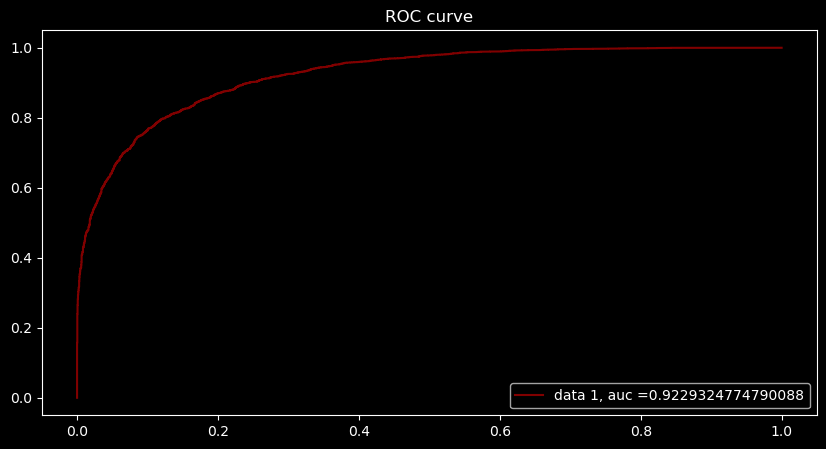

In [24]:
auc = metrics.roc_auc_score(y_test, y_pred_log )
plt.plot(fpr, tpr, label = "data 1, auc ="+str(auc), color = 'maroon')
plt.legend(loc=4)
plt.title("ROC curve")
plt.show()

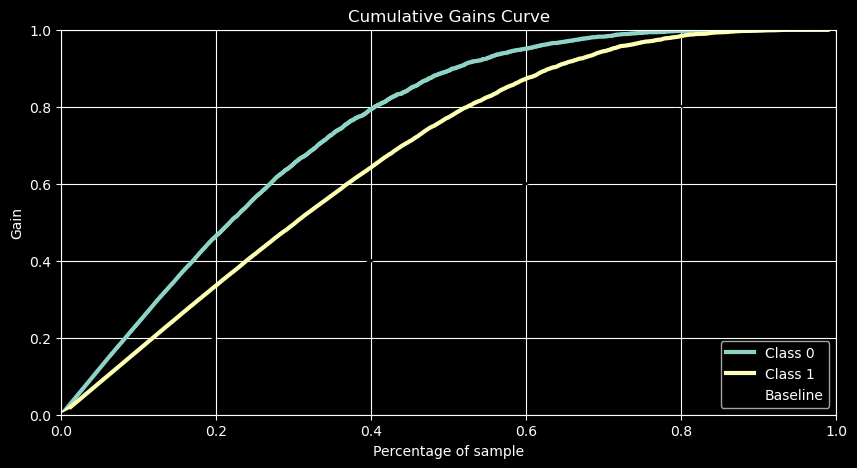

In [25]:
import scikitplot as skplt
skplt.metrics.plot_cumulative_gain(y_test, model.predict_proba(X_test))
plt.show()

In [26]:
# Getting the best coefficients
feature_imp = model.coef_ # .coef_: use to extract all the coefficients
coef_table = pd.DataFrame({"feature_names":X_train.columns, "Beta":feature_imp[0], "AbsBeta":abs(feature_imp[0])})

# Get the sorted values
coef_table = coef_table.sort_values(by='AbsBeta', ascending = False)
print("The most important features in the model are: \n")
coef_table
# the absolute value of coefficent is higher --> the feature is more important
# what are the features that drive churn rate higher

The most important features in the model are: 



,feature_names,Beta,AbsBeta
5,FG_PCT_away,-17.885183,17.885183
0,FG_PCT_home,17.809989,17.809989
2,FG3_PCT_home,4.669203,4.669203
7,FG3_PCT_away,-4.611214,4.611214
1,FT_PCT_home,3.416628,3.416628
6,FT_PCT_away,-3.383918,3.383918
9,REB_away,-0.095112,0.095112
8,AST_away,-0.086580,0.086580
4,REB_home,0.085946,0.085946
3,AST_home,0.083341,0.083341


/Users/maggiechuang/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'FG_PCT_away'),
  Text(1, 0, 'FG_PCT_home'),
  Text(2, 0, 'FG3_PCT_home'),
  Text(3, 0, 'FG3_PCT_away'),
  Text(4, 0, 'FT_PCT_home'),
  Text(5, 0, 'FT_PCT_away'),
  Text(6, 0, 'REB_away'),
  Text(7, 0, 'AST_away'),
  Text(8, 0, 'REB_home'),
  Text(9, 0, 'AST_home')])

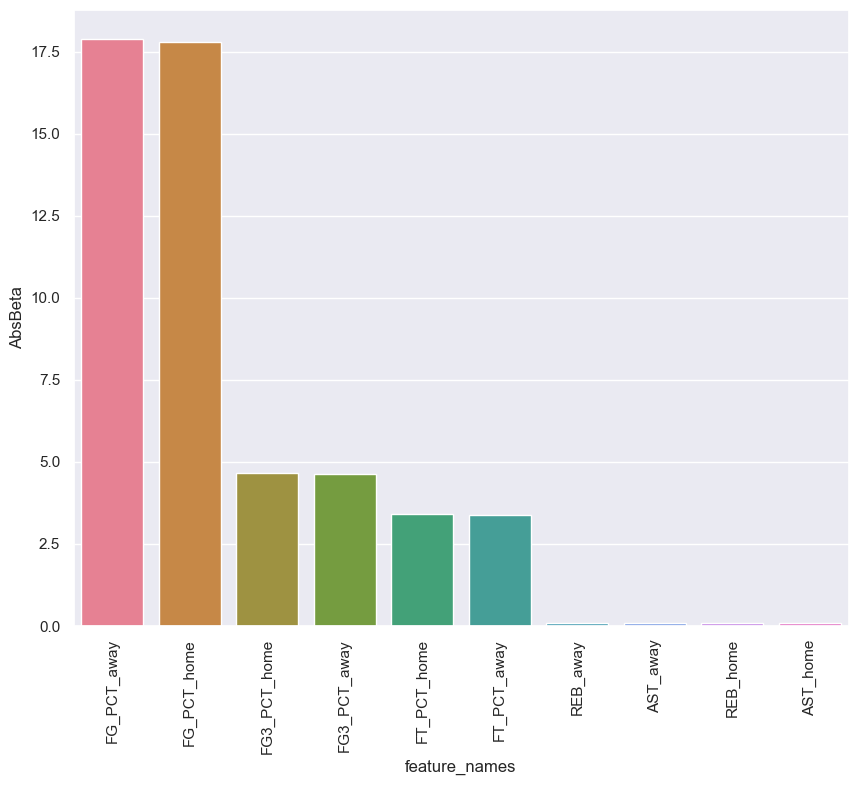

In [28]:
#plotting the features
sns.set()
plt.figure(figsize=(10,8))
sns.barplot(coef_table['feature_names'],coef_table['AbsBeta'],palette="husl")
plt.xticks(rotation=90)